# Trx Statistical characteristics of HARP receptors
*Xue-Jian Jiang*, *Taishi Nammoto*, *Izumi Mizuno*

## Index

#### I. Introduction
    1. Harp receptors
    2. TRX (total noise temperature)
    3. Trapped flux
    4. Warm-up
    5. Lo-frequency, Rf-frequency, and If-frequency
    6. Benefits to know the characteristics
    7. Data source

#### II. Plot Introduction
    1. Most observed frequency ranges
    2. The relation of receptors and TRX in specific frequency range
    3. The relation of receptors and observed time in specific frequency range
    4. The relation of receptors and specific frequency
    5. The relation of receptors and focused dates for high TRX
    6. List of dates when over 35 % of high TRX was observed entirely
    7. Each receptor's relation of frequency and TRX
    8. Each receptor's relation of time and TRX in specific frequency range
    9. Each receptor's relation of time and TRX for high TRX in specific frequency range
    10. Each receptor's relation of specific frequency range for high TRX in specific time

#### III. Discussion
    1. LSB and USB have different frequency ranges including a large number of observations
    2. In 345.5-346.0GHz, all receptors with LSB are more reliable than the ones with USB.
    3. Operator may not notice high TRX value
    4. Outline of responses related to each plot

# I. Introduction

## 1. Harp receptors

Harp is a receiver which consists of 16 different receptors. It is aimed at mapping large areas. There are currently 14 operational receptors. Each receptor has two different sidebands. One is the Lower Side Band (LSB). Another is the Upper Side Band (USB). This report focuses on the characteristics of the 14 receptors with LSB and USB.

## 2. TRX (receiver noise temperature)

TRX is receiver noise temperature (unit: Kelvin). TRX is estimated from equations below. 

$P_1(amb)=Gk(T_{RX}+T_{warm})$

$P_2(amb)=Gk(T_{RX}+T_{cold})$

$P_1(amb)$ and $P_2(amb)$ are output. 

$T_{warm}$ and $T_{cold}$ are two different tmperatures in calibrator. 

## 3. Trapped flux

Quantized vortices of magnetic flux tend to be trapped by defects in superconducting film (a part of instrument). The vortices move by the influence of external magnetic field. The movement of magnetic flux results in an increment of noise temperature (TRX). 

## 4. Warm-up

'Warm-up' refers to adding small amount of heat. The added heat eventually destrys Trapped flux vortices. Therefore, noise (TRX) is resulted in decresement. Overall, operator is supporsed to warm up receptors to remove Trapped flux and reduce high TRX. 

## 5. Lo-frequency, Rf-frequency, and If-frequency

Rf-frequency is radio frequency. Rf-frequency is converted to lower frequency which is IF-frequency.
By making lower frequency, process will be much easier. 
To convert If-frequency, Lo-frequency is injected. 
Lo-frequency stands for Local oscillator frequency. 
The equations on the bottom is the relationship of the frequency. 

(USB) $IF frequency = RF frequency - Lo frequency $

(LSB) $IF frequency = LO frequency - RF frequency$

## 6. Benefits to know the characteristics

There are three major benefits by understanding the characteristics of Harp receptors. One is to enhance understanding of normal TRX value within several frequency ranges. Today, each receptor's TRX value is displayed with Rf-frequency on 'Tonight' website in which opeator daily checks TRX value. By knowing normal TRX with several frequency ranges, operator would be easier to decide whether they need to warm up the receptors or not. 

## 7. Data source

- Data is collected by JCMT
- Data is filtered only when doors are opened
- Data includes from January, 2015 to May, 2019
- Data includes information of 14 receptors. 

# II. Plot Introduction

## Select Lo-frequency or Rf-frequency in the box below

Please run the box below

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statistics as st
import matplotlib, os
import warnings
from datetime import datetime as dt
import datetime as dt2
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
from astropy.time import Time # pip install astropy'
from scipy.stats import gaussian_kde
from IPython.display import Image
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

warnings.filterwarnings('ignore')
plt.rcParams['axes.grid'] = True

In [16]:
params = {
    'text.latex.preamble': ['\\usepackage{gensymb}'],
    'image.origin': 'lower',
    'image.interpolation': 'nearest',
    'image.cmap': 'gray',
    'axes.grid': True,
    'savefig.dpi': 200,  # to adjust notebook inline plot size
    'axes.labelsize': 12, # fontsize for x and y labels (was 10)
    'axes.titlesize': 12,
    'font.size': 10, # was 10
    'legend.fontsize': 12, # was 10
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'text.usetex': True,
    'figure.figsize': [8, 5],
    'font.family': 'serif',
}
#matplotlib.rcParams.update(params)

In [17]:
@interact

def show_images(file=os.listdir('images/')):
    fdir='images/'
    display(Image(fdir+file))

interactive(children=(Dropdown(description='file', options=('Trx_median_USB.png', 'Trx_median_LSB.png', 'Trx_u…

In [9]:
# 20200306 
# Xuejian Jiang
data_dir = 'data/'
file = 'merged_H%s_%s.txt'  %(format(0, '02d'),'LSB')
data=pd.read_csv(os.path.join(data_dir,file), header = None, sep=' ')
data.columns = ['utdate', 'obsnum', 'subsysnr','lofreq', 'iffreq', 'rffreq', 
            'date', 'time', 'tau', 'el', 'trx', 'tsys',# 'Doorstst', 'Doorsten', 'receptor', 'sideband', 'utc'
               ]
data['UTC']=pd.to_datetime(data['date']+' '+data['time'])

# get range of utdate
date_range = [str(data.iloc[0,0]), str(data.iloc[-1,0])]

# sidebands
sb_ = ['LSB','USB']

In [25]:
# combine data for LSB and USB.
alldata_LSB = []
alldata_USB = []
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15]:
    receptor = i
    file = 'merged_H%s_%s.txt'  %(format(receptor, '02d'),'LSB')
    data = pd.read_csv(os.path.join(data_dir,file), header = None, sep=' ')
    data.columns = ['utdate', 'obsnum', 'subsysnr','lofreq', 'iffreq', 'rffreq', 
            'date', 'time', 'tau', 'el', 'trx', 'tsys',# 'Doorstst', 'Doorsten', 'receptor', 'sideband', 'utc'
                   ]
    data['UTC'] = pd.to_datetime(data['date']+' '+data['time'])
    alldata_LSB.append(data)
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15]:
    receptor = i
    file = 'merged_H%s_%s.txt'  %(format(receptor, '02d'),'USB')
    data=pd.read_csv(os.path.join(data_dir,file), header = None, sep=' ')
    data.columns = ['utdate', 'obsnum', 'subsysnr','lofreq', 'iffreq', 'rffreq', 
            'date', 'time', 'tau', 'el', 'trx', 'tsys',# 'Doorstst', 'Doorsten', 'receptor', 'sideband', 'utc'
                   ]
    data['UTC'] = pd.to_datetime(data['date']+' '+data['time'])
    alldata_USB.append(data)
 

In [96]:
alldata_LSB[1][alldata_LSB[1]['utdate'] > 20191121]

,utdate,obsnum,subsysnr,lofreq,iffreq,rffreq,date,time,tau,el,trx,tsys,UTC
11168,20191123,15,1,350.832241,5.0,345.854423,2019-11-23,06:33:59,0.243232,43.612461046,149.907410,1217.794189,2019-11-23 06:33:59
11169,20191123,18,1,343.462950,5.0,338.463806,2019-11-23,06:53:41,0.240116,44.0701988097,160.363953,1201.928589,2019-11-23 06:53:41
11170,20191125,9,1,350.832444,5.0,345.854423,2019-11-25,03:46:28,0.159356,71.0214953114,149.251694,476.084930,2019-11-25 03:46:28
11171,20191125,10,1,343.394647,5.0,338.412642,2019-11-25,03:52:16,0.161377,62.7514188759,170.709152,550.632751,2019-11-25 03:52:16
11172,20191125,12,1,342.069229,5.0,337.083622,2019-11-25,04:04:51,0.160483,55.5685990388,147.706635,655.357971,2019-11-25 04:04:51
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11712,20200209,44,1,350.773203,5.0,345.777878,2020-02-09,12:13:38,0.069485,39.7119511018,142.083862,259.056854,2020-02-09 12:13:38
11713,20200209,45,1,350.773177,5.0,345.777878,2020-02-09,12:27:10,0.068540,36.9289219372,145.480713,268.066010,2020-02-09 12:27:10
11714,20200209,48,1,350.799374,5.0,345.804046,2020-02-09,12:52:07,0.070474,40.1058066076,141.415009,258.984589,2020-02-09 12:52:07
11715,20200225,18,1,350.810873,5.0,345.817510,2020-02-25,14:04:47,0.034586,28.6491584783,138.588120,220.497559,2020-02-25 14:04:47


## 1. Each receptor's median TRX

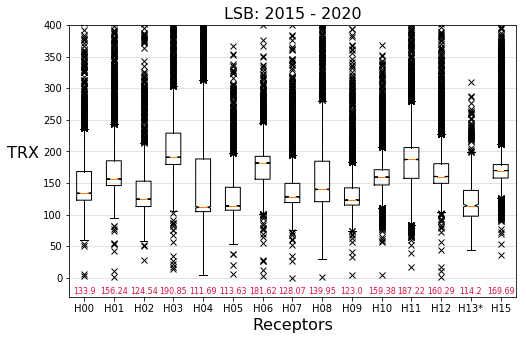

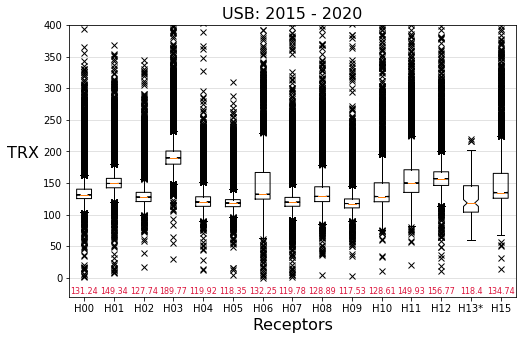

In [27]:
for sb in sb_:
#sb = sb
#alldata = pd.DataFrame(np.zeros([len(data[0]),14]))
    trxdata = [] # combine trx data from all receptors, 12-element list
    medians = [] 
    if (sb=='LSB'):alldata = alldata_LSB
    if (sb=='USB'):alldata = alldata_USB
    
    for i in np.arange(len(alldata)):
        trxdata.append(alldata[i].trx)
        medians.append(np.median(alldata[i].trx))
   
    pos = np.arange(len(data)) + 1
    lower_labels = [str(np.round(s, 2)) for s in medians]
    #weights = ['bold', 'semibold']    

    fig1, ax1 = plt.subplots(figsize=(8,5))
    ax1.boxplot(trxdata, notch=True, sym='x',
                labels=['H00','H01','H02','H03','H04','H05','H06','H07','H08','H09','H10','H11','H12','H13*','H15'])
    for tick, label in zip(range(15), ax1.get_xticklabels()):
        k = tick % 2
        ax1.text(pos[tick], .01, lower_labels[tick],
                 transform=ax1.get_xaxis_transform(),
                 horizontalalignment='center', color='crimson',fontsize=8
                )
    # Add a horizontal grid to the plot, but make it very light in color
    # so we can use it for reading data values but not be distracting
    ax1.yaxis.grid(True, linestyle='-', which='both', color='lightgrey',
                   alpha=0.8)
    ax1.xaxis.grid(False)
    # Hide these grid behind plot objects
    ax1.set_axisbelow(True)
    ax1.set_ylim(-30,400)
    ax1.set_title(sb +': 2015 - 2020', fontsize=16)
    ax1.set_xlabel('Receptors',fontsize=16)
    ax1.set_ylabel('TRX',fontsize=16, rotation=0, labelpad=20)

    fig1.savefig("images/Trx_median_"+sb+'.png',dpi=200)

## 2. Each receptor's TRX vs. Frequency

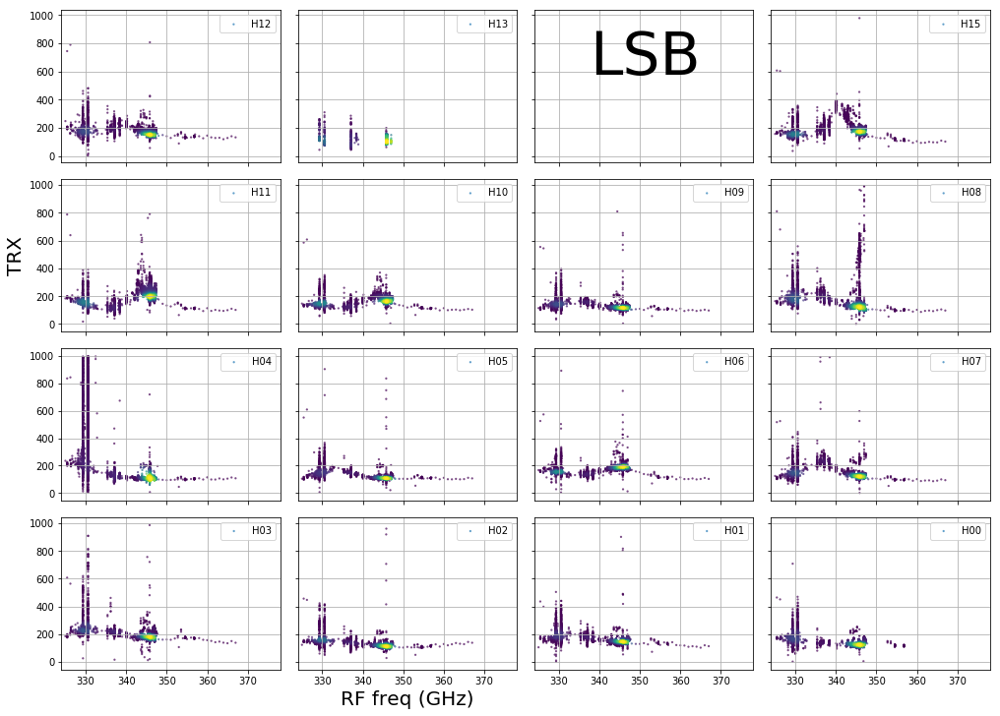

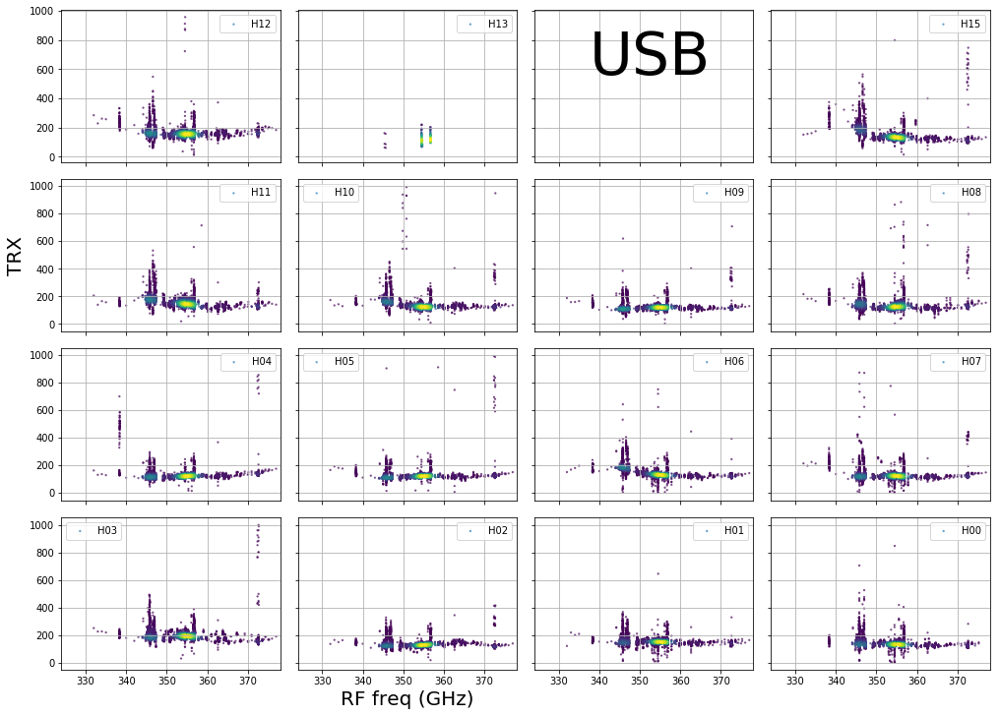

In [31]:
start=324
end  =378
column = 'rffreq'

def plot_trx_freq(alldata, column, i, m, n, start,end):
    xy = np.vstack([alldata[i][column], alldata[i]["trx"]])
    z = gaussian_kde(xy)(xy) # derive the density for color coding
    idx = z.argsort()        # sort the data to make the densest data points on top
    x, y, z = alldata[i][column][idx], alldata[i]["trx"][idx], z[idx]
    if (i==14): ax[m,n].scatter(x, y, c=z, edgecolor='', 
                    alpha= 0.7, s = 5, label='H%s'% format(i+1, '02d'))
    if (i!=14): ax[m,n].scatter(x, y, c=z, edgecolor='', 
                    alpha= 0.7, s = 5, label='H%s'% format(i, '02d'))
    ax[m,n].legend()
    ax[m,n].set_xlim(start,end)
    #https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density-in-matplotlib
    
for sb in sb_:
    fig, ax = plt.subplots(4, 4, sharex='col', sharey='row', constrained_layout=True,
                gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(14,10))
    if (sb=='LSB'):alldata = alldata_LSB
    if (sb=='USB'):alldata = alldata_USB
    i=0                   # receptor index
    for m in [3,2,1]:
        for n in [3,2,1,0]:
            if (m==3 or m==1):
                plot_trx_freq(alldata,column, i, m, n, start,end)
                i = i+1    
            if (m==2):
                plot_trx_freq(alldata,column, 11-i, m, n, start,end)
                i = i+1     
    plot_trx_freq(alldata, column, 12, 0,0, start,end)
    plot_trx_freq(alldata, column, 13, 0,1, start,end)
    plot_trx_freq(alldata, column, 14, 0,3, start,end)
    
    ax[3,1].set_xlabel('RF freq (GHz)', fontsize=20)
    ax[1,0].set_ylabel('TRX', fontsize=20)
    fig.text(0.59, 0.9 , sb, fontsize=60)
    fig.savefig("images/Trx_rffreq_"+sb+'.png',dpi=200)

## 3. Each receptor's TRX vs. UTdate, color coded by frequencies.

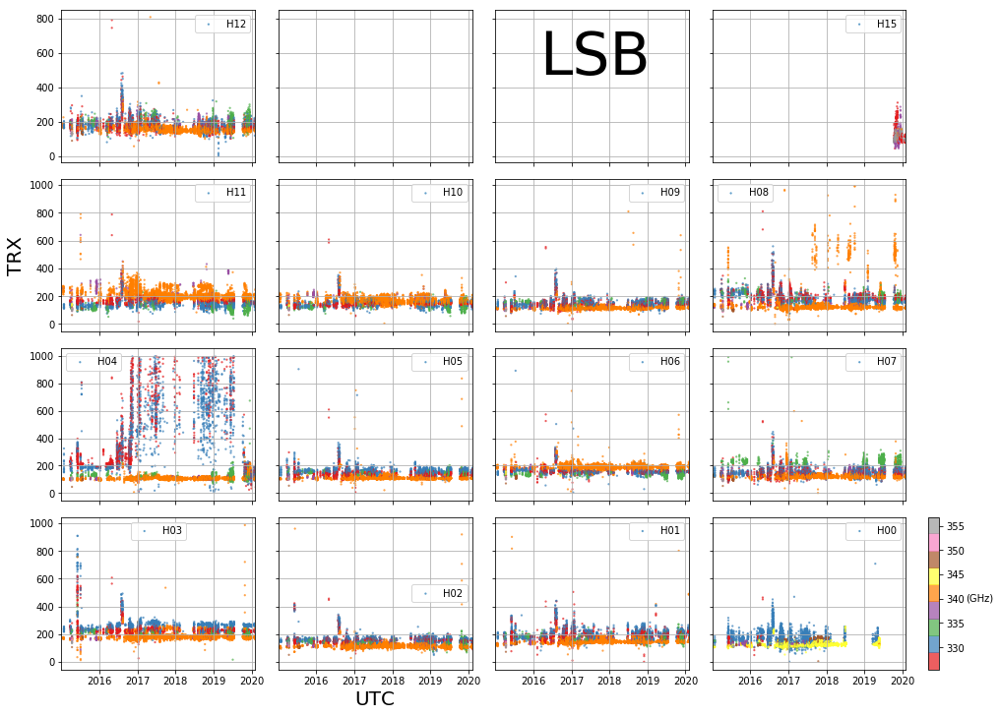

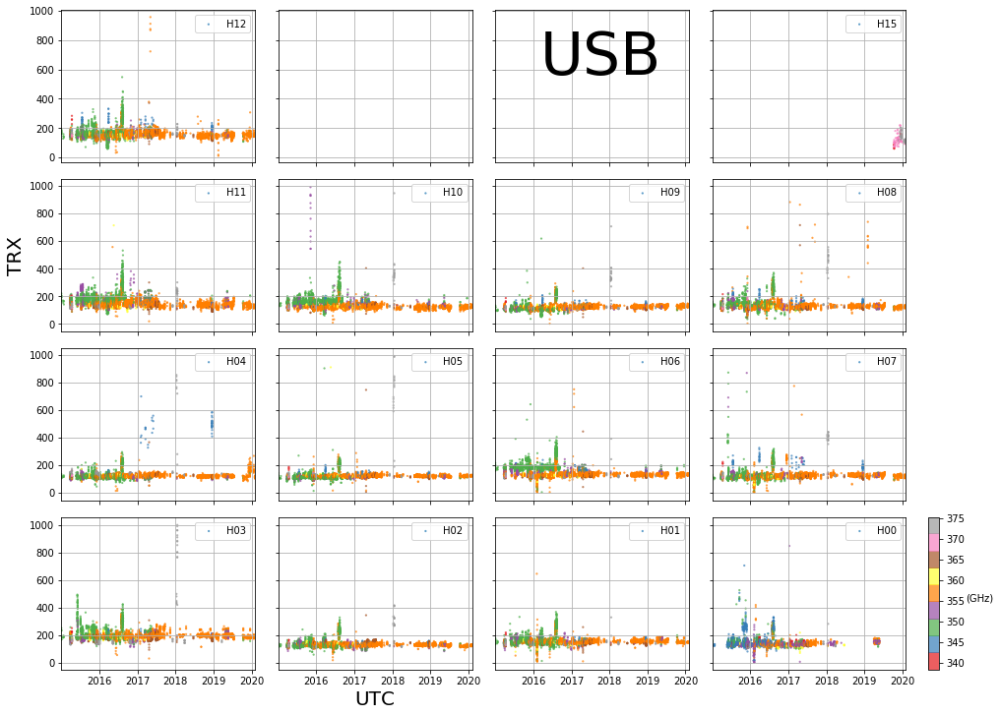

In [80]:
start=data.iloc[0,12]
end  =data.iloc[-1,12]
column = 'UTC'
colormap = plt.cm.Set1     #or any other colormap

def plot_trx_time(alldata, column, i, m, n, start,end):
    x, y = alldata[i][column], alldata[i]["trx"]
    z = alldata[i]['rffreq']
    norm = matplotlib.colors.Normalize(vmin=min(z), vmax=max(z))
    if (i==13): cs=ax[m,n].scatter(x, y, c=z, cmap=colormap, norm=norm, edgecolor='', 
                    alpha= 0.7, s = 5, label='H%s'% format(i+2, '02d'))
    if (i!=13): cs=ax[m,n].scatter(x, y, c=z, cmap=colormap, norm=norm, edgecolor='', 
                    alpha= 0.7, s = 5, label='H%s'% format(i, '02d'))
    ax[m,n].legend()
    ax[m,n].set_xlim(start,end)
    plt_sets.append(cs)
    
for sb in sb_:
    plt_sets=[]
    fig, ax = plt.subplots(4, 4, sharex='col', sharey='row', constrained_layout=True,
                gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(14,10))
    if (sb=='LSB'):alldata = alldata_LSB
    if (sb=='USB'):alldata = alldata_USB
    i=0                   # receptor index
    for m in [3,2,1]:
        for n in [3,2,1,0]:
            if (m==3 or m==1):
                plot_trx_time(alldata, column, i, m, n, start,end)
                i = i+1# ; plt_sets.append(cs)    
            if (m==2):
                plot_trx_time(alldata, column, 11-i, m, n, start,end)
                i = i+1# ; plt_sets.append(cs)
    plot_trx_time(alldata, column, 12, 0,0,  start,end)#; plt_sets.append(cs)
    plot_trx_time(alldata, column, 13, 0,3,  start,end)#; plt_sets.append(cs)
    cbar=plt.colorbar(plt_sets[0])
    cbar.set_label('(GHz)', rotation=0,labelpad=15)
    #fig.text(0.5,-0.02, column, ha='center', fontsize=18)
    #fig.text(-0.02, 0.5, 'TRX', va='center', rotation='horizontal', fontsize=18)
    ax[3,1].set_xlabel(column, fontsize=20)
    ax[1,0].set_ylabel('TRX', fontsize=20)
    fig.text(0.54, 0.9 , sb, fontsize=60)
    fig.savefig("images/Trx_utdate_"+sb+'.png',dpi=200)

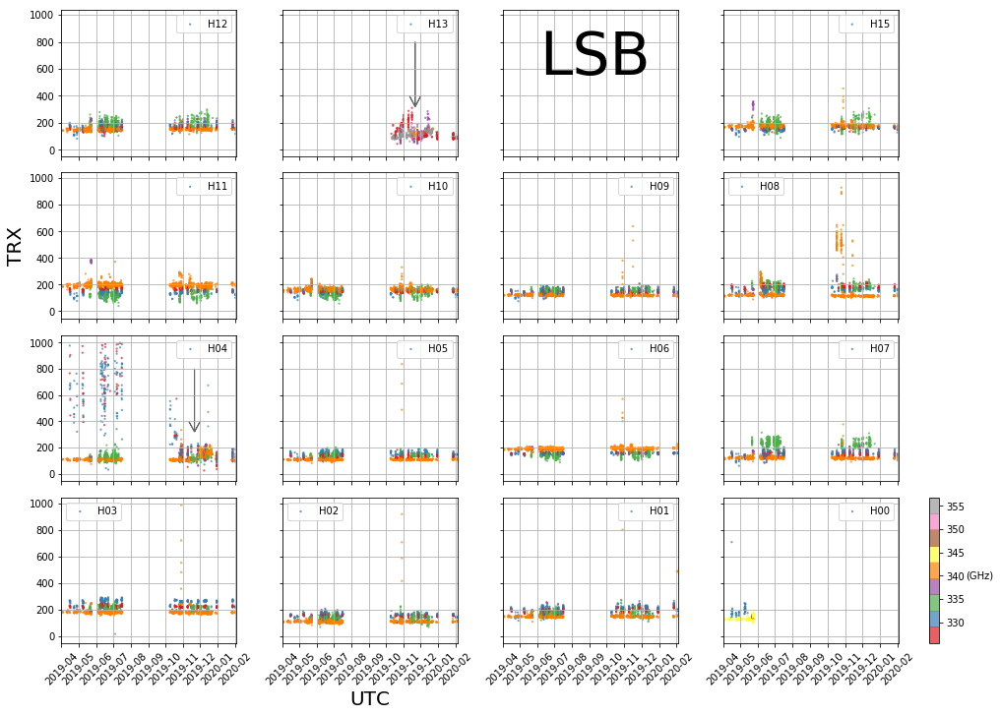

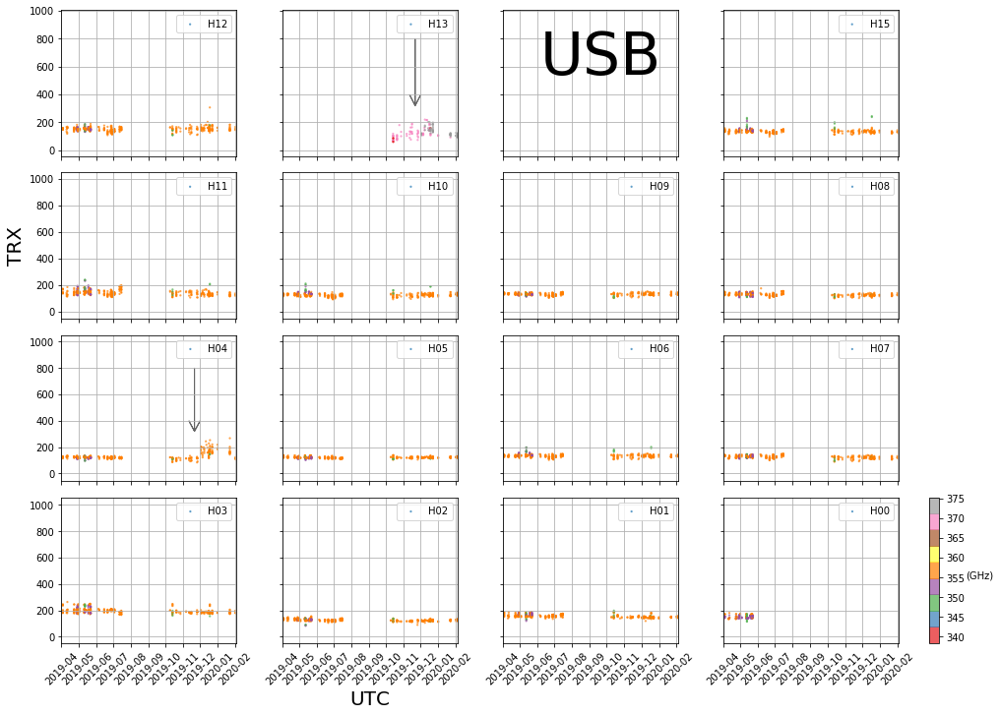

In [102]:
start='20190401'
end  =data.iloc[-1,12]
column = 'UTC'
colormap = plt.cm.Set1     #or any other colormap

def plot_trx_time(alldata, column, i, m, n, start,end):
    x, y = alldata[i][column], alldata[i]["trx"]
    z = alldata[i]['rffreq']
    norm = matplotlib.colors.Normalize(vmin=min(z), vmax=max(z))
    if (i==14): cs=ax[m,n].scatter(x, y, c=z, cmap=colormap, norm=norm, edgecolor='', 
                    alpha= 0.7, s = 5, label='H%s'% format(i+1, '02d'))
    if (i!=14): cs=ax[m,n].scatter(x, y, c=z, cmap=colormap, norm=norm, edgecolor='', 
                    alpha= 0.7, s = 5, label='H%s'% format(i, '02d'))
    ax[m,n].legend()
    ax[m,n].set_xlim(start,end)
    ax[m,n].tick_params('x', labelrotation=45)
    plt_sets.append(cs)
    
for sb in sb_:
    plt_sets=[]
    fig, ax = plt.subplots(4, 4, sharex='col', sharey='row', constrained_layout=True,
                gridspec_kw={'hspace': 0, 'wspace': 0}, figsize=(14,10))
    if (sb=='LSB'):alldata = alldata_LSB
    if (sb=='USB'):alldata = alldata_USB
    i=0                   # receptor index
    for m in [3,2,1]:
        for n in [3,2,1,0]:
            if (m==3 or m==1):
                plot_trx_time(alldata, column, i, m, n, start,end)
            if (m==2):
                plot_trx_time(alldata, column, 11-i, m, n, start,end)
            #if (i== 4 or i==13): 
            i = i+1

    plot_trx_time(alldata, column, 12, 0,0,  start,end)#; plt_sets.append(cs)
    plot_trx_time(alldata, column, 13, 0,1,  start,end)#; plt_sets.append(cs)
    plot_trx_time(alldata, column, 14, 0,3,  start,end)#; plt_sets.append(cs)
    xx = alldata_LSB[2].loc[alldata_LSB[2]['utdate'] == 20191121].head(1)['UTC']
    ax[2,0].arrow(xx, 800, 0, -400, head_width=20, head_length=80, fc='w', ec='k', alpha=.6, overhang=1)
    ax[0,1].arrow(xx, 800, 0, -400, head_width=20, head_length=80, fc='w', ec='k', alpha=.6, overhang=1)
    cbar=plt.colorbar(plt_sets[0])
    cbar.set_label('(GHz)', rotation=0,labelpad=15)
    ax[3,1].set_xlabel(column, fontsize=20)
    ax[1,0].set_ylabel('TRX', fontsize=20)
    fig.text(0.54, 0.9 , sb, fontsize=60)
    fig.savefig("images/Trx_utdate2_"+sb+'.png',dpi=200)

# Below was from Taishi Nammoto's original notebook

## 1. Most observed frequency ranges

The purpose of this project is to understand normal TRX. In other words, it is necessary to find median of TRX. However, median of TRX changes with the frequency range. If a wide frequency range is selected to compute a median of TRX, the median would be unclear compared to another median computed in a short frequency range. Thus, a median in a shorter frequency range would be closer to the true median. Also, a median computed in a larger amount of data is statistically more reliable. Before finding a median in a short frequency range, it is important to find short frequency ranges with a large amount of observations. The plot below shows the frequency range including large number of observations. The separation of frequency is set at 0.5 GHz. 

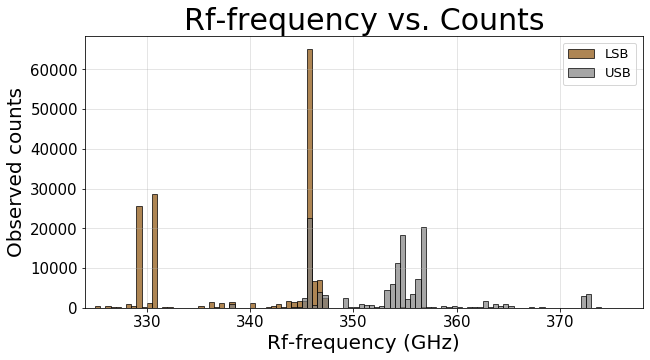

Figure A-0: Observed counts vs. Rf-frequency


In [195]:
all_s=['LSB', 'USB']
fig, ax = plt.subplots(figsize=(10,5))
for s in all_s:
    txtfile = pd.read_csv(file, header = 0, sep=' ')
    txtfile2=txtfile[txtfile['sideband']==s]
    if freq_type=='lofreq':
        start=326
        stop=373
    elif freq_type=='rffreq':
        start=324
        stop=378
    if s=='LSB':
        color='#8c510a'
    elif s=='USB':
        color='grey'
    interval=(txtfile2[freq_type].max()-txtfile2[freq_type].min())/.5
    interval=round(interval,0)
    ax.hist(txtfile2[freq_type], int(interval), facecolor=color, edgecolor='black', alpha=0.7, label=s)
ax.set_xlim(start, stop)
ax.set_xlabel(freq_name+' (GHz)', fontsize = 20)
ax.set_ylabel('Observed counts', fontsize = 20)
ax.set_title(freq_name+' vs. Counts', fontsize = 30)
plt.setp(ax.get_xticklabels(), fontsize=15)
plt.setp(ax.get_yticklabels(), fontsize=15)
legend=ax.legend(loc='best', fancybox= True, fontsize=13)
plt.setp(legend,alpha=0.7)
legend._legend_box.align='left'
ax.grid(alpha=.4)
plt.show()
print('Figure A-0: Observed counts vs. '+freq_name)

The plot above shows most observed frequency ranges for every receptor with LSB and USB. Some people might doubt that some receptors may not follow this characteristic. It means that some receptors might have large number of observation in a different frequency ranges. Just to clear this question, plots for each receptor with each sideband are illustrated below. 

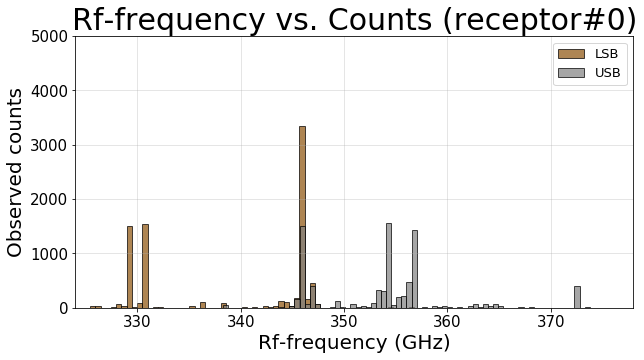

Figure A-1: Observed counts vs. Rf-frequency (receptor#0USB)


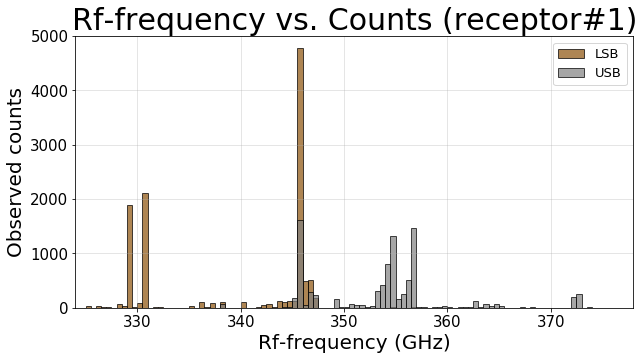

Figure A-2: Observed counts vs. Rf-frequency (receptor#1USB)


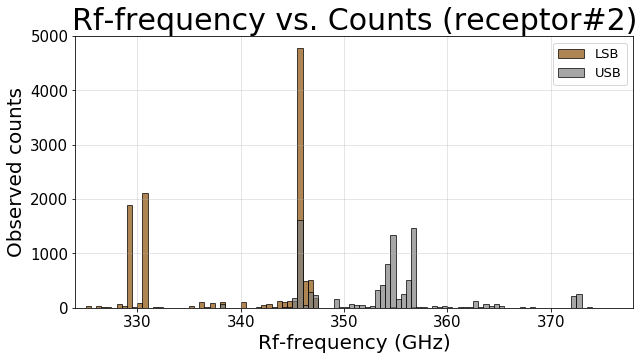

Figure A-3: Observed counts vs. Rf-frequency (receptor#2USB)


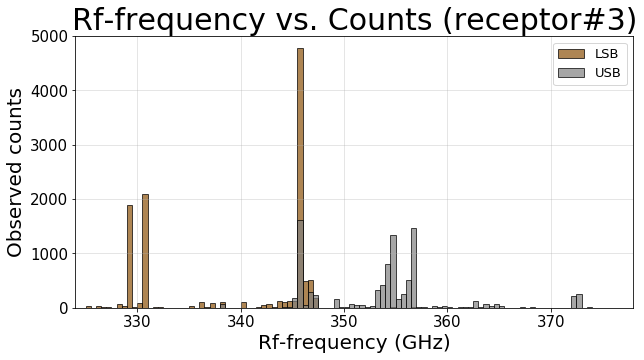

Figure A-4: Observed counts vs. Rf-frequency (receptor#3USB)


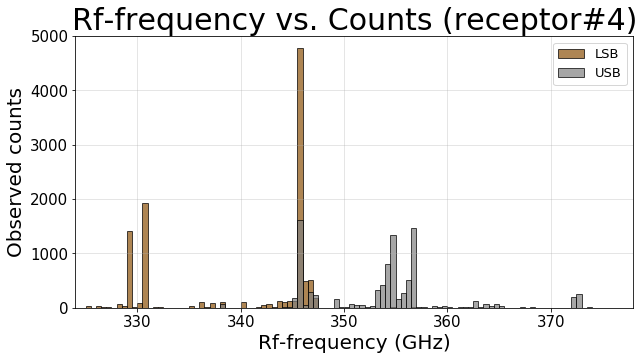

Figure A-5: Observed counts vs. Rf-frequency (receptor#4USB)


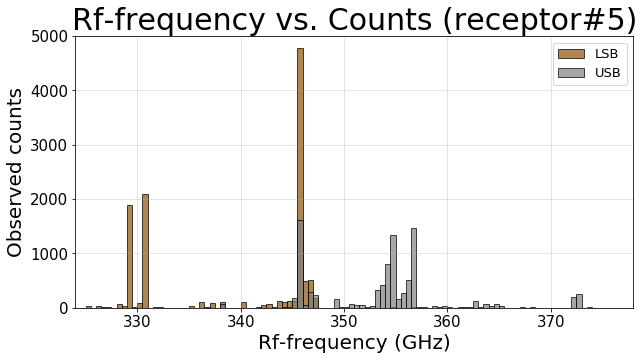

Figure A-6: Observed counts vs. Rf-frequency (receptor#5USB)


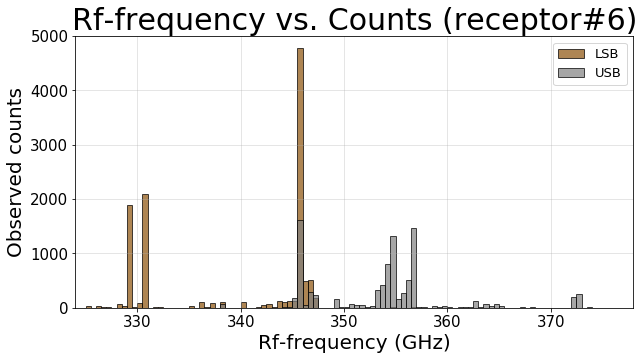

Figure A-7: Observed counts vs. Rf-frequency (receptor#6USB)


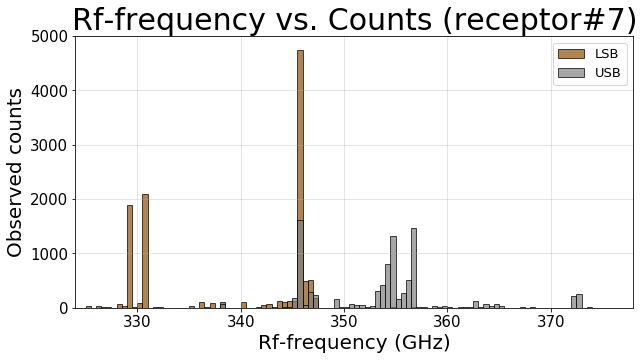

Figure A-8: Observed counts vs. Rf-frequency (receptor#7USB)


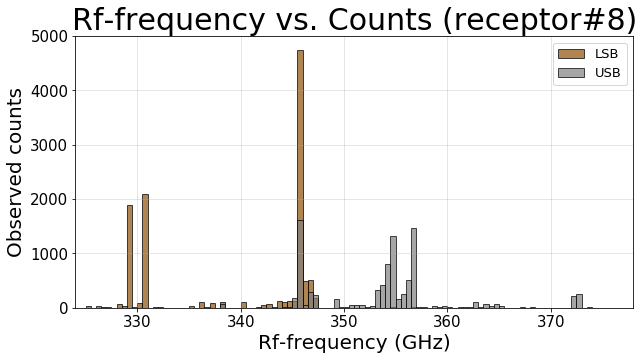

Figure A-9: Observed counts vs. Rf-frequency (receptor#8USB)


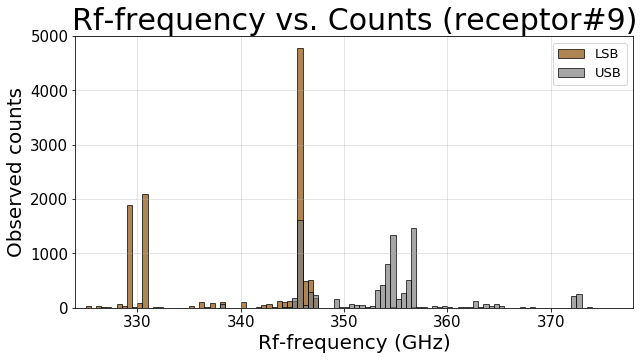

Figure A-10: Observed counts vs. Rf-frequency (receptor#9USB)


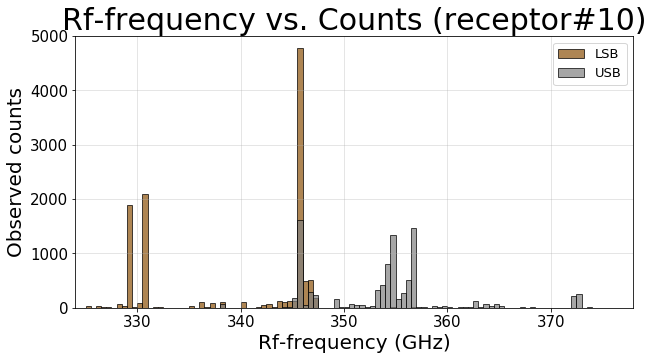

Figure A-11: Observed counts vs. Rf-frequency (receptor#10USB)


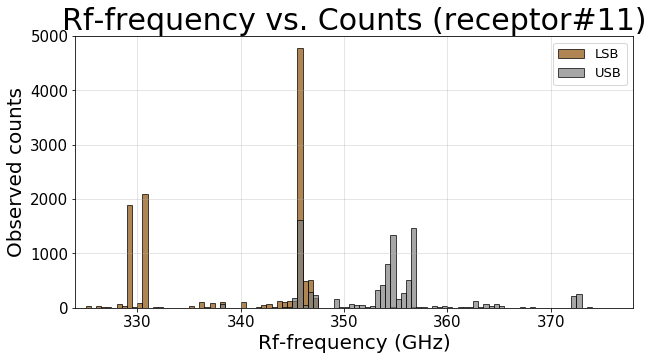

Figure A-12: Observed counts vs. Rf-frequency (receptor#11USB)


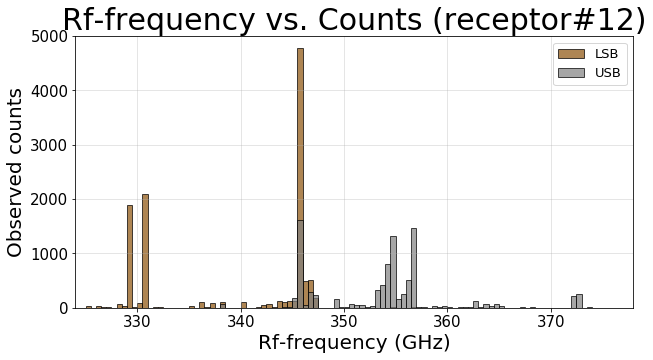

Figure A-13: Observed counts vs. Rf-frequency (receptor#12USB)


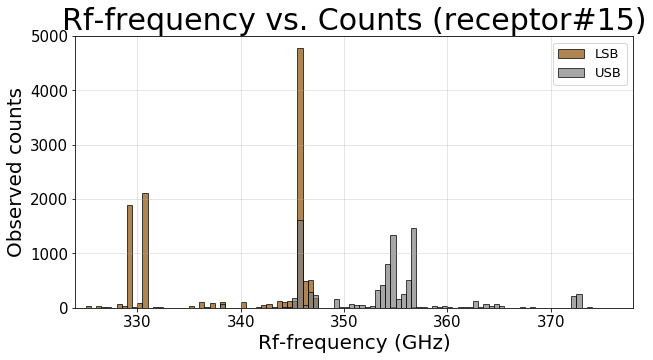

Figure A-14: Observed counts vs. Rf-frequency (receptor#15USB)


In [196]:
num=1
all_s = ['LSB','USB']
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
    fig, ax5 = plt.subplots(figsize=(10,5))
    for s in all_s:
        txtfile = pd.read_csv(file, header = 0, sep=' ')
        txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile['receptor']==i)]
        if freq_type=='lofreq':
            start=326
            stop=373
            interval=(txtfile2[freq_type].max()-txtfile2[freq_type].min())/.5
        elif freq_type=='rffreq':
            start=324
            stop=378
            if (i==0)&(s=='LSB'): 
                interval=63
            if (i==0)&(s=='USB'):
                interval=75  
            else:
                interval=(txtfile2[freq_type].max()-txtfile2[freq_type].min())/.5
        if s=='LSB':
            color='#8c510a'
        elif s=='USB':
            color='grey'
        ax5.set_xlim(start, stop)
        ax5.hist(txtfile2[freq_type], int(interval), facecolor=color, edgecolor='black', alpha=0.7, label=s)
        ax5.set_xlim(start, stop)
        ax5.set_ylim(0,5000)
        ax5.set_xlabel(freq_name+' (GHz)', fontsize = 20)
        ax5.set_ylabel('Observed counts', fontsize = 20)
        ax5.set_title(freq_name+' vs. Counts (receptor#' +str(i) +  ')', fontsize = 30)
        plt.setp(ax5.get_xticklabels(), fontsize=15)
        plt.setp(ax5.get_yticklabels(), fontsize=15)
        ax5.grid(alpha=.4)
        legend3=ax5.legend(loc='best', fancybox= True, fontsize=13)
        plt.setp(legend3,alpha=0.7)
        legend3._legend_box.align='left'
    plt.show()
    print('Figure A-'+str(num)+': Observed counts vs. '+freq_name+' (receptor#'+str(i)+s+')')
    num=num+1

#### In case of Rf-frequency: 
The plots above show that all receptors have large number of observations within same frequency ranges. As mentioned before, the separation of the bars are 0.5 (GHz). Therefore, receptors with LSB have a large amount of data in 329.0-329.5, 330.5-331.0, 345.5-346.0 (GHz). Receptors with USB have a large amount of data in 345.5-346.0, 354.5-355.0, 356.5-357.0 (GHz). 

## 2. The relation of receptors and TRX in specific frequency range

#### In case of Rf-frequency: 
According to Figure A, receptors with LSB have a large amount of data in 329.0-329.5, 330.5-331, 345.5-346.0 (GHz). Receptors with USB have a large amount of data in 345.5-346.0, 354.5-355.0, 356.5-357.0 (GHz). The plots below reveal the relation of receptors and TRX in these frequency ranges including large data. A top line in a box plot is the positive two sigma range. A middle line in a box is the median value. A bottom line in a box is the negative two sigma range.

3.2% of high TRX at receptor #0
4.8% of high TRX at receptor #1
3.9% of high TRX at receptor #2
5.0% of high TRX at receptor #3
11.3% of high TRX at receptor #4
4.7% of high TRX at receptor #5
4.4% of high TRX at receptor #6
4.1% of high TRX at receptor #7
4.7% of high TRX at receptor #8
4.0% of high TRX at receptor #9
3.1% of high TRX at receptor #10
3.4% of high TRX at receptor #11
4.4% of high TRX at receptor #12
3.6% of high TRX at receptor #15


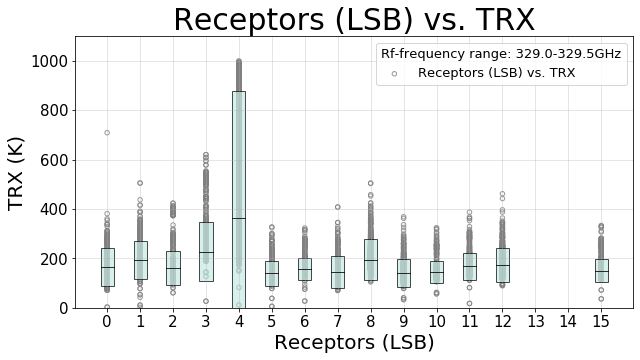

Figure B-0: TRX vs. Receptor# (LSB), 329.0-329.5

3.2% of high TRX at receptor #0
4.7% of high TRX at receptor #1
4.0% of high TRX at receptor #2
3.9% of high TRX at receptor #3
2.7% of high TRX at receptor #4
3.7% of high TRX at receptor #5
3.1% of high TRX at receptor #6
3.8% of high TRX at receptor #7
3.7% of high TRX at receptor #8
3.6% of high TRX at receptor #9
2.9% of high TRX at receptor #10
3.0% of high TRX at receptor #11
3.4% of high TRX at receptor #12
3.3% of high TRX at receptor #15


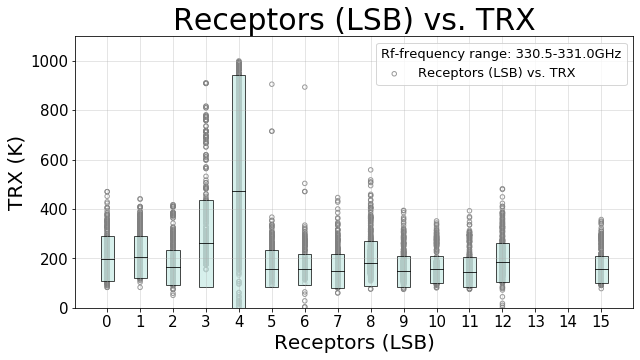

Figure B-1: TRX vs. Receptor# (LSB), 330.5-331.0

4.5% of high TRX at receptor #0
0.7% of high TRX at receptor #1
0.3% of high TRX at receptor #2
1.1% of high TRX at receptor #3
0.3% of high TRX at receptor #4
0.3% of high TRX at receptor #5
1.1% of high TRX at receptor #6
1.4% of high TRX at receptor #7
3.7% of high TRX at receptor #8
3.0% of high TRX at receptor #9
5.6% of high TRX at receptor #10
7.4% of high TRX at receptor #11
1.7% of high TRX at receptor #12
1.6% of high TRX at receptor #15


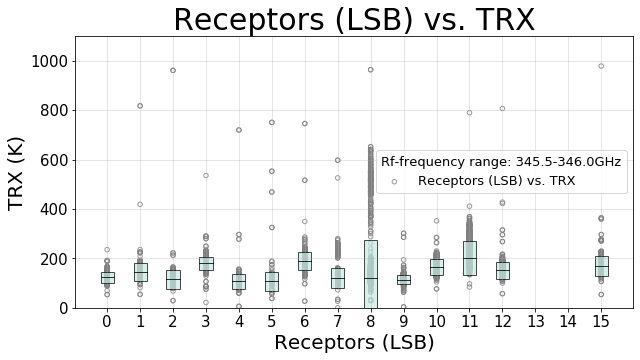

Figure B-2: TRX vs. Receptor# (LSB), 345.5-346.0



In [197]:
s= 'LSB'
if freq_type=='lofreq':
    f_min=[334.5,350.5,351.0]
elif freq_type=='rffreq':
    f_min=[329.0,330.5,345.5]
num=0
txtfile = pd.read_csv(file, header = 0, sep=' ')
for f in f_min:
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)]
    fig, ax = plt.subplots(figsize=(10,5))
    ax.scatter(txtfile2['receptor'], txtfile2['trx'], facecolor = 'none'
               , edgecolor = "grey", alpha= 0.8, s = 20, label='Receptors (LSB) vs. TRX')
    ax.set_xlabel('Receptors (LSB)', fontsize = 20)
    ax.set_ylabel('TRX (K)', fontsize = 20)
    ax.set_title('Receptors (LSB) vs. TRX', fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' 
                     + str(f) + '-' + str(f+0.5) + 'GHz', fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    ax.set_ylim(0,1100)
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        txtfile3=txtfile2[txtfile2['receptor']==i]
        trx = txtfile3['trx']
        stdev= st.stdev(trx)
        median= round(st.median(trx),1)
        range_max= round(median+(stdev*2),1)
        range_min= round(median-(stdev*2),1)
        height = range_max - range_min
        width = 0.4       
        ax.plot((i-.2, i+.2), (median, median), 'black', Linewidth = 0.8)
        rect=matplotlib.patches.Rectangle((i-.2,range_min), width, height,
                                          facecolor='#c7eae5', edgecolor='black', alpha=0.7)
        ax.add_patch(rect)        
        over = txtfile3['trx'][(txtfile3['trx']>range_max)]
        total= txtfile3['trx']
        num_over= over.count()
        num_total= total.count()
        percent=(num_over/num_total)*100
        print(str(round(percent,1))+'% of high TRX at receptor #'+str(i))     
    plt.show()
    print('Figure B-'+str(num)+': TRX vs. Receptor# (LSB), '+str(f)+'-'+str(f+0.5))
    num=num+1
    print()

9.8% of high TRX at receptor #0
5.9% of high TRX at receptor #1
5.8% of high TRX at receptor #2
8.7% of high TRX at receptor #3
6.2% of high TRX at receptor #4
5.4% of high TRX at receptor #5
5.8% of high TRX at receptor #6
2.6% of high TRX at receptor #7
6.4% of high TRX at receptor #8
5.8% of high TRX at receptor #9
5.8% of high TRX at receptor #10
5.1% of high TRX at receptor #11
6.6% of high TRX at receptor #12
5.7% of high TRX at receptor #15


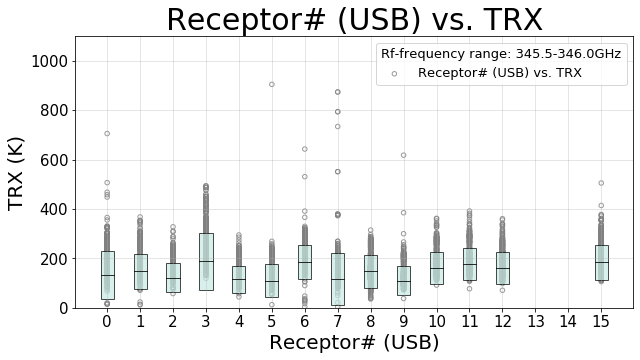

Figure B-3: TRX vs. Receptor# (USB), 345.5-346.0

0.3% of high TRX at receptor #0
0.2% of high TRX at receptor #1
3.6% of high TRX at receptor #2
2.6% of high TRX at receptor #3
2.8% of high TRX at receptor #4
1.6% of high TRX at receptor #5
0.2% of high TRX at receptor #6
0.1% of high TRX at receptor #7
0.5% of high TRX at receptor #8
3.3% of high TRX at receptor #9
3.7% of high TRX at receptor #10
4.9% of high TRX at receptor #11
0.4% of high TRX at receptor #12
0.1% of high TRX at receptor #15


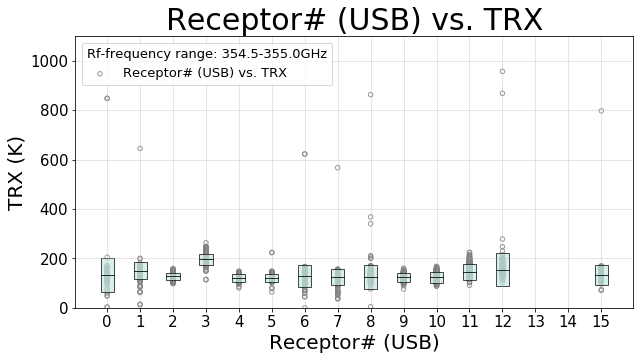

Figure B-4: TRX vs. Receptor# (USB), 354.5-355.0

5.5% of high TRX at receptor #0
5.3% of high TRX at receptor #1
5.2% of high TRX at receptor #2
7.5% of high TRX at receptor #3
5.3% of high TRX at receptor #4
5.3% of high TRX at receptor #5
5.1% of high TRX at receptor #6
5.7% of high TRX at receptor #7
3.5% of high TRX at receptor #8
5.0% of high TRX at receptor #9
5.1% of high TRX at receptor #10
4.9% of high TRX at receptor #11
4.4% of high TRX at receptor #12
5.3% of high TRX at receptor #15


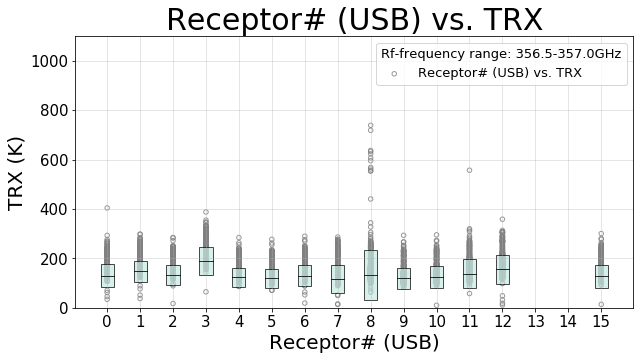

Figure B-5: TRX vs. Receptor# (USB), 356.5-357.0



In [198]:
s= 'USB'
if freq_type=='lofreq':
    f_min=[340.5,349.5,351.5]
elif freq_type=='rffreq':
    f_min=[345.5,354.5,356.5]
num=3
txtfile = pd.read_csv(file, header = 0, sep=' ')
for f in f_min:
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)]
    fig, ax = plt.subplots(figsize=(10,5))
    ax.scatter(txtfile2['receptor'], txtfile2['trx'], facecolor = 'none'
               , edgecolor = "grey", alpha= 0.8, s = 20, label='Receptor# (USB) vs. TRX')
    ax.set_xlabel('Receptor# (USB)', fontsize = 20)
    ax.set_ylabel('TRX (K)', fontsize = 20)
    ax.set_title('Receptor# (USB) vs. TRX', fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f)
                     + '-' + str(f+0.5) + 'GHz', fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    ax.set_ylim(0,1100)
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        txtfile3=txtfile2[txtfile2['receptor']==i]
        trx = txtfile3['trx']
        stdev= st.stdev(trx)
        median= round(st.median(trx),1)
        range_max= round(median+(stdev*2),1)
        range_min= round(median-(stdev*2),1)
        height = range_max - range_min
        width = 0.4        
        ax.plot((i-.2, i+.2), (median, median), 'black', Linewidth = 0.8)
        rect=matplotlib.patches.Rectangle((i-.2,range_min), width, height
                                          , facecolor='#c7eae5', edgecolor='black', alpha=0.7)
        ax.add_patch(rect)        
        over = txtfile3['trx'][(txtfile3['trx']>range_max)]
        total= txtfile3['trx']
        num_over= over.count()
        num_total= total.count()
        percent=(num_over/num_total)*100
        print(str(round(percent,1))+'% of high TRX at receptor #'+str(i))     
    plt.show()
    print('Figure B-'+str(num)+': TRX vs. Receptor# (USB), '+str(f)+'-'+str(f+0.5))
    num=num+1
    print()

## 3. The relation of receptors and observed time in specific frequency range

The plots below describes the relation of receptors and observed time in specific frequency range. In the plots, normal TRX refers to the TRX values which are below the two sigma in Figure B. On the other hand, high TRX indicates the TRX values which are over the two sigma in Figure B. The plots below compare observed time between normal TRX and high TRX for all receptors. 

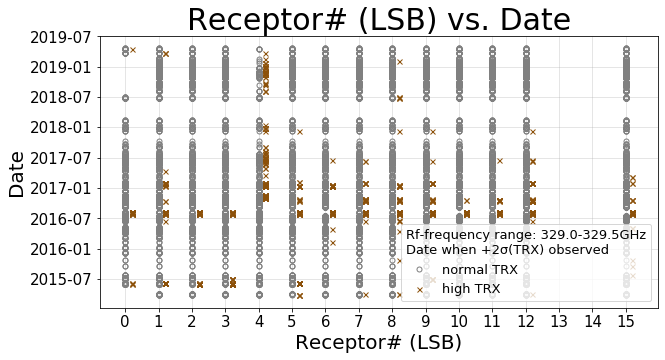

Figure C-0: Receptor# (LSB) vs. Date, 329.0-329.5


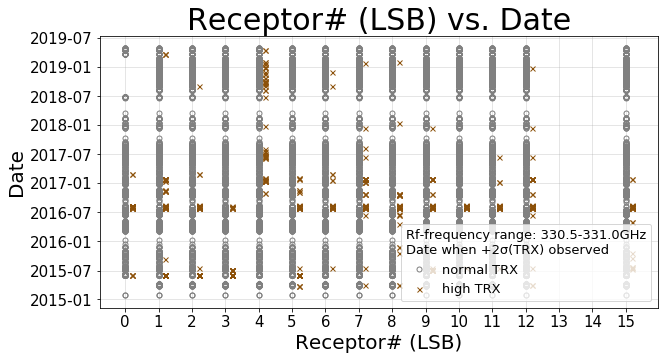

Figure C-1: Receptor# (LSB) vs. Date, 330.5-331.0


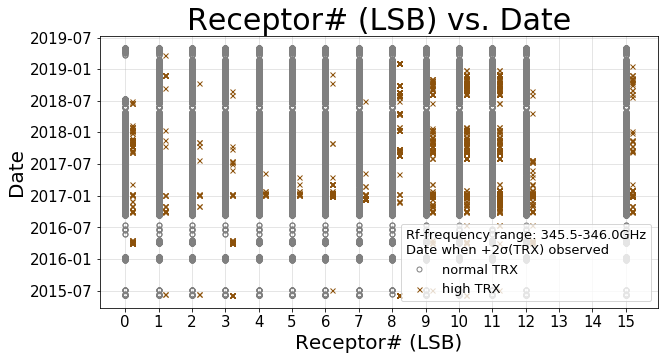

Figure C-2: Receptor# (LSB) vs. Date, 345.5-346.0


In [199]:
num=0
s= 'LSB'
if freq_type=='lofreq':
    f_min=[334.5,350.5,351.0]
elif freq_type=='rffreq':
    f_min=[329.0,330.5,345.5]
txtfile = pd.read_csv(file, header = 0, sep=' ')
txtfile['utc'] = pd.to_datetime(txtfile['utc'], format='%Y-%m-%d %H:%M:%S.%f')
for f in f_min:
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)]
    fig, ax = plt.subplots(figsize=(10,5))
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        trx = txtfile2['trx'][txtfile2['receptor']==i]
        stdev= st.stdev(trx)
        median= round(st.median(trx),1)
        range_max= round(median+(stdev*2),1)
        range_min= round(median-(stdev*2),1)        
        txtfile3=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']>=range_max)]
        txtfile4=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']<range_max)]
        txtfile3['receptor']=txtfile3['receptor']+.2
        txtfile4['receptor']=txtfile4['receptor']
        if i==15:
            ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='normal TRX'
                    , markersize=5, markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='high TRX'
                    , markersize=5, markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
        else:
            ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='_nolegend_'
                    , markersize=5, markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='_nolegend_'
                    , markersize=5, markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')        
    ax.set_xlabel('Receptor# (LSB)', fontsize = 20)
    ax.set_ylabel('Date', fontsize = 20)
    ax.set_title('Receptor# (LSB) vs. Date', fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f) + '-' + str(f+0.5) + 'GHz'+'\n'
                     +'Date when +2σ(TRX) observed', fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    plt.show()
    print('Figure C-'+str(num)+': Receptor# (LSB) vs. Date, '+ str(f)+'-'+str(f+.5))
    num=num+1

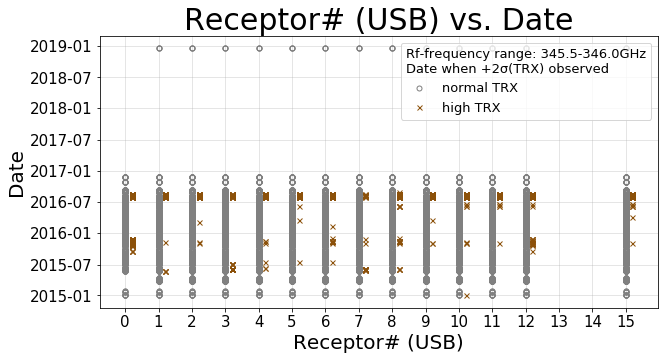

Figure C-3: Receptor#(USB) vs. Date, 345.5-346.0


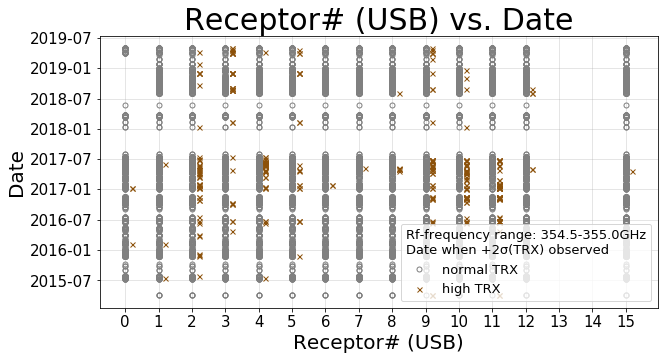

Figure C-4: Receptor#(USB) vs. Date, 354.5-355.0


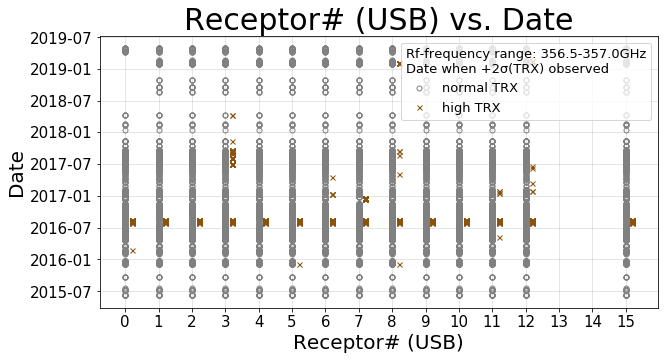

Figure C-5: Receptor#(USB) vs. Date, 356.5-357.0


In [200]:
s= 'USB'
if freq_type=='lofreq':
    f_min=[340.5,349.5,351.5]
elif freq_type=='rffreq':
    f_min=[345.5,354.5,356.5]
num=3
txtfile = pd.read_csv(file, header = 0, sep=' ')
txtfile['utc'] = pd.to_datetime(txtfile['utc'], format='%Y-%m-%d %H:%M:%S.%f')
for f in f_min:
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)]
    fig, ax = plt.subplots(figsize=(10,5))
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        trx = txtfile2['trx'][txtfile2['receptor']==i]
        stdev= st.stdev(trx)
        median= round(st.median(trx),1)
        range_max= round(median+(stdev*2),1)
        range_min= round(median-(stdev*2),1)       
        txtfile3=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']>=range_max)]
        txtfile4=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']<range_max)]
        txtfile3['receptor']=txtfile3['receptor']+.2
        txtfile4['receptor']=txtfile4['receptor']
        if i==15:
            ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='normal TRX'
                    , markersize=5, markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='high TRX'
                    , markersize=5, markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
        else:
            ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='_nolegend_'
                    , markersize=5, markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='_nolegend_'
                    , markersize=5, markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')        
    ax.set_xlabel('Receptor# (USB)', fontsize = 20)
    ax.set_ylabel('Date', fontsize = 20)
    ax.set_title('Receptor# (USB) vs. Date', fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f) + '-' + str(f+0.5) + 'GHz'+'\n'
                     +'Date when +2σ(TRX) observed', fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    plt.show()
    print('Figure C-'+str(num)+': Receptor#(USB) vs. Date, '+ str(f)+'-'+str(f+.5))
    num=num+1

## 4. The relation of receptors and specific frequency 

The plots below describes the relation of receptors and specific frequency. In the plots, normal TRX refers to the TRX values which are below the two sigma in Figure B. On the other hand, high TRX indicates the TRX values which are over the two sigma in Figure B. The plots below compare frequency of normal TRX and frequency of high TRX. 

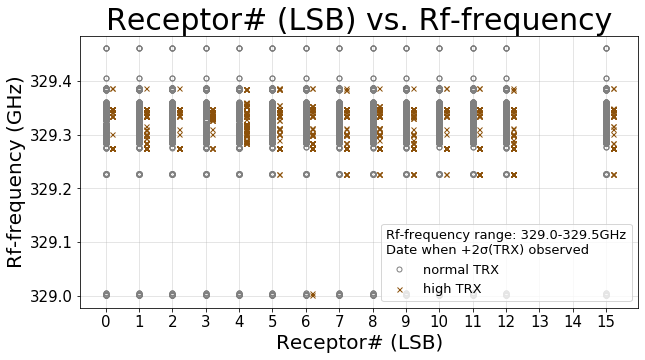

Figure D-0: Receptor# (LSB) vs Rf-frequency, 329.0-329.5


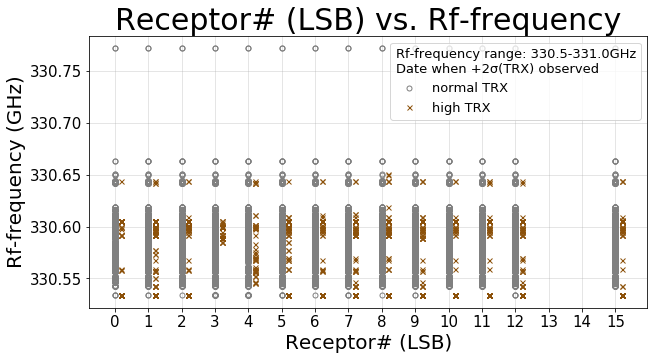

Figure D-1: Receptor# (LSB) vs Rf-frequency, 330.5-331.0


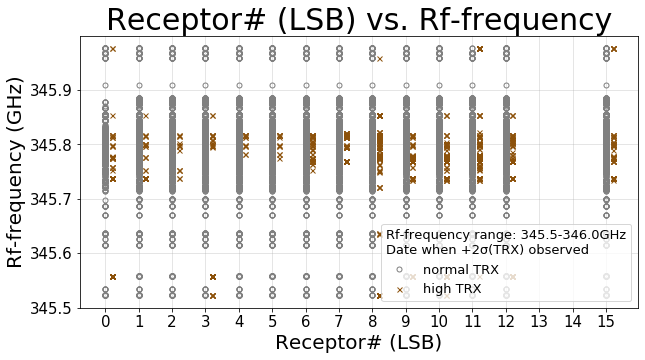

Figure D-2: Receptor# (LSB) vs Rf-frequency, 345.5-346.0


In [201]:
s= 'LSB'
if freq_type=='lofreq':
    f_min=[334.5,350.5,351.0]
elif freq_type=='rffreq':
    f_min=[329.0,330.5,345.5]
num=0
txtfile = pd.read_csv(file, header = 0, sep=' ')
for f in f_min:
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)]
    fig, ax = plt.subplots(figsize=(10,5))
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        trx = txtfile2['trx'][txtfile2['receptor']==i]
        stdev= st.stdev(trx)
        median= round(st.median(trx),1)
        range_max= round(median+(stdev*2),1)
        range_min= round(median-(stdev*2),1)       
        txtfile3=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']>=range_max)]
        txtfile4=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']<range_max)]
        txtfile3['receptor']=txtfile3['receptor']+.2
        if i==15:
            ax.plot(txtfile4['receptor'], txtfile4[freq_type], marker='o',label='normal TRX'
                    , markersize=5, markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3[freq_type], marker='x',label='high TRX'
                    , markersize=5, markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
        else:
            ax.plot(txtfile4['receptor'], txtfile4[freq_type], marker='o',label='_nolegend_'
                    , markersize=5, markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3[freq_type], marker='x',label='_nolegend_'
                    , markersize=5, markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
        
    ax.set_xlabel('Receptor# (LSB)', fontsize = 20)
    ax.set_ylabel(freq_name+' (GHz)', fontsize = 20)
    ax.set_title('Receptor# (LSB) vs. '+freq_name, fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f) + '-' + str(f+0.5) + 'GHz'+'\n'
                     +'Date when +2σ(TRX) observed', fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    plt.show()
    print('Figure D-'+str(num)+': Receptor# (LSB) vs '+freq_name+', '+ str(f)+'-'+str(f+.5))
    num=num+1

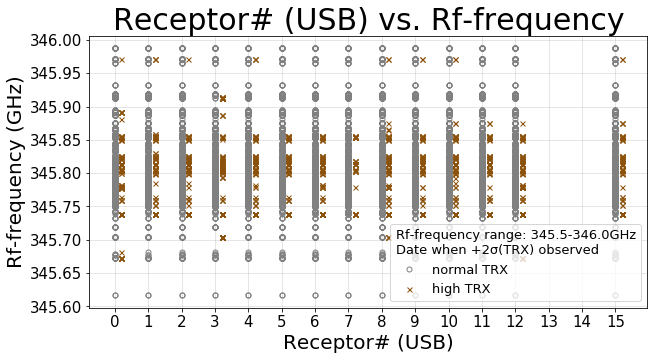

Figure D-3: Receptor# (USB) vs Rf-frequency, 345.5-346.0


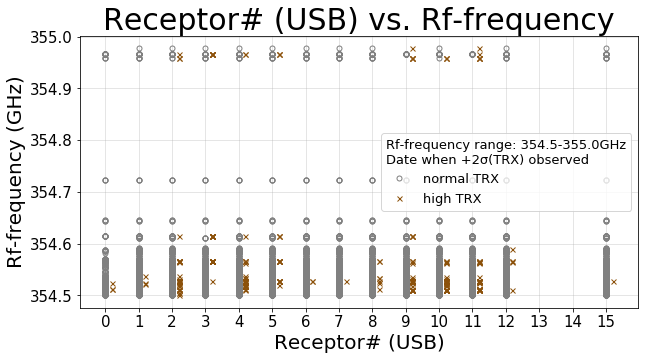

Figure D-4: Receptor# (USB) vs Rf-frequency, 354.5-355.0


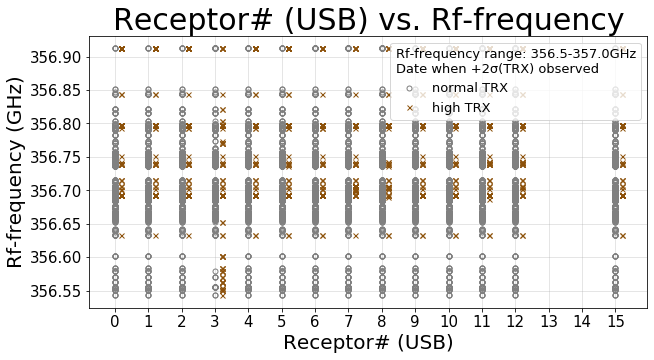

Figure D-5: Receptor# (USB) vs Rf-frequency, 356.5-357.0


In [202]:
s= 'USB'
if freq_type=='lofreq':
    f_min=[340.5,349.5,351.5]
elif freq_type=='rffreq':
    f_min=[345.5,354.5,356.5]
num=3
txtfile = pd.read_csv(file, header = 0, sep=' ')

for f in f_min:
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)]
    fig, ax = plt.subplots(figsize=(10,5))
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        trx = txtfile2['trx'][txtfile2['receptor']==i]
        stdev= st.stdev(trx)
        median= round(st.median(trx),1)
        range_max= round(median+(stdev*2),1)
        range_min= round(median-(stdev*2),1)        
        txtfile3=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']>=range_max)]
        txtfile4=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']<range_max)]
        txtfile3['receptor']=txtfile3['receptor']+.2
        if i==15:
            ax.plot(txtfile4['receptor'], txtfile4[freq_type], marker='o',label='normal TRX', markersize=5
                    , markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3[freq_type], marker='x',label='high TRX', markersize=5
                    , markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
        else:
            ax.plot(txtfile4['receptor'], txtfile4[freq_type], marker='o',label='_nolegend_', markersize=5
                    , markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
            ax.plot(txtfile3['receptor'], txtfile3[freq_type], marker='x',label='_nolegend_', markersize=5
                    , markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')        
    ax.set_xlabel('Receptor# (USB)', fontsize = 20)
    ax.set_ylabel(freq_name+' (GHz)', fontsize = 20)
    ax.set_title('Receptor# (USB) vs. '+freq_name, fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f) + '-' + str(f+0.5) + 'GHz'+'\n'
                     +'Date when +2σ(TRX) observed', fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    plt.show()
    print('Figure D-'+str(num)+': Receptor# (USB) vs '+freq_name+', '+ str(f)+'-'+str(f+.5))
    num=num+1

## 5. The relation of receptors and focused dates for high TRX

The plots below describes the relation of receptors and focused dates. Based on Figure C, date is filtered only when high trx is observed at most of receptors. The plots below is almost same as Figure C. The only difference is whether it is specific time or not. 

#### The following figure is same as Figure C. By typing specific date range below, magnified Figure C is displayed as Figure E. 

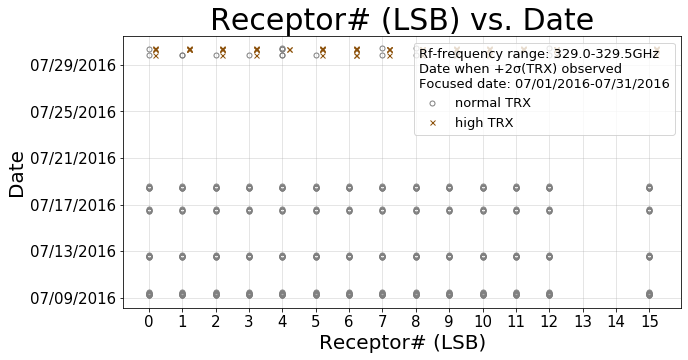

Figure E-0: Receptor# (LSB) vs Focused dates(07/01/2016 - 07/31/2016), 329.0-329.5


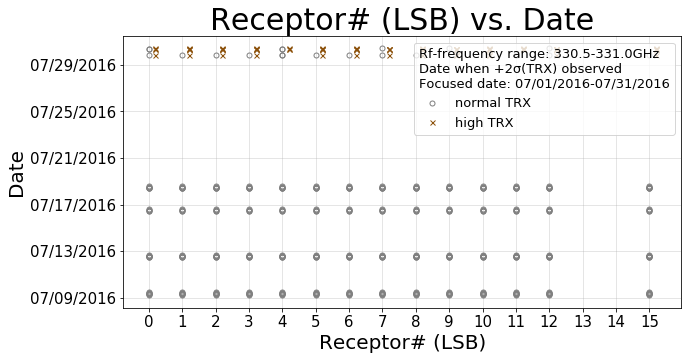

Figure E-1: Receptor# (LSB) vs Focused dates(07/01/2016 - 07/31/2016), 330.5-331.0


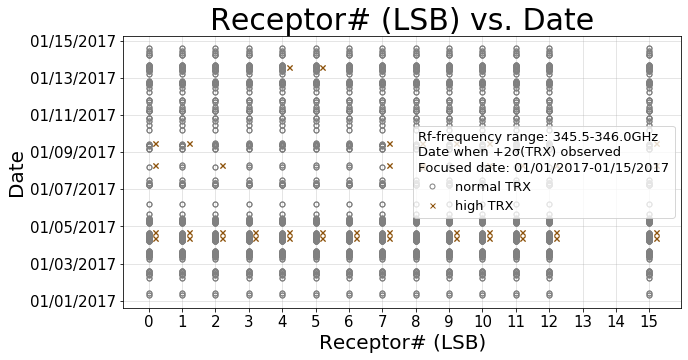

Figure E-2: Receptor# (LSB) vs Focused dates(01/01/2017 - 01/15/2017), 345.5-346.0


In [203]:
s= 'LSB'
if freq_type=='lofreq':
    f_min=[334.5,350.5,351.0]
elif freq_type=='rffreq':
    f_min=[329.0,330.5,345.5]
num=0
txtfile = pd.read_csv(file, header = 0, sep=' ')
txtfile['utc'] = pd.to_datetime(txtfile['utc'], format='%Y-%m-%d %H:%M:%S.%f')
for f in f_min:
    if (f==329.0) & (freq_type=='rffreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 7,31)
    elif (f==330.5) & (freq_type=='rffreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 7,31)
    elif (f==345.5) & (freq_type=='rffreq'):
        d_min = dt(2017, 1,1) # Specify the date range
        d_max = dt(2017, 1,15)
    if (f==334.5) & (freq_type=='lofreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 9,30)
    elif (f==350.5) & (freq_type=='lofreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 9,30)
    elif (f==351.0) & (freq_type=='lofreq'):
        d_min = dt(2017, 7,1) # Specify the date range
        d_max = dt(2017, 9,30)
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)
                     &(txtfile['utc']>=d_min)&(txtfile['utc']<d_max)]
    fig, ax = plt.subplots(figsize=(10,5))
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        trx = txtfile2['trx'][txtfile2['receptor']==i]
        if trx.count()>2:            
            stdev= st.stdev(trx)
            median= round(st.median(trx),1)
            range_max= round(median+(stdev*2),1)
            range_min= round(median-(stdev*2),1)       
            txtfile3=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']>=range_max)]
            txtfile4=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']<range_max)]
            txtfile3['receptor']=txtfile3['receptor']+.2
            if i==15:
                ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='normal TRX', markersize=5
                    , markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
                ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='high TRX', markersize=5
                    , markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
            else:
                ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='_nolegend_', markersize=5
                    , markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
                ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='_nolegend_', markersize=5
                    , markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none') 
    ax.yaxis.set_major_formatter(mdates.DateFormatter("%m/%d/%Y"))       
    ax.set_xlabel('Receptor# (LSB)', fontsize = 20)
    ax.set_ylabel('Date', fontsize = 20)
    ax.set_title('Receptor# (LSB) vs. Date', fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f) + '-' + str(f+0.5) + 'GHz'+'\n'
                         +'Date when +2σ(TRX) observed '+'\n'+'Focused date: '+str(d_min.strftime('%m/%d/%Y'))
                         +'-'+str(d_max.strftime('%m/%d/%Y')), fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    plt.show()
    print('Figure E-'+str(num)+': Receptor# (LSB) vs Focused dates('+str(d_min.strftime('%m/%d/%Y'))
          +' - '+str(d_max.strftime('%m/%d/%Y'))+'), '+ str(f)+'-'+str(f+.5))
    num=num+1

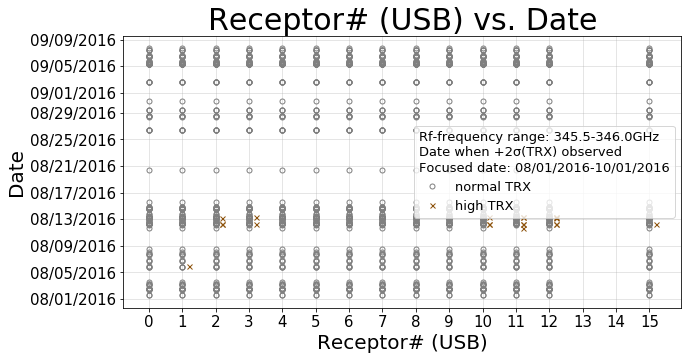

Figure E-3: Receptor# (USB) vs Focused dates(08/01/2016 - 10/01/2016), 345.5-346.0


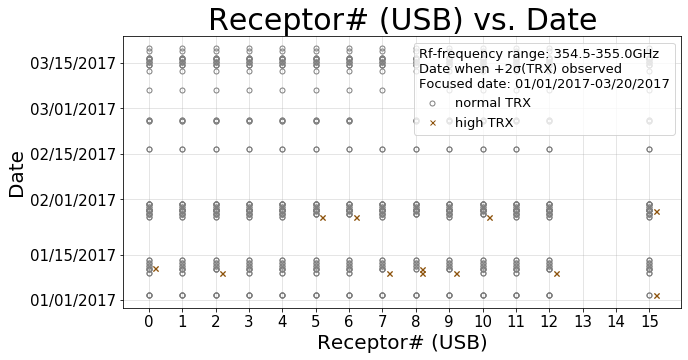

Figure E-4: Receptor# (USB) vs Focused dates(01/01/2017 - 03/20/2017), 354.5-355.0


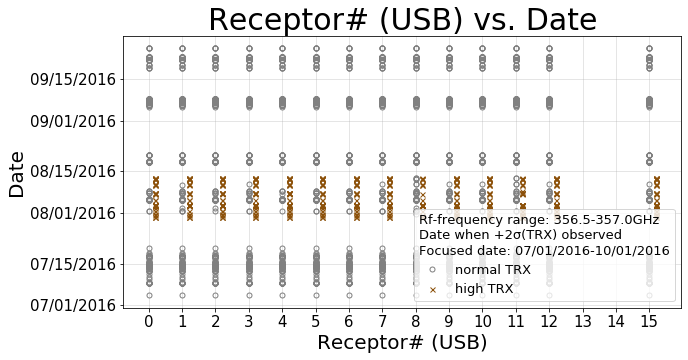

Figure E-5: Receptor# (USB) vs Focused dates(07/01/2016 - 10/01/2016), 356.5-357.0


In [204]:
s= 'USB'
if freq_type=='lofreq':
    f_min=[340.5,349.5,351.5]
elif freq_type=='rffreq':
    f_min=[345.5,354.5,356.5]
num=3
txtfile = pd.read_csv(file, header = 0, sep=' ')
txtfile['utc'] = pd.to_datetime(txtfile['utc'], format='%Y-%m-%d %H:%M:%S.%f')
for f in f_min:
    if (f==345.5) & (freq_type=='rffreq'):
        d_min = dt(2016, 8,1) # Specify the date range
        d_max = dt(2016, 10,1)
    elif (f==354.5) & (freq_type=='rffreq'):
        d_min = dt(2017, 1,1) # Specify the date range
        d_max = dt(2017, 3,20)
    elif (f==356.5) & (freq_type=='rffreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 10,1)
    if (f==340.5) & (freq_type=='lofreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 9,1)
    elif (f==349.5) & (freq_type=='lofreq'):
        d_min = dt(2017, 1,1) # Specify the date range
        d_max = dt(2017, 3,30)
    elif (f==351.5) & (freq_type=='lofreq'):
        d_min = dt(2016, 7,1) # Specify the date range
        d_max = dt(2016, 9,30)
    txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile[freq_type]>=f)&(txtfile[freq_type]<f+0.5)
                     &(txtfile['utc']>=d_min)&(txtfile['utc']<d_max)]
    fig, ax = plt.subplots(figsize=(10,5))
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
        trx = txtfile2['trx'][txtfile2['receptor']==i]
        if trx.count()>2:            
            stdev= st.stdev(trx)
            median= round(st.median(trx),1)
            range_max= round(median+(stdev*2),1)
            range_min= round(median-(stdev*2),1)        
            txtfile3=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']>=range_max)]
            txtfile4=txtfile2[(txtfile2['receptor']==i)&(txtfile2['trx']<range_max)]
            txtfile3['receptor']=txtfile3['receptor']+.2
            if i==15:
                ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='normal TRX', markersize=5
                    , markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
                ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='high TRX', markersize=5
                    , markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')
            else:
                ax.plot(txtfile4['receptor'], txtfile4['utc'], marker='o',label='_nolegend_', markersize=5
                    , markerfacecolor='none', markeredgecolor='grey', LineStyle='none')
                ax.plot(txtfile3['receptor'], txtfile3['utc'], marker='x',label='_nolegend_', markersize=5
                    , markerfacecolor='none', markeredgecolor='#8c510a', LineStyle='none')     
    ax.yaxis.set_major_formatter(mdates.DateFormatter("%m/%d/%Y"))       
    ax.set_xlabel('Receptor# (USB)', fontsize = 20)
    ax.set_ylabel('Date', fontsize = 20)
    ax.set_title('Receptor# (USB) vs. Date', fontsize = 30)
    plt.setp(ax.get_xticklabels(), fontsize=15)
    ax.xaxis.set_ticks(np.arange(0, 16, 1))
    plt.setp(ax.get_yticklabels(), fontsize=15)
    legend=ax.legend(loc='best', title= freq_name+' range: ' + str(f) + '-' + str(f+0.5) + 'GHz'+'\n'
                         +'Date when +2σ(TRX) observed '+'\n'+'Focused date: '+str(d_min.strftime('%m/%d/%Y'))
                         +'-'+str(d_max.strftime('%m/%d/%Y')), fancybox= True, fontsize=13)
    legend._legend_box.align='left'
    plt.setp(legend.get_title(),fontsize=13)
    plt.setp(legend,alpha=0.7)
    ax.grid(alpha=.4)
    ax.yaxis_date()
    plt.show()
    print('Figure E-'+str(num)+': Receptor# (USB) vs Focused dates('+str(d_min.strftime('%m/%d/%Y'))
          +' - '+str(d_max.strftime('%m/%d/%Y'))+'), '+ str(f)+'-'+str(f+.5))
    num=num+1

## 6. List of dates when over 35 % of high TRX was observed entirely

The list below shows dates when over 35 % of TRX was observed. In this lists, LSB and USB are not separated. Lo-frequency and Rf-frequency are not separated. Moreover, specific frequency is not considered to ignore dates including little high TRX. In discussion, the important fact whether operator warmed up on the dates or not will be mentioned. Also, it is nessesary to discuss which receptor and which sideband observed high TRX on the dates.

In [205]:
txtfile = pd.read_csv(file, header = 0, sep=' ')
txtfile['utc'] = pd.to_datetime(txtfile['utc'], format='%Y-%m-%d %H:%M:%S.%f')
trx=txtfile['trx']
stdev= st.stdev(trx)
median= round(st.median(trx),1)
range_max= round(median+(stdev*2),1)
date1 = txtfile['utc'].min()
date2 = txtfile['utc'].max()
day = dt2.timedelta(days=1)
while date1 < date2:
    datex=date1+day       
    over = txtfile['trx'][(txtfile['trx']>range_max)&(txtfile['utc']>=date1)&(txtfile['utc']<datex)]
    total= txtfile['trx'][(txtfile['utc']>=date1)&(txtfile['utc']<datex)]
    num_over= over.count()
    num_total= total.count()
    percent=(num_over/num_total)*100
    percent=round(percent,0)
    if percent>35:
        print(str(percent)+'% of high TRX on', date1.strftime('%Y-%m-%d'))
    date1=date1+day

55.0% of high TRX on 2016-07-29
71.0% of high TRX on 2016-07-30
51.0% of high TRX on 2016-08-03
46.0% of high TRX on 2016-08-06
40.0% of high TRX on 2016-08-07
42.0% of high TRX on 2016-08-08
58.0% of high TRX on 2016-08-11
41.0% of high TRX on 2016-08-12
44.0% of high TRX on 2016-08-13
38.0% of high TRX on 2016-08-14
46.0% of high TRX on 2016-08-15
80.0% of high TRX on 2018-01-10
50.0% of high TRX on 2018-01-17
53.0% of high TRX on 2018-01-18


## 7. Each receptor's relation of frequency and TRX

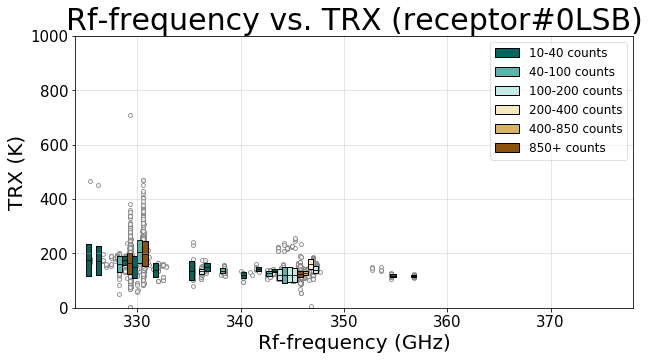

Figure F-0: Rf-frequency vs TRX (receptor#0LSB)


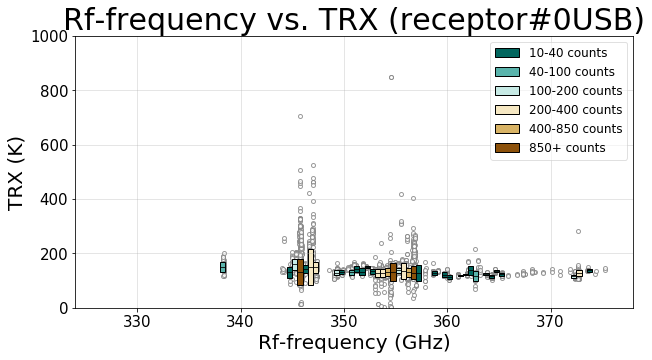

Figure F-1: Rf-frequency vs TRX (receptor#0USB)


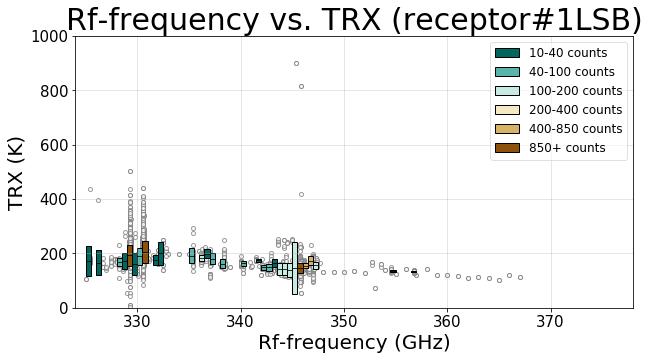

Figure F-2: Rf-frequency vs TRX (receptor#1LSB)


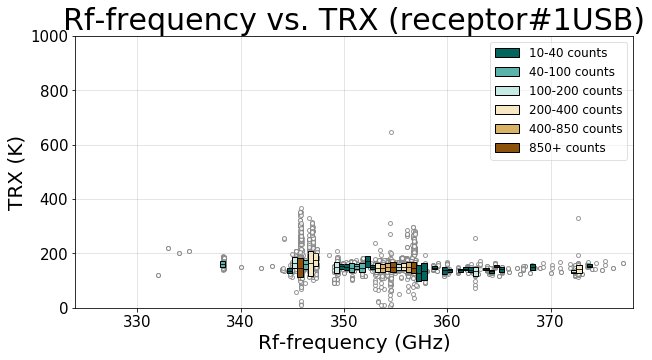

Figure F-3: Rf-frequency vs TRX (receptor#1USB)


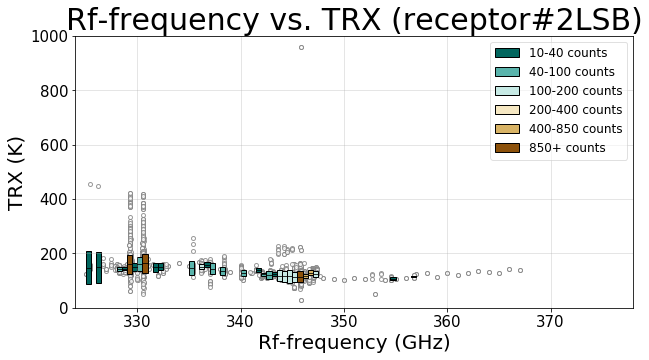

Figure F-4: Rf-frequency vs TRX (receptor#2LSB)


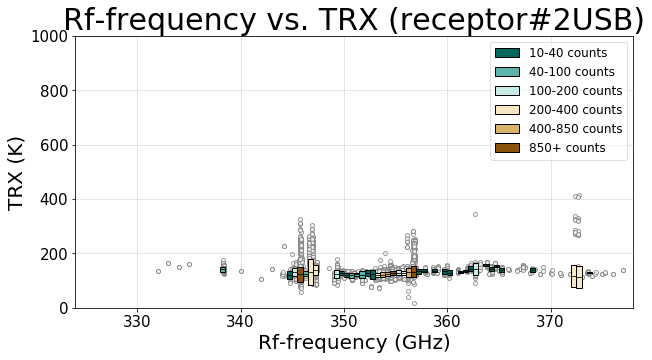

Figure F-5: Rf-frequency vs TRX (receptor#2USB)


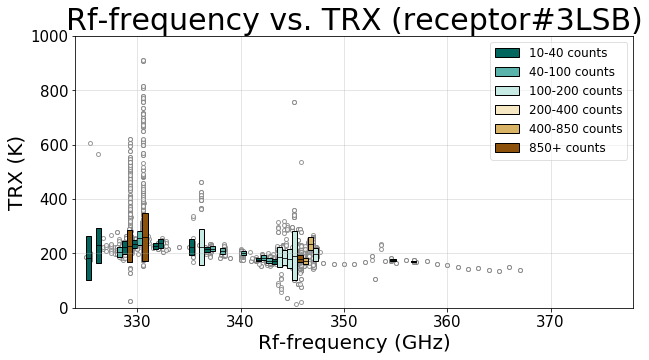

Figure F-6: Rf-frequency vs TRX (receptor#3LSB)


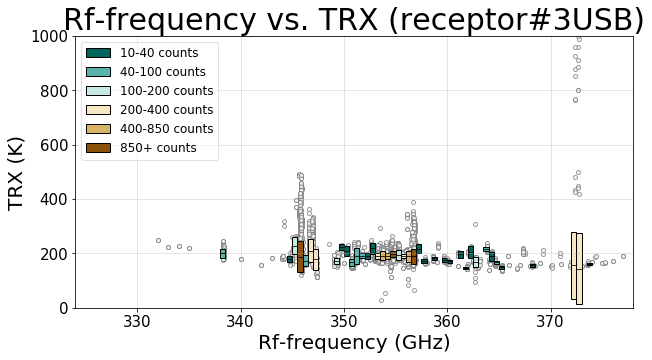

Figure F-7: Rf-frequency vs TRX (receptor#3USB)


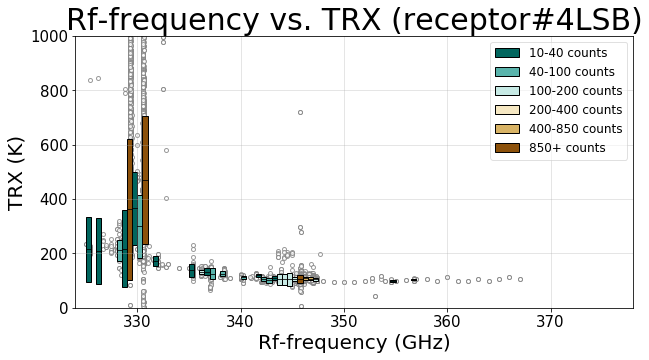

Figure F-8: Rf-frequency vs TRX (receptor#4LSB)


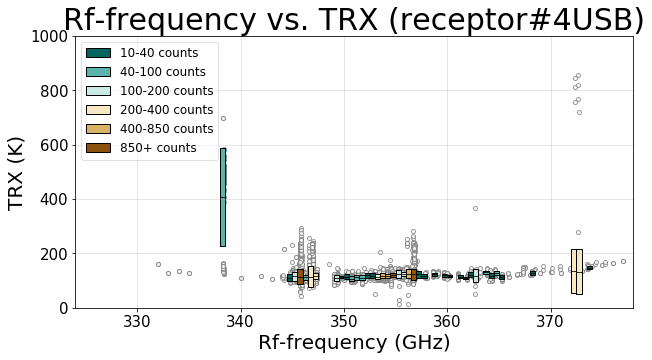

Figure F-9: Rf-frequency vs TRX (receptor#4USB)


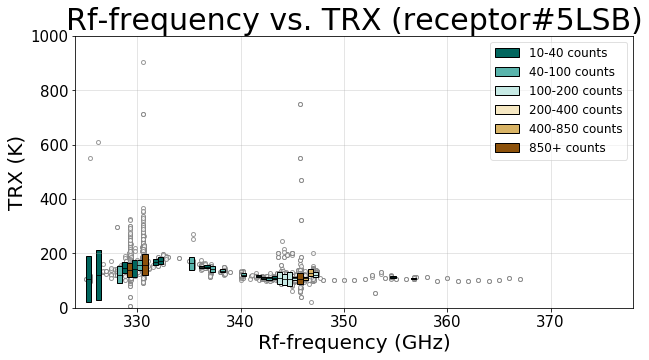

Figure F-10: Rf-frequency vs TRX (receptor#5LSB)


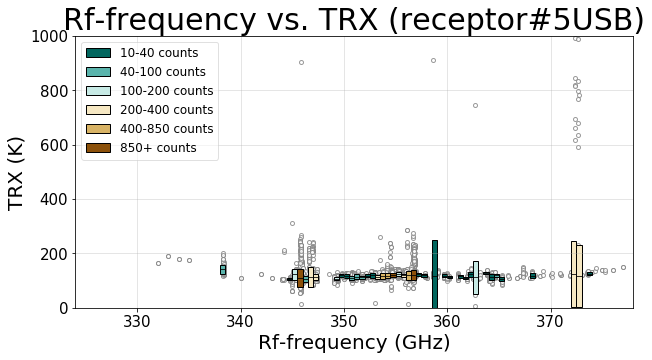

Figure F-11: Rf-frequency vs TRX (receptor#5USB)


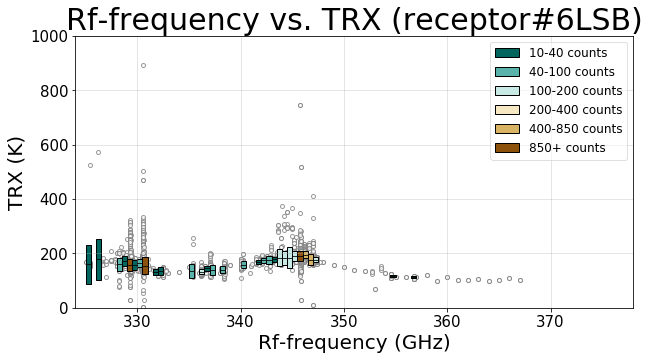

Figure F-12: Rf-frequency vs TRX (receptor#6LSB)


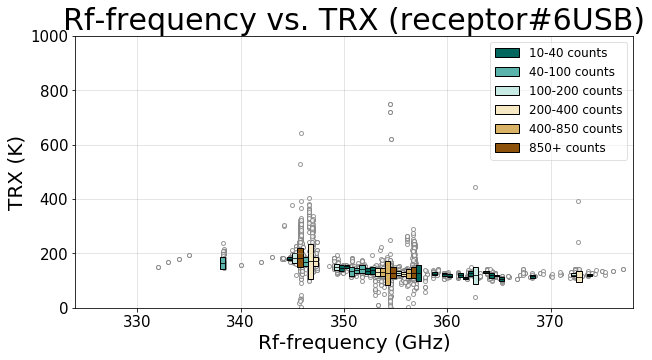

Figure F-13: Rf-frequency vs TRX (receptor#6USB)


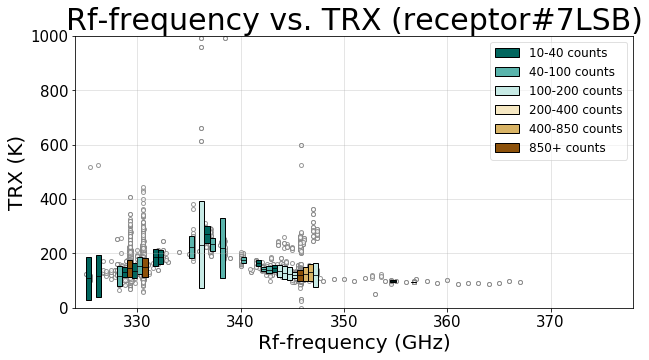

Figure F-14: Rf-frequency vs TRX (receptor#7LSB)


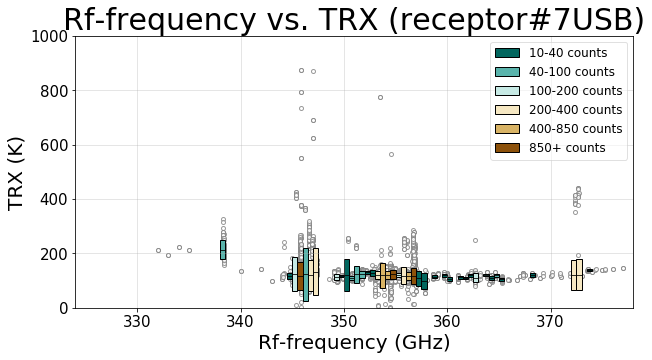

Figure F-15: Rf-frequency vs TRX (receptor#7USB)


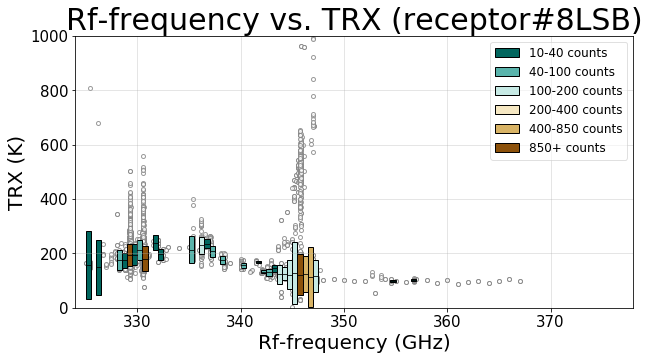

Figure F-16: Rf-frequency vs TRX (receptor#8LSB)


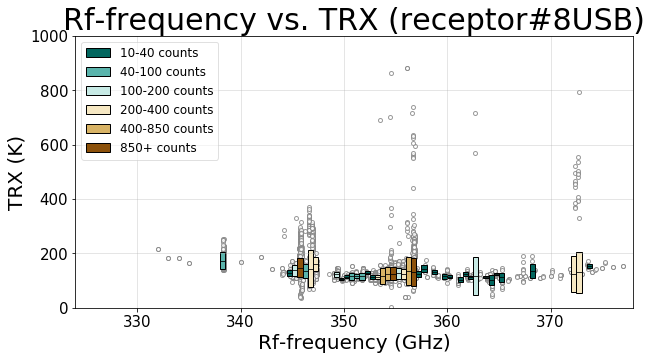

Figure F-17: Rf-frequency vs TRX (receptor#8USB)


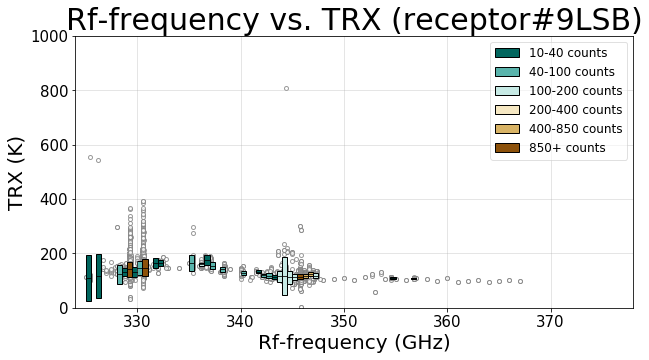

Figure F-18: Rf-frequency vs TRX (receptor#9LSB)


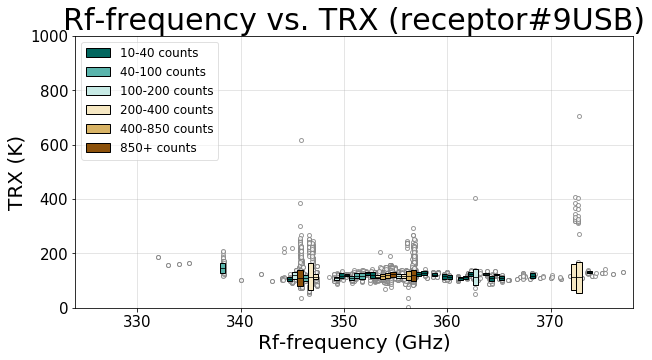

Figure F-19: Rf-frequency vs TRX (receptor#9USB)


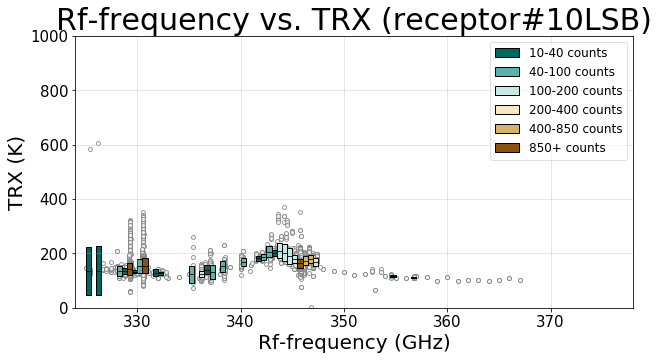

Figure F-20: Rf-frequency vs TRX (receptor#10LSB)


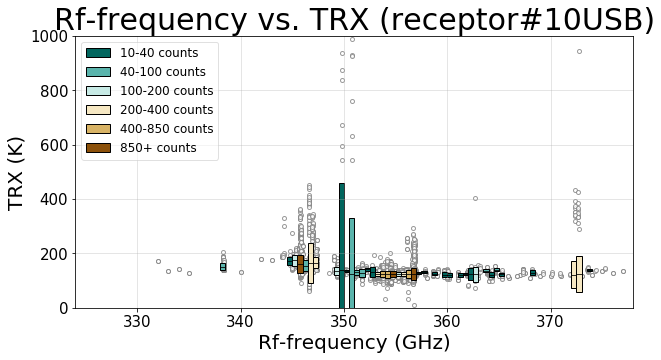

Figure F-21: Rf-frequency vs TRX (receptor#10USB)


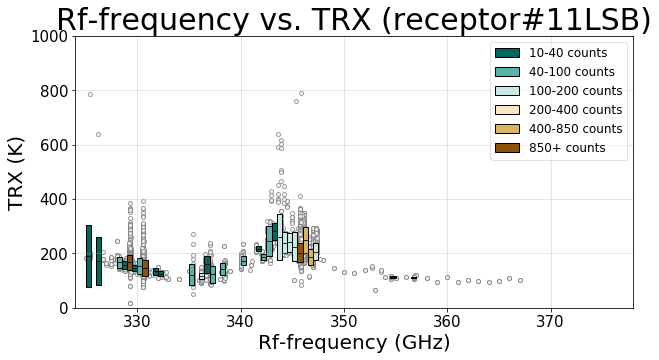

Figure F-22: Rf-frequency vs TRX (receptor#11LSB)


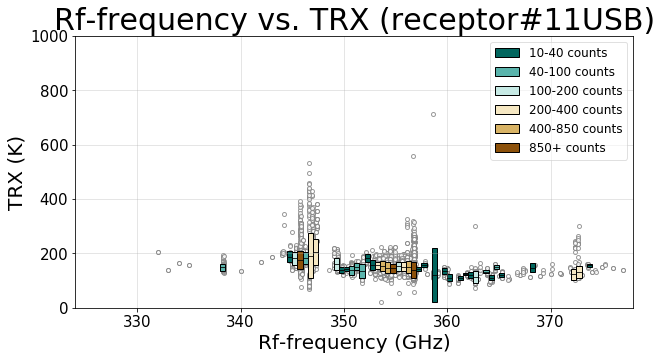

Figure F-23: Rf-frequency vs TRX (receptor#11USB)


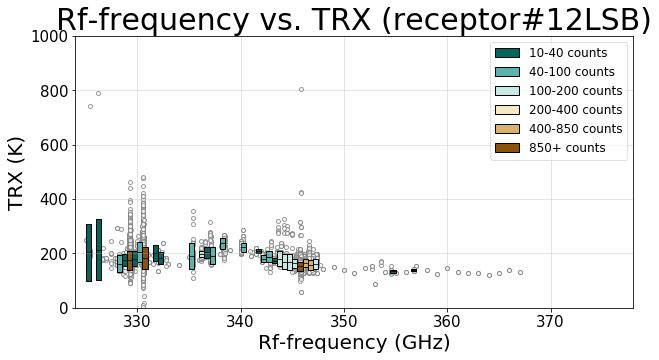

Figure F-24: Rf-frequency vs TRX (receptor#12LSB)


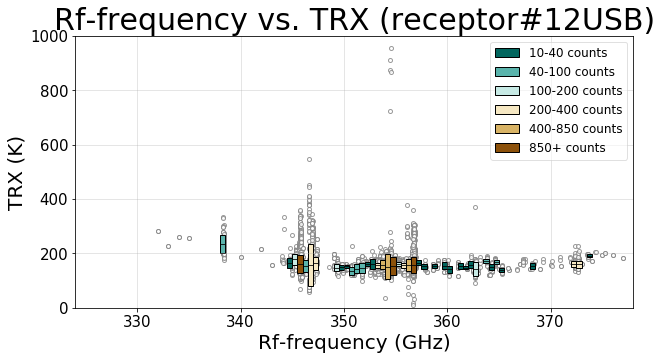

Figure F-25: Rf-frequency vs TRX (receptor#12USB)


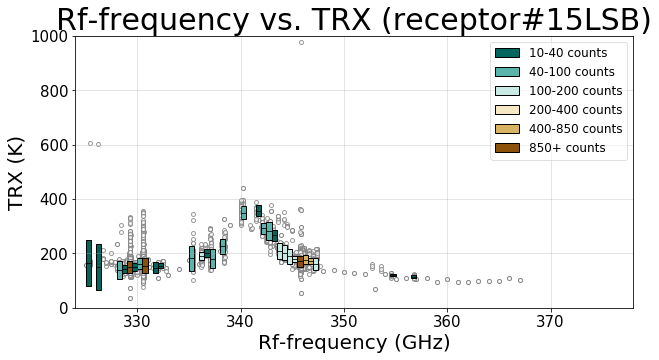

Figure F-26: Rf-frequency vs TRX (receptor#15LSB)


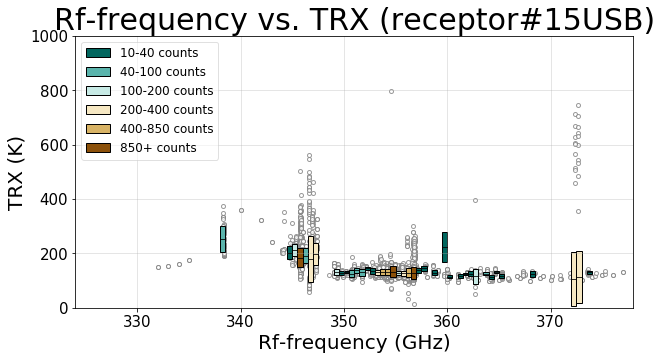

Figure F-27: Rf-frequency vs TRX (receptor#15USB)


In [206]:
num=0
all_s = ['LSB','USB']
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
    for s in all_s:    
        txtfile = pd.read_csv(file, header = 0, sep=' ')
        low_memory=False
        txtfile2= txtfile[(txtfile['receptor']==i)&(txtfile['sideband']==s)]
        if freq_type=='lofreq':
            start=326
            stop=373
            interval=95
        elif freq_type=='rffreq':
            start=324
            stop=378
            interval=109
        lins = np.linspace(start, stop, interval)
        fig, ax = plt.subplots(figsize=(10,5))
        ax.scatter(txtfile2[freq_type], txtfile2["trx"], facecolor = 'white', edgecolor = "grey"
                   , alpha= 0.8, s = 16)
        patch1 = mpatches.Patch(facecolor='#01665e', edgecolor='black', label='10-40 counts')
        patch2 = mpatches.Patch(facecolor='#5ab4ac', edgecolor='black', label='40-100 counts')
        patch3 = mpatches.Patch(facecolor='#c7eae5', edgecolor='black', label='100-200 counts')
        patch4 = mpatches.Patch(facecolor='#f6e8c3', edgecolor='black', label='200-400 counts')
        patch5 = mpatches.Patch(facecolor='#d8b365', edgecolor='black', label='400-850 counts')
        patch6 = mpatches.Patch(facecolor='#8c510a', edgecolor='black', label='850+ counts')
        plt.legend(handles=[patch1, patch2, patch3, patch4, patch5, patch6], loc = 'best'
                   , prop={'size': 12}, fancybox=True, framealpha=0.6)        
        ax.set_xlabel(freq_name+' (GHz)', fontsize = 20)
        ax.set_ylabel('TRX (K)', fontsize = 20)
        ax.set_title(freq_name+' vs. TRX (receptor#' + str(i) + s + ')', fontsize = 30)
        plt.setp(ax.get_xticklabels(), fontsize=15)
        plt.setp(ax.get_yticklabels(), fontsize=15)
        ax.set_ylim(0, 1000)
        ax.set_xlim(start, stop)
        ax.grid(alpha=.4)        
        for x in lins:
            x_max= x+0.5
            trx = txtfile2['trx'][(x<=txtfile2[freq_type])&(txtfile2[freq_type]<x_max)]
            a=trx.count()
            if a > 2:
                stdev= st.stdev(trx)
                median=round(st.median(trx), 1)
                range_max= round(median+stdev,1)
                range_min= round(median-stdev,1)
                two_sigma= round(median+(stdev*2),1)
                two_sigma_minus= round(median-(stdev*2),1)
                h = range_max - range_min
                w = x_max - x            
            if (a > 10)&(a<=40):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#01665e', edgecolor='black')
                ax.add_patch(rect)           
            if (a > 40)&(a<=100):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#5ab4ac', edgecolor='black')
                ax.add_patch(rect)            
            if (a > 100)&(a<=200):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#c7eae5', edgecolor='black')
                ax.add_patch(rect)           
            if (a > 200)&(a<=400):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#f6e8c3', edgecolor='black')
                ax.add_patch(rect)            
            if (a > 400)&(a<=850):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#d8b365', edgecolor='black')
                ax.add_patch(rect)                
            if (a > 850):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#8c510a', edgecolor='black')
                ax.add_patch(rect)
        plt.show()
        print('Figure F-'+str(num)+': '+freq_name+' vs TRX (receptor#'+str(i)+s+')')
        num=num+1

## Each receptor's relation of time and TRX in specific frequency range

The plots below shows the relation of time and TRX and the observed counts in specific frequency range. The specific frequency ranges are the same as the range of brown box plots in Figure F. In other words, the plots below focus on frequency ranges including numerous observations. 

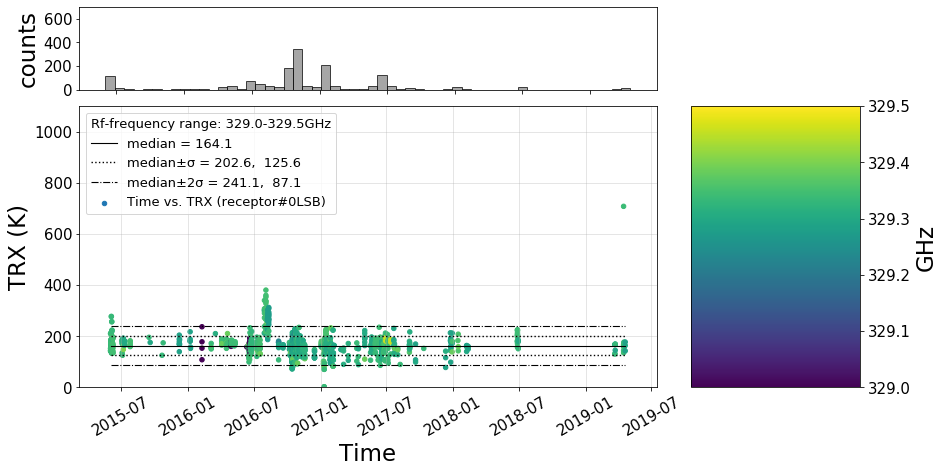

Figure G-0: Time vs. TRX, (receptor#0LSB), 329.0-329.5GHz


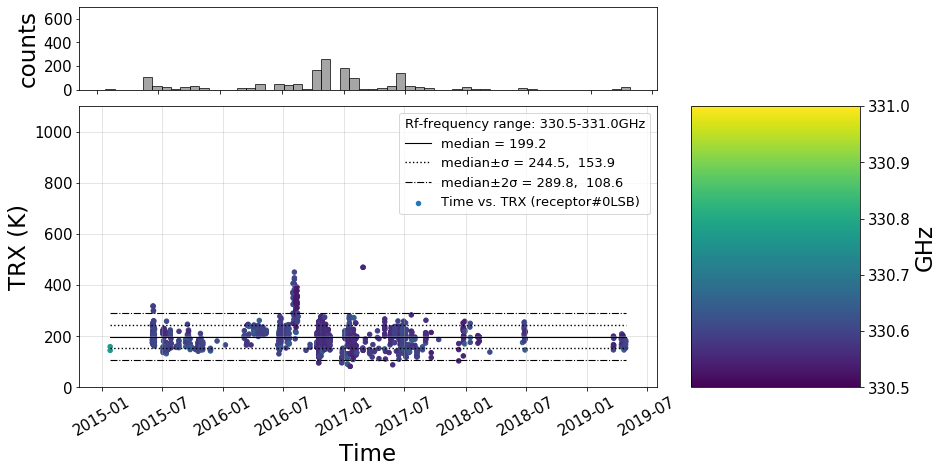

Figure G-1: Time vs. TRX, (receptor#0LSB), 330.5-331.0GHz


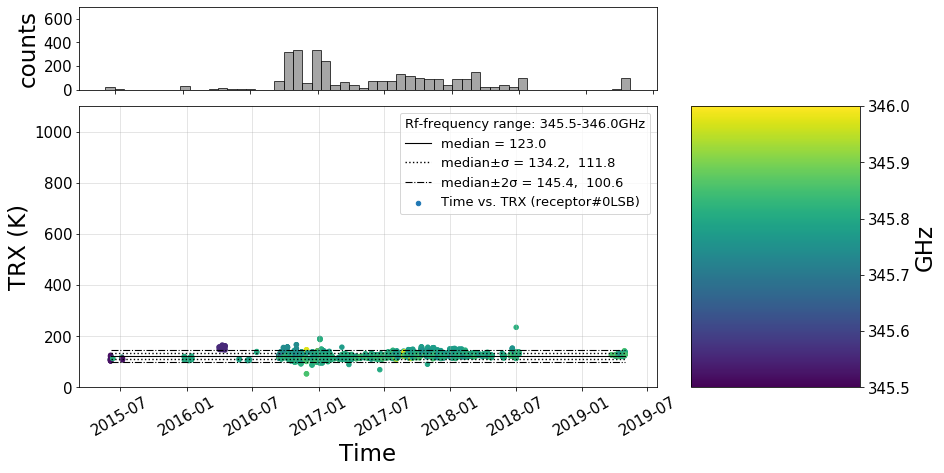

Figure G-2: Time vs. TRX, (receptor#0LSB), 345.5-346.0GHz


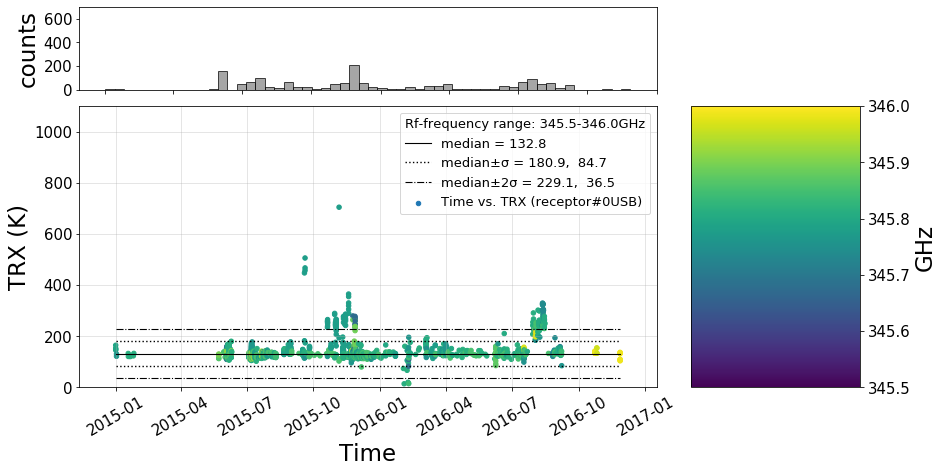

Figure G-3: Time vs. TRX, (receptor#0USB), 345.5-346.0GHz


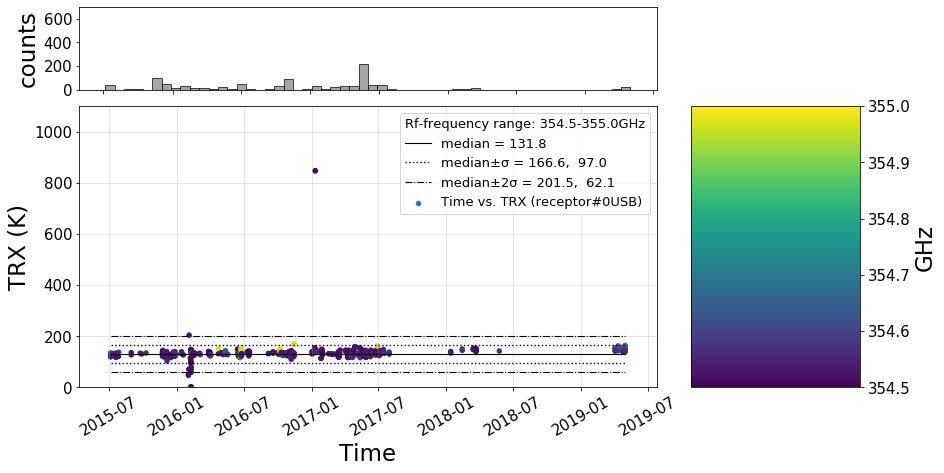

Figure G-4: Time vs. TRX, (receptor#0USB), 354.5-355.0GHz


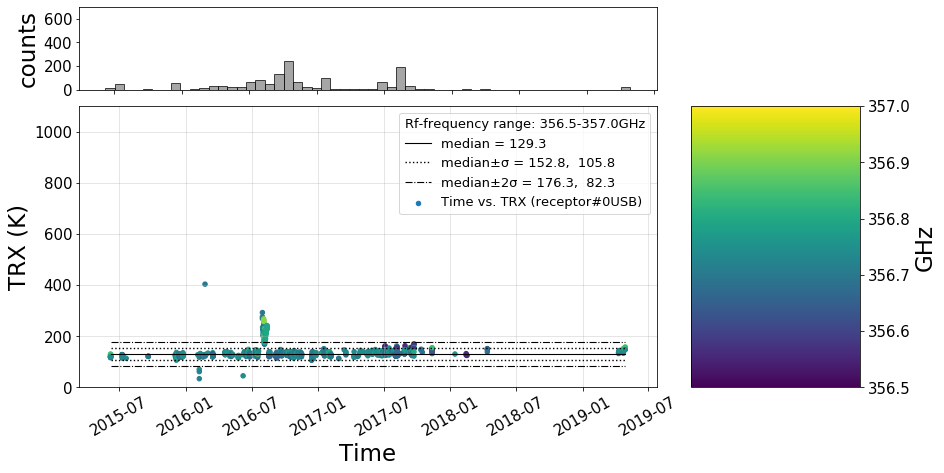

Figure G-5: Time vs. TRX, (receptor#0USB), 356.5-357.0GHz


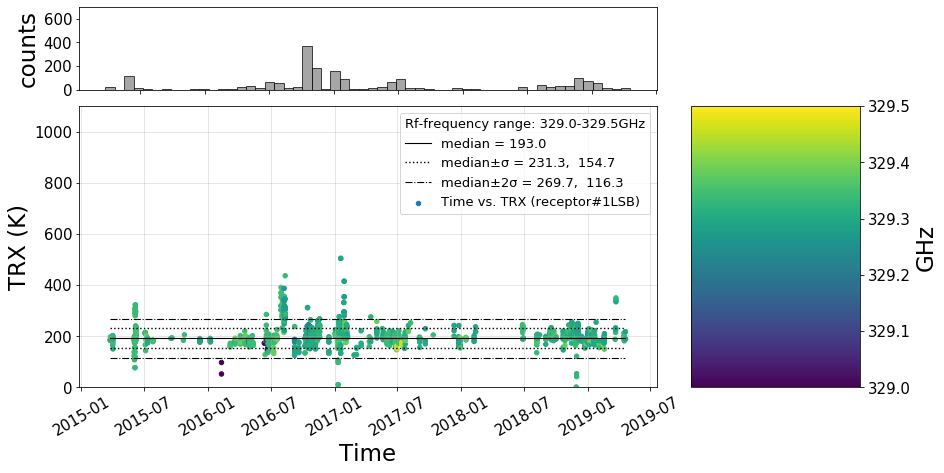

Figure G-6: Time vs. TRX, (receptor#1LSB), 329.0-329.5GHz


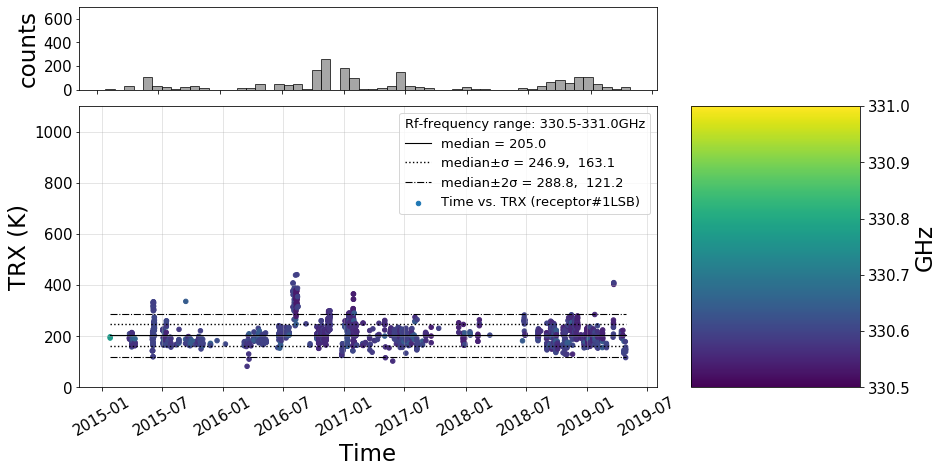

Figure G-7: Time vs. TRX, (receptor#1LSB), 330.5-331.0GHz


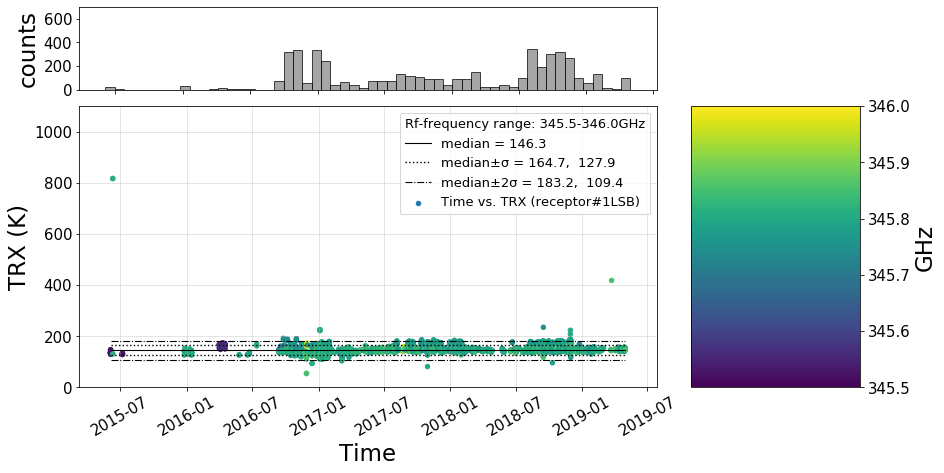

Figure G-8: Time vs. TRX, (receptor#1LSB), 345.5-346.0GHz


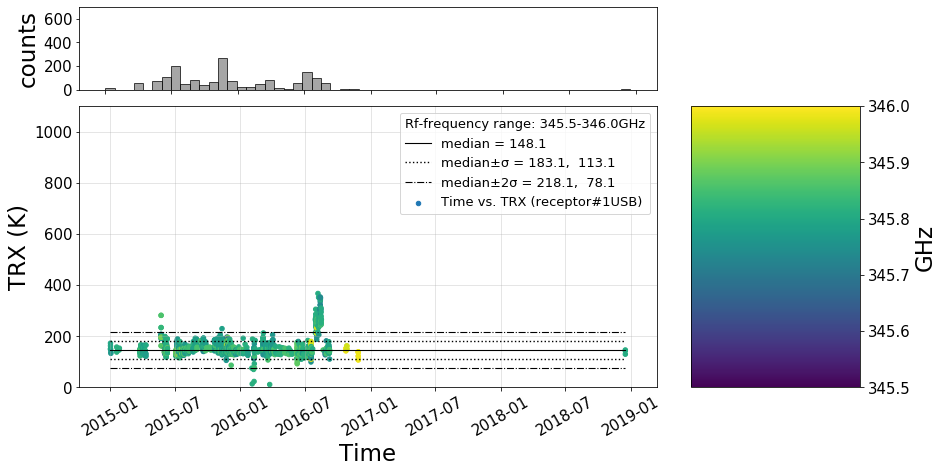

Figure G-9: Time vs. TRX, (receptor#1USB), 345.5-346.0GHz


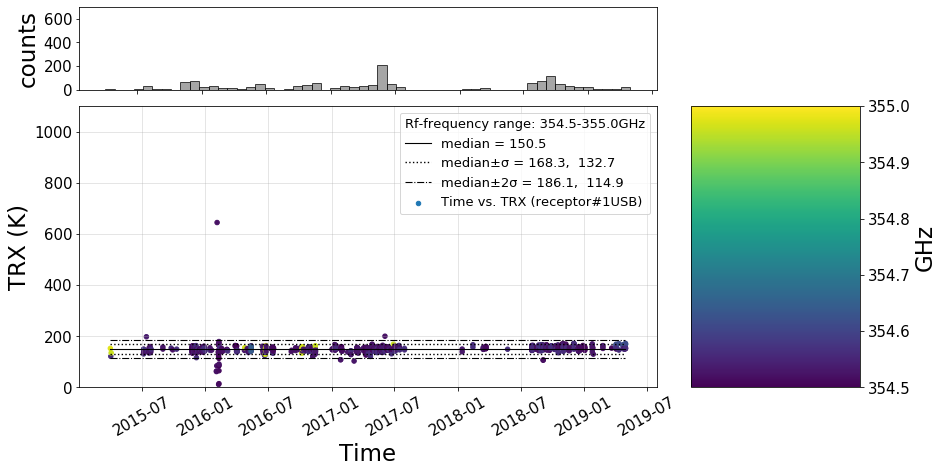

Figure G-10: Time vs. TRX, (receptor#1USB), 354.5-355.0GHz


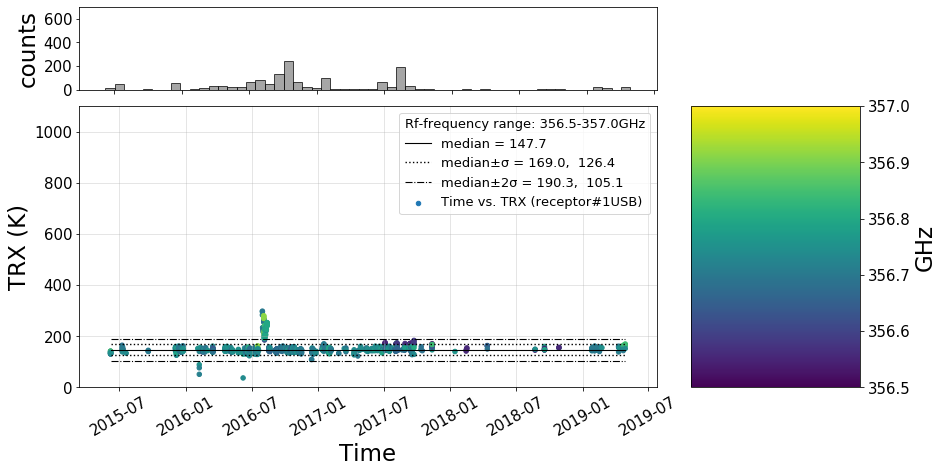

Figure G-11: Time vs. TRX, (receptor#1USB), 356.5-357.0GHz


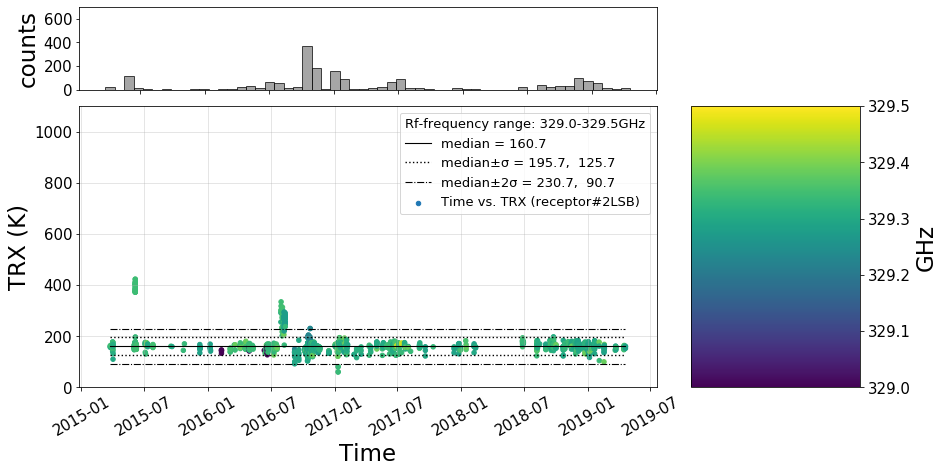

Figure G-12: Time vs. TRX, (receptor#2LSB), 329.0-329.5GHz


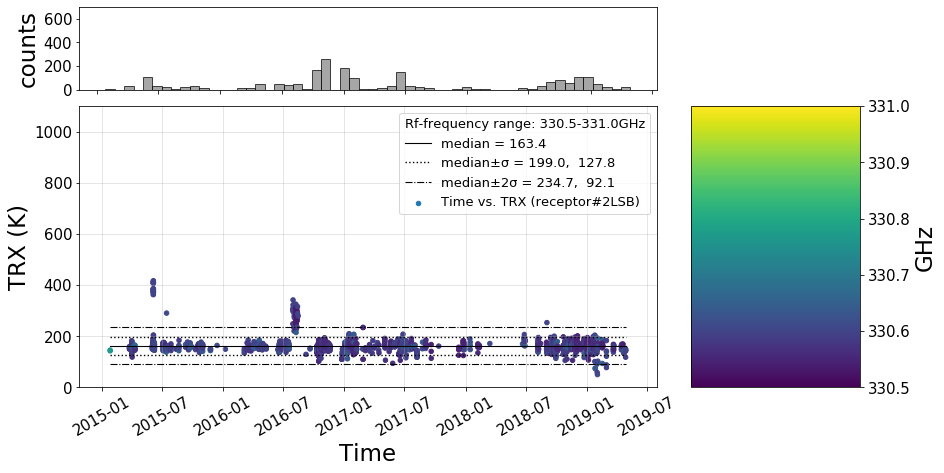

Figure G-13: Time vs. TRX, (receptor#2LSB), 330.5-331.0GHz


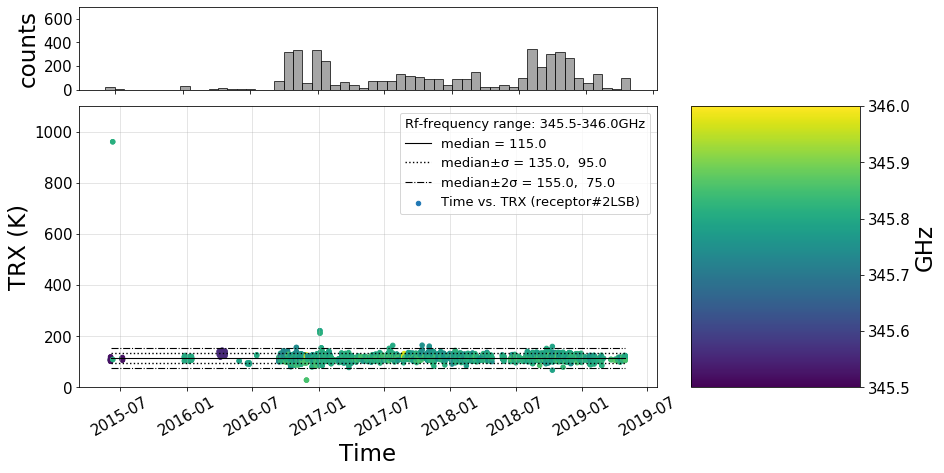

Figure G-14: Time vs. TRX, (receptor#2LSB), 345.5-346.0GHz


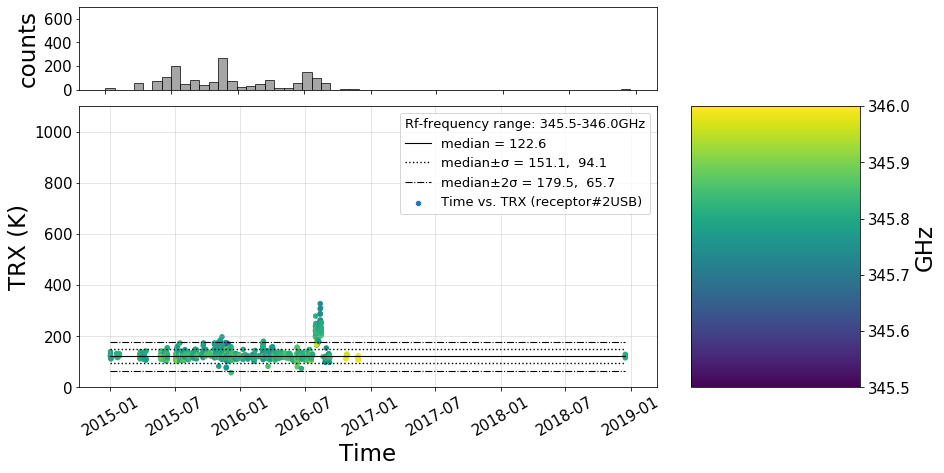

Figure G-15: Time vs. TRX, (receptor#2USB), 345.5-346.0GHz


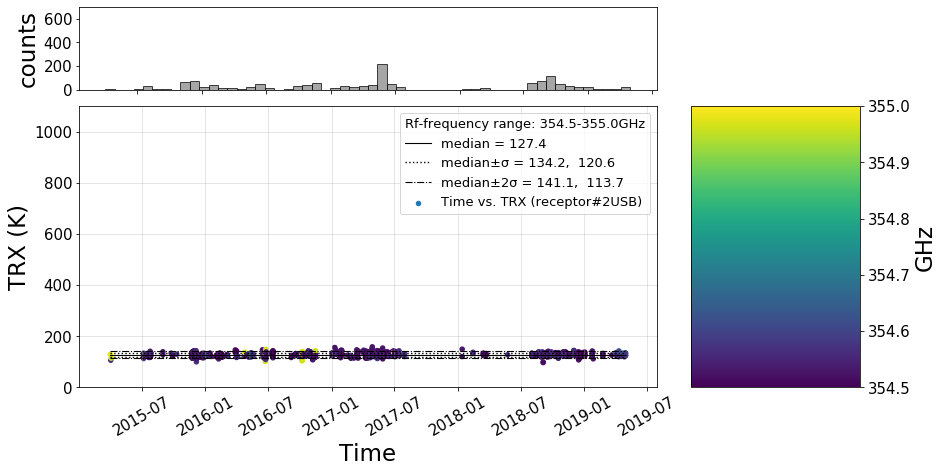

Figure G-16: Time vs. TRX, (receptor#2USB), 354.5-355.0GHz


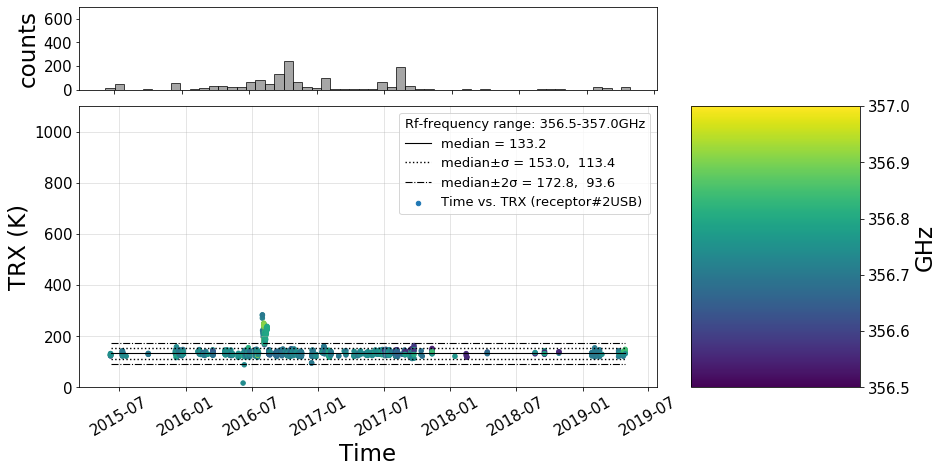

Figure G-17: Time vs. TRX, (receptor#2USB), 356.5-357.0GHz


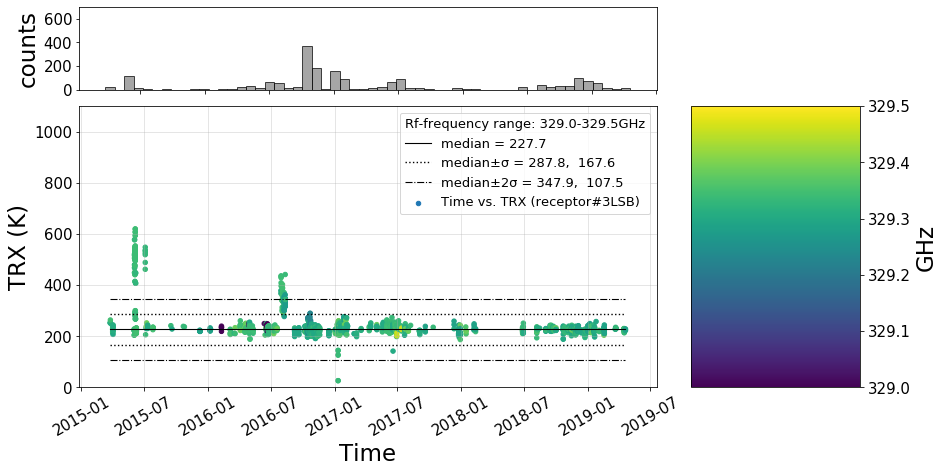

Figure G-18: Time vs. TRX, (receptor#3LSB), 329.0-329.5GHz


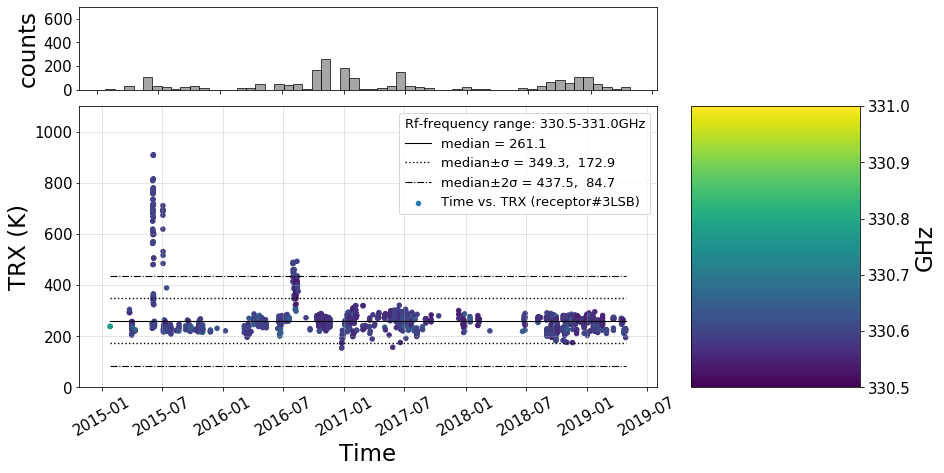

Figure G-19: Time vs. TRX, (receptor#3LSB), 330.5-331.0GHz


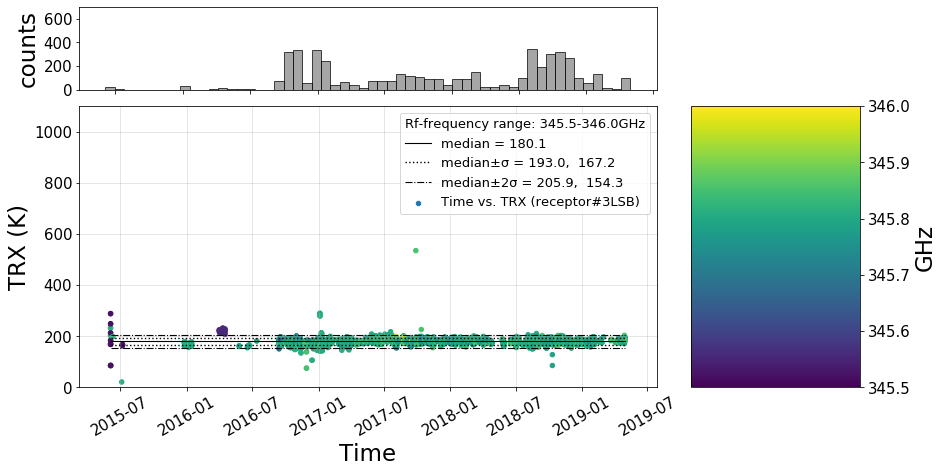

Figure G-20: Time vs. TRX, (receptor#3LSB), 345.5-346.0GHz


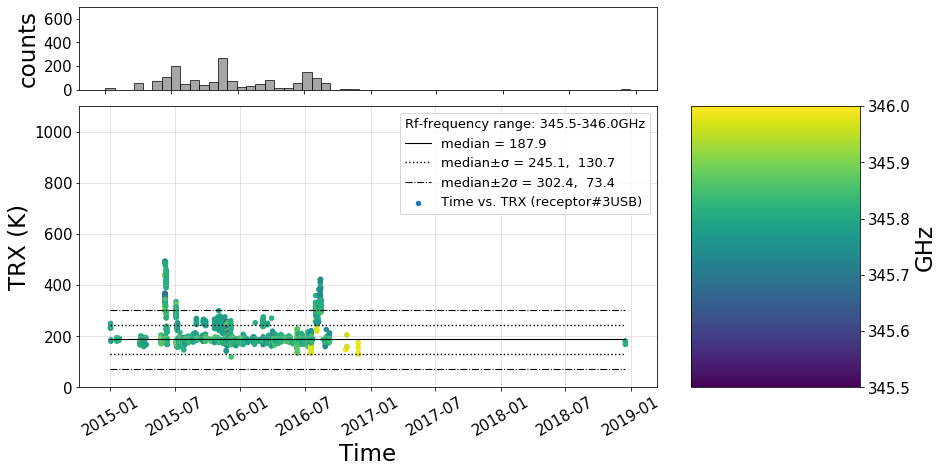

Figure G-21: Time vs. TRX, (receptor#3USB), 345.5-346.0GHz


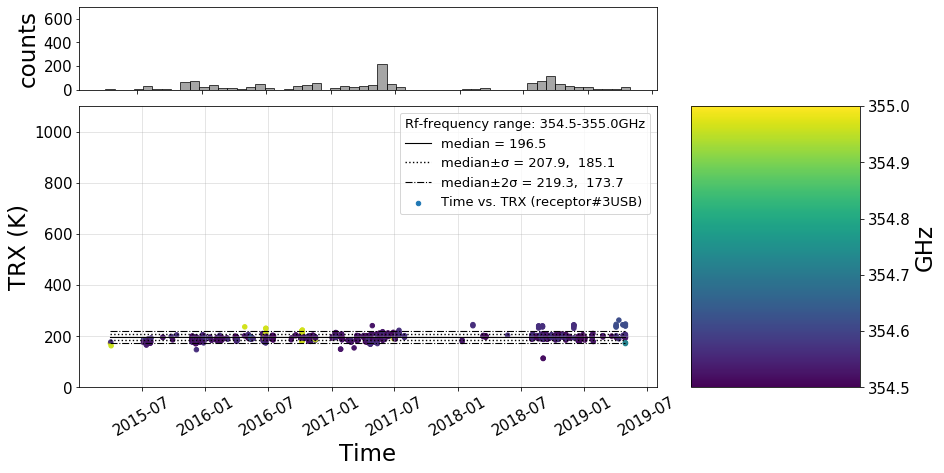

Figure G-22: Time vs. TRX, (receptor#3USB), 354.5-355.0GHz


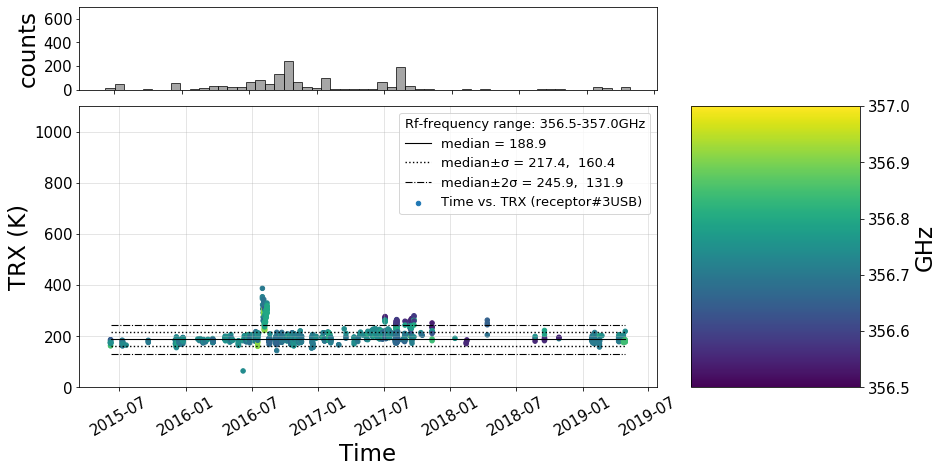

Figure G-23: Time vs. TRX, (receptor#3USB), 356.5-357.0GHz


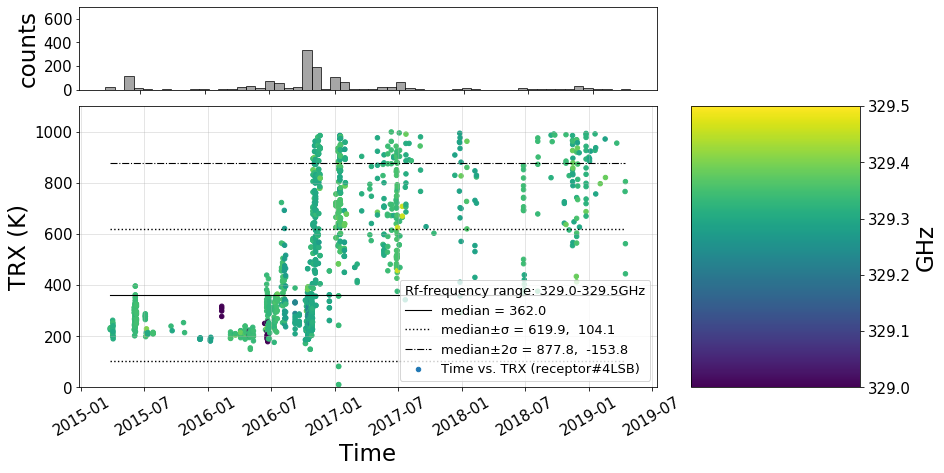

Figure G-24: Time vs. TRX, (receptor#4LSB), 329.0-329.5GHz


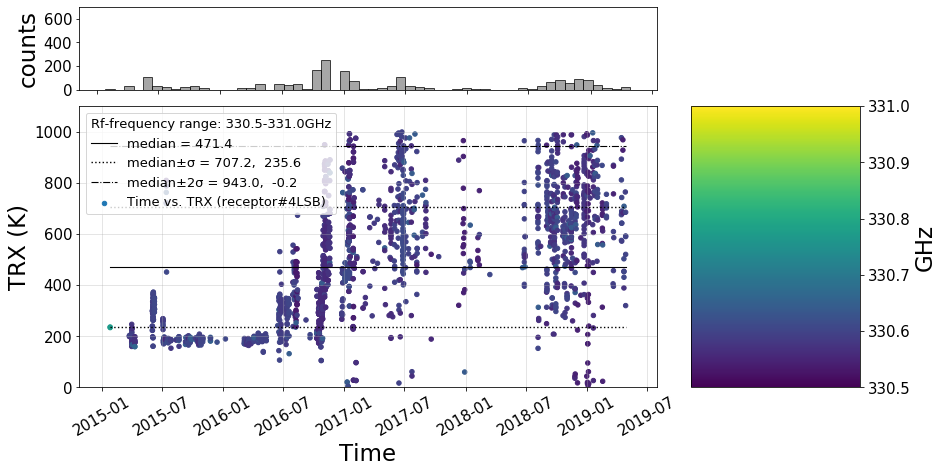

Figure G-25: Time vs. TRX, (receptor#4LSB), 330.5-331.0GHz


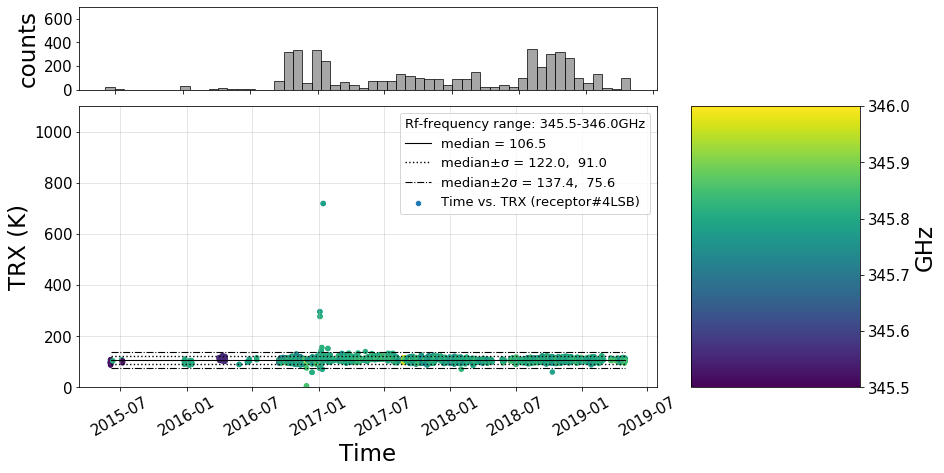

Figure G-26: Time vs. TRX, (receptor#4LSB), 345.5-346.0GHz


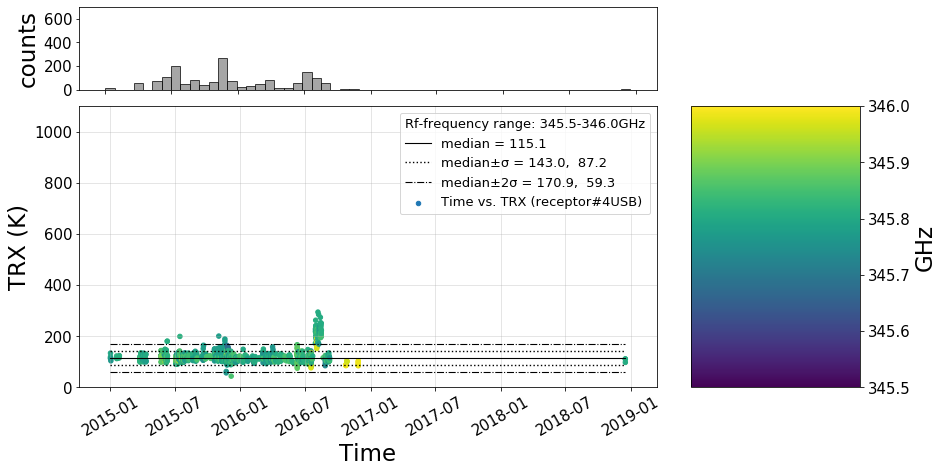

Figure G-27: Time vs. TRX, (receptor#4USB), 345.5-346.0GHz


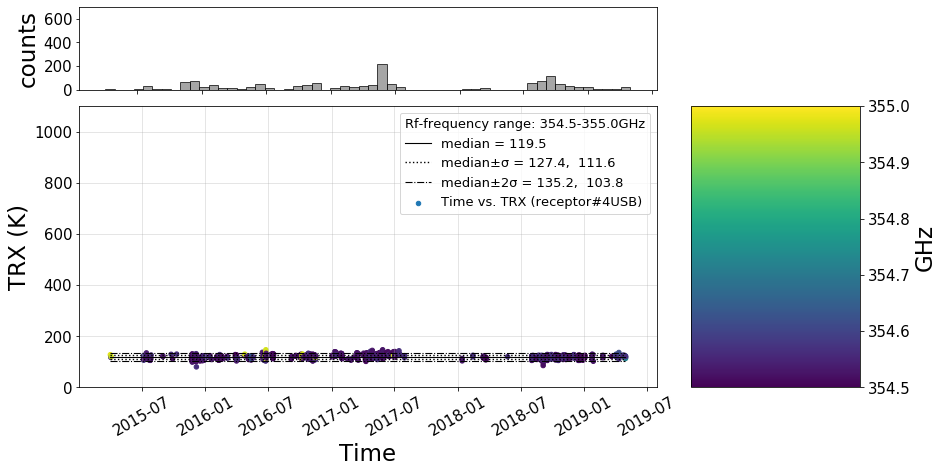

Figure G-28: Time vs. TRX, (receptor#4USB), 354.5-355.0GHz


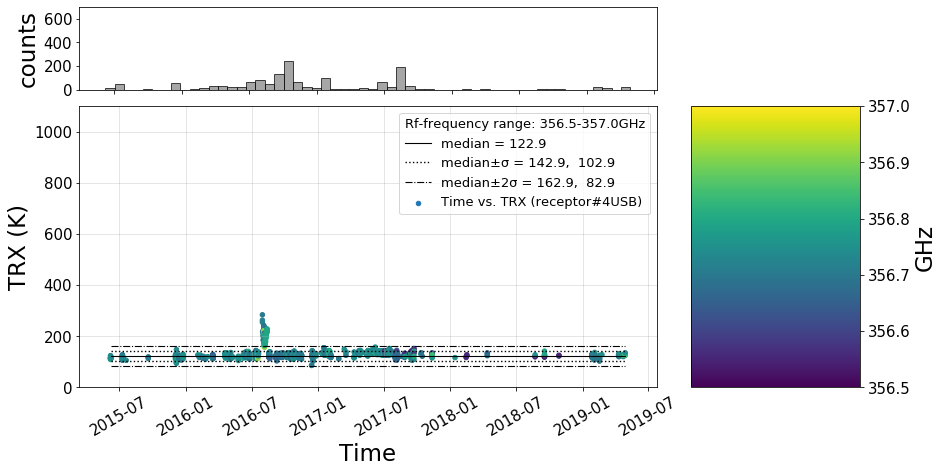

Figure G-29: Time vs. TRX, (receptor#4USB), 356.5-357.0GHz


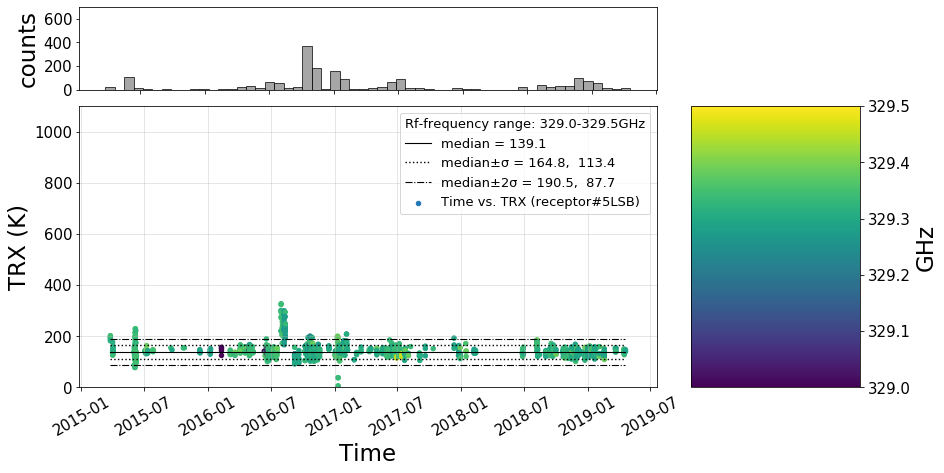

Figure G-30: Time vs. TRX, (receptor#5LSB), 329.0-329.5GHz


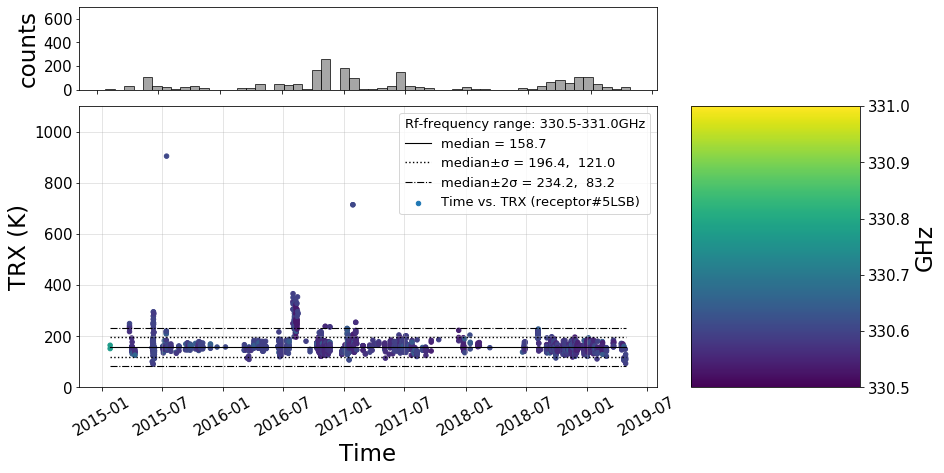

Figure G-31: Time vs. TRX, (receptor#5LSB), 330.5-331.0GHz


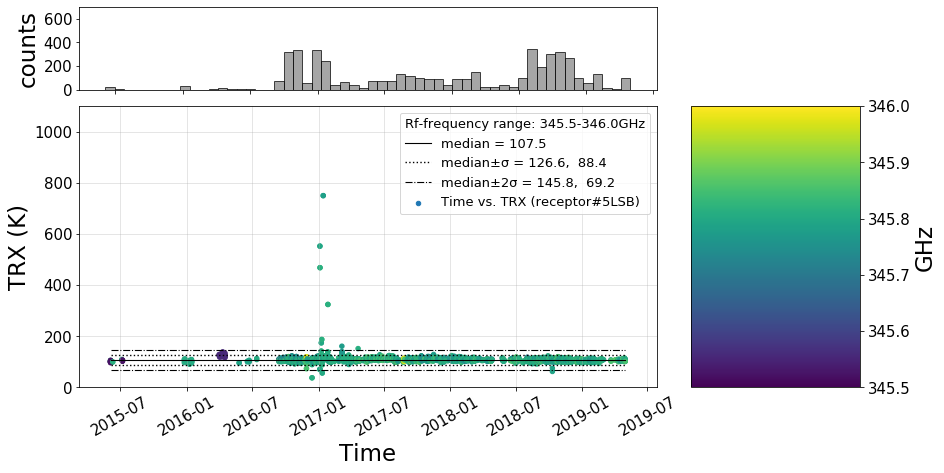

Figure G-32: Time vs. TRX, (receptor#5LSB), 345.5-346.0GHz


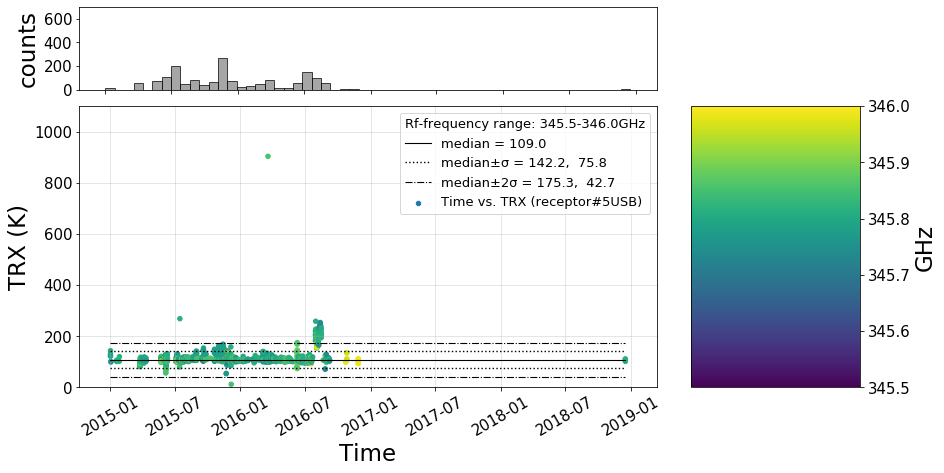

Figure G-33: Time vs. TRX, (receptor#5USB), 345.5-346.0GHz


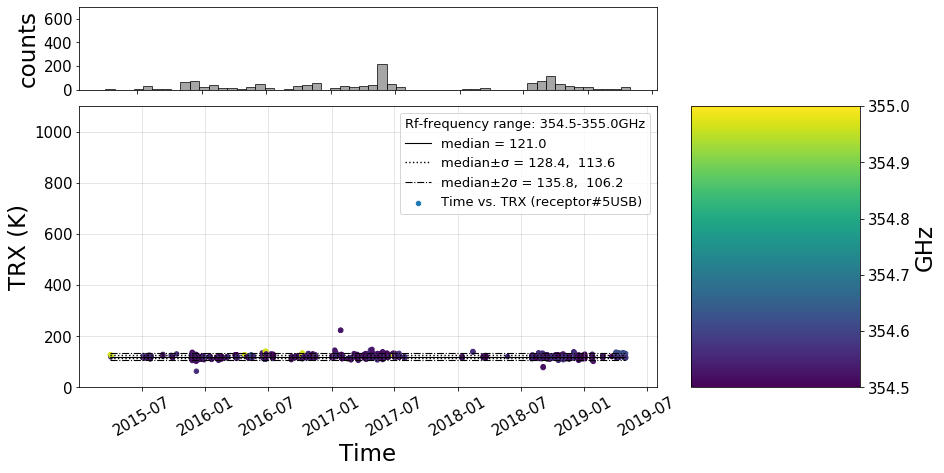

Figure G-34: Time vs. TRX, (receptor#5USB), 354.5-355.0GHz


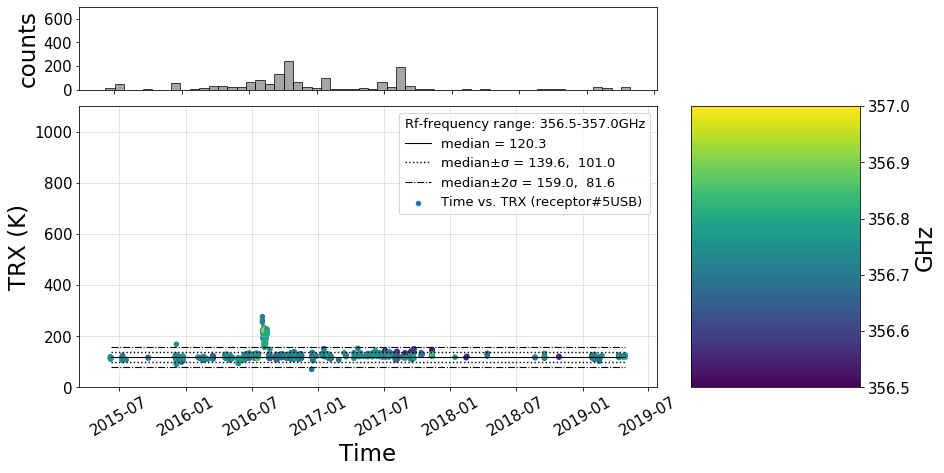

Figure G-35: Time vs. TRX, (receptor#5USB), 356.5-357.0GHz


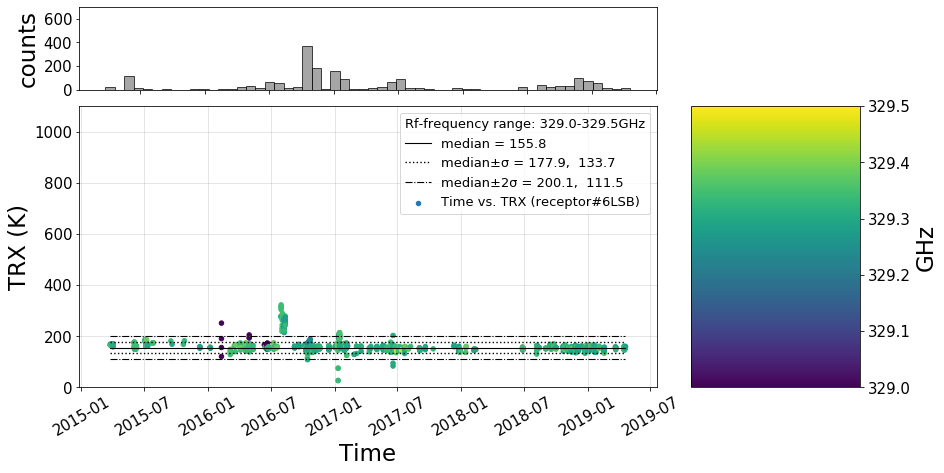

Figure G-36: Time vs. TRX, (receptor#6LSB), 329.0-329.5GHz


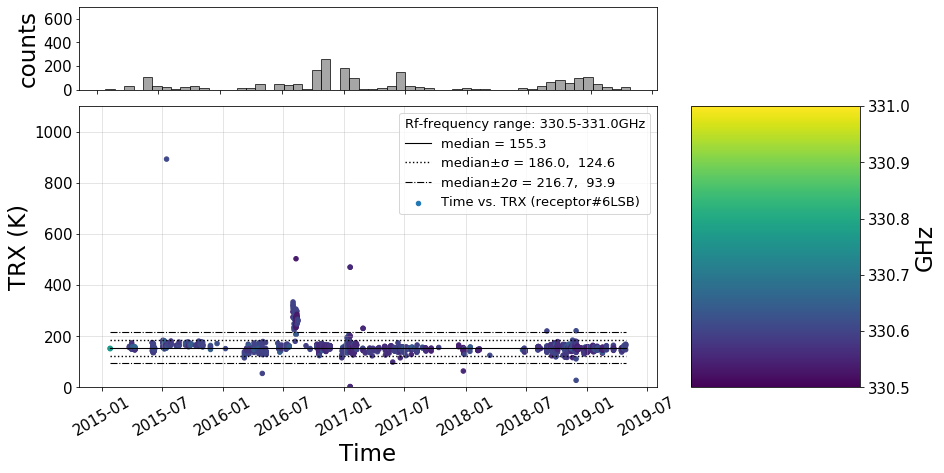

Figure G-37: Time vs. TRX, (receptor#6LSB), 330.5-331.0GHz


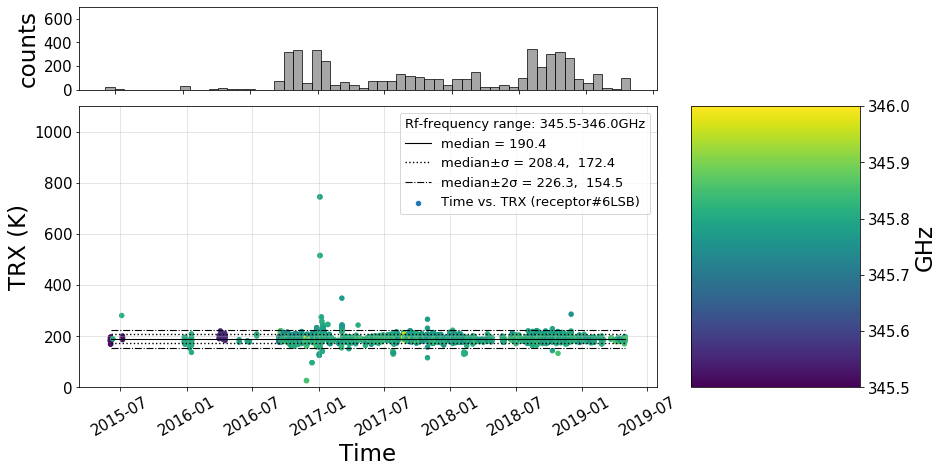

Figure G-38: Time vs. TRX, (receptor#6LSB), 345.5-346.0GHz


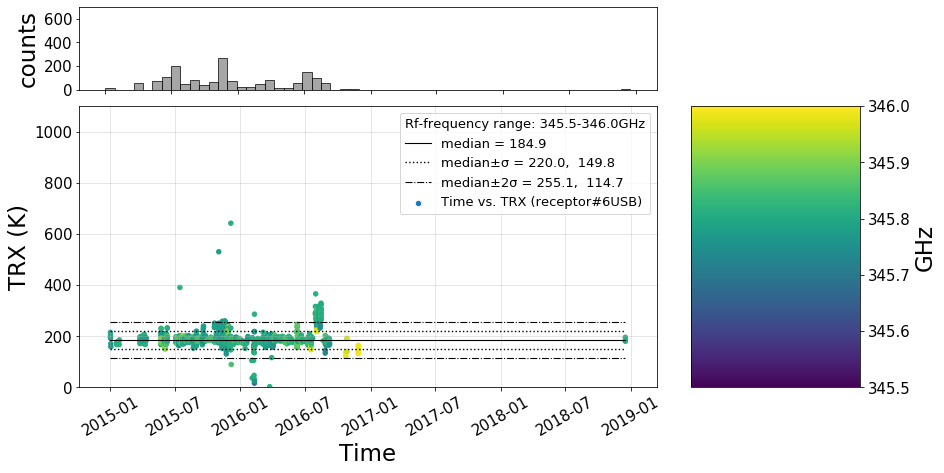

Figure G-39: Time vs. TRX, (receptor#6USB), 345.5-346.0GHz


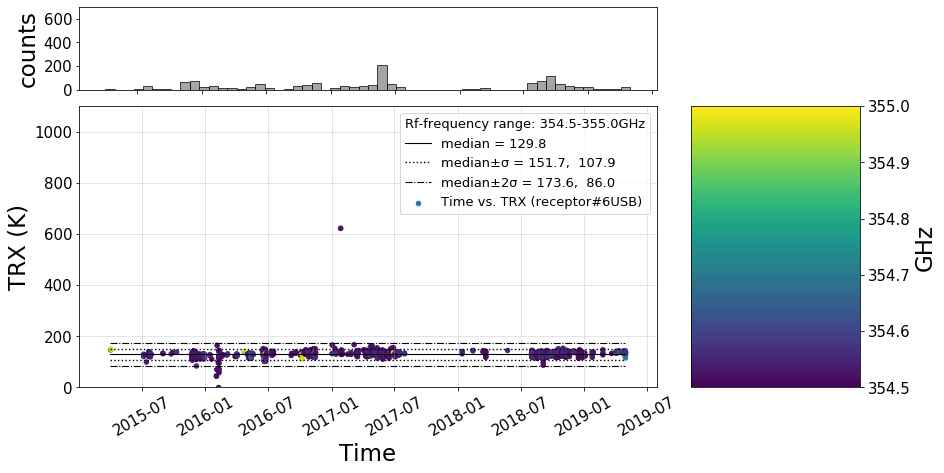

Figure G-40: Time vs. TRX, (receptor#6USB), 354.5-355.0GHz


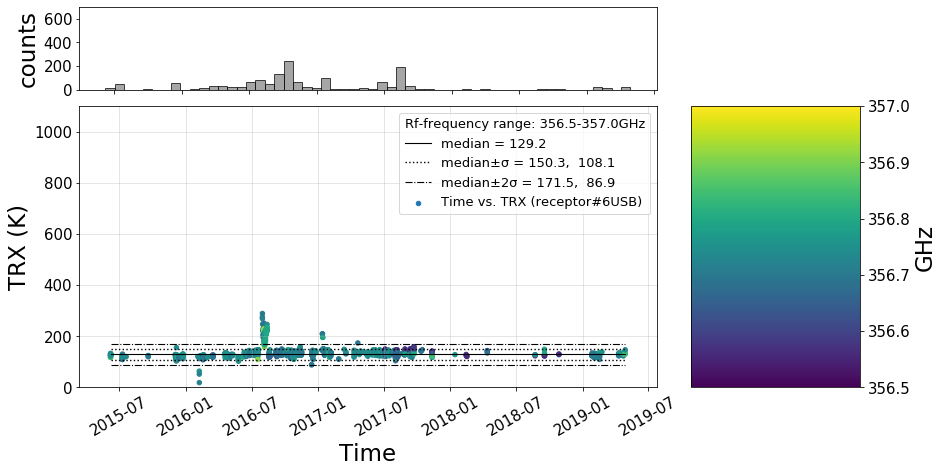

Figure G-41: Time vs. TRX, (receptor#6USB), 356.5-357.0GHz


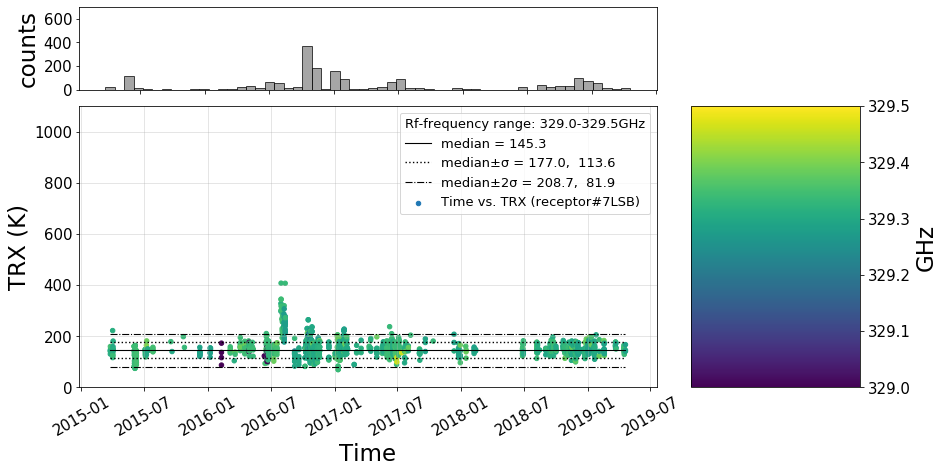

Figure G-42: Time vs. TRX, (receptor#7LSB), 329.0-329.5GHz


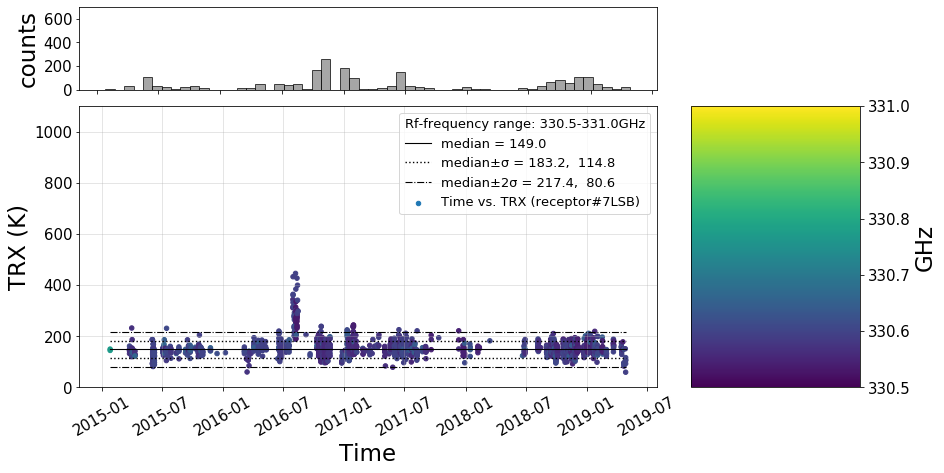

Figure G-43: Time vs. TRX, (receptor#7LSB), 330.5-331.0GHz


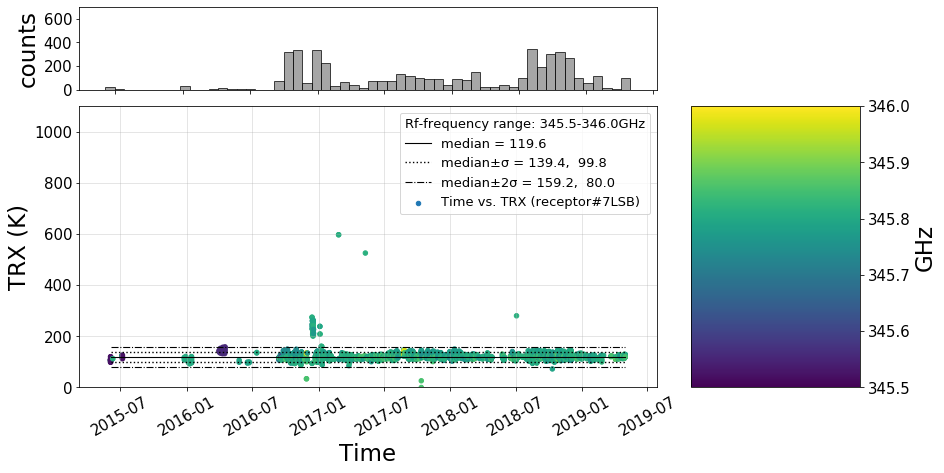

Figure G-44: Time vs. TRX, (receptor#7LSB), 345.5-346.0GHz


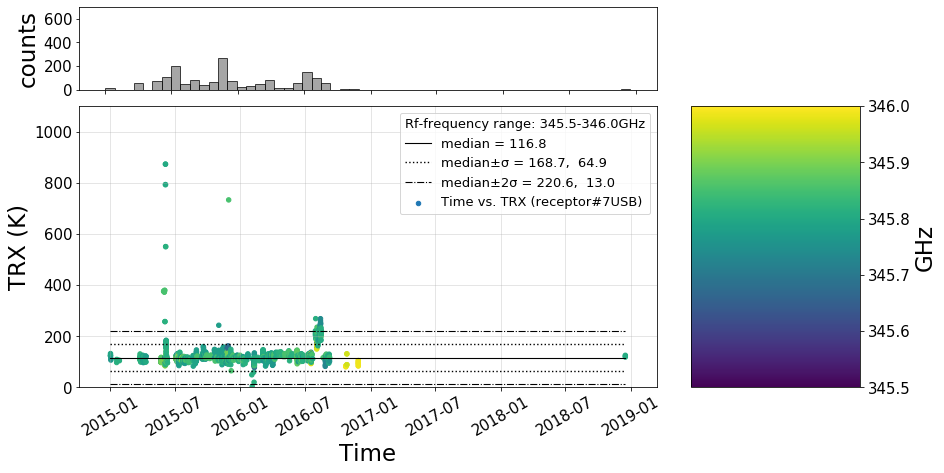

Figure G-45: Time vs. TRX, (receptor#7USB), 345.5-346.0GHz


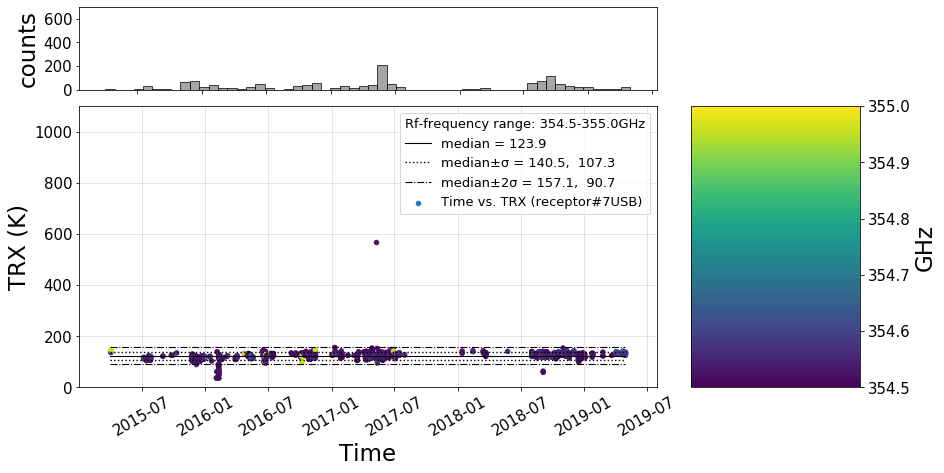

Figure G-46: Time vs. TRX, (receptor#7USB), 354.5-355.0GHz


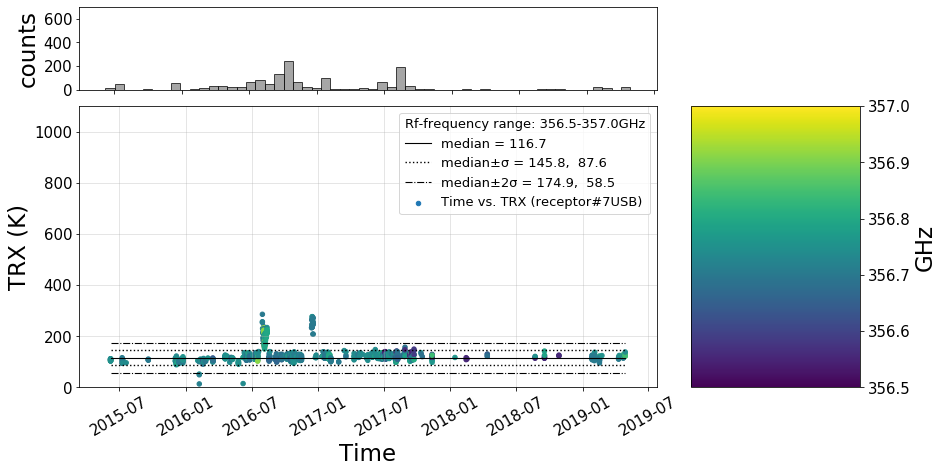

Figure G-47: Time vs. TRX, (receptor#7USB), 356.5-357.0GHz


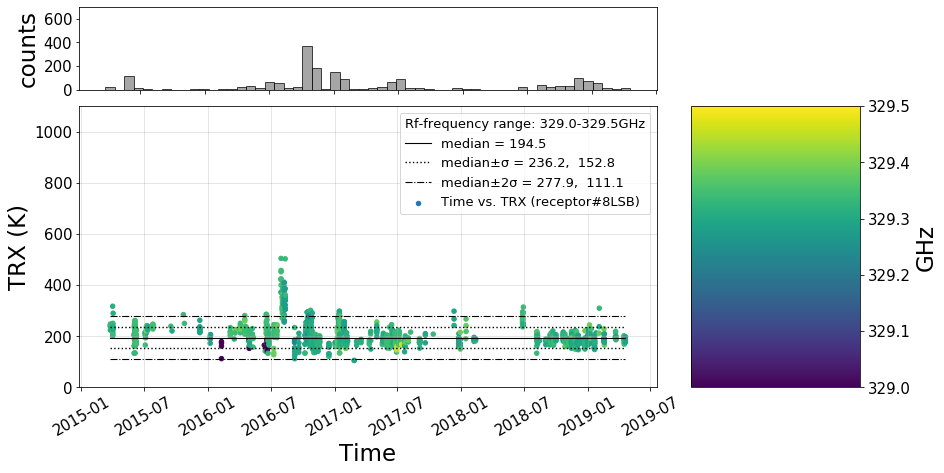

Figure G-48: Time vs. TRX, (receptor#8LSB), 329.0-329.5GHz


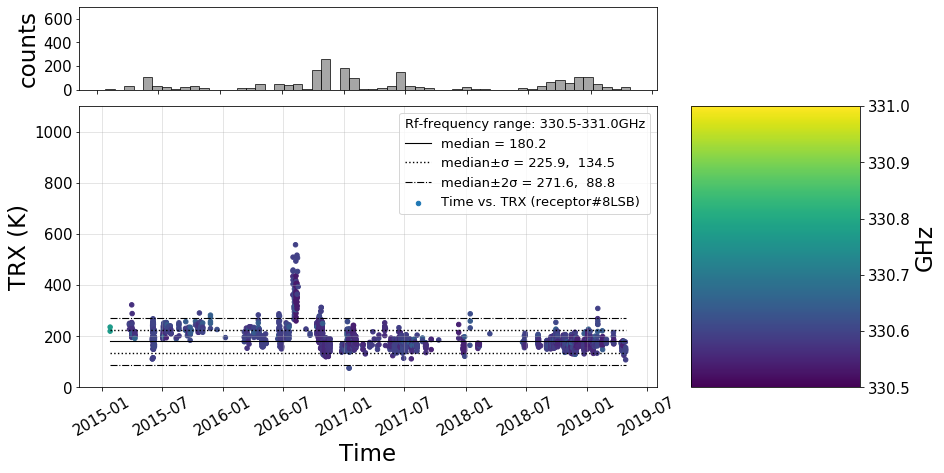

Figure G-49: Time vs. TRX, (receptor#8LSB), 330.5-331.0GHz


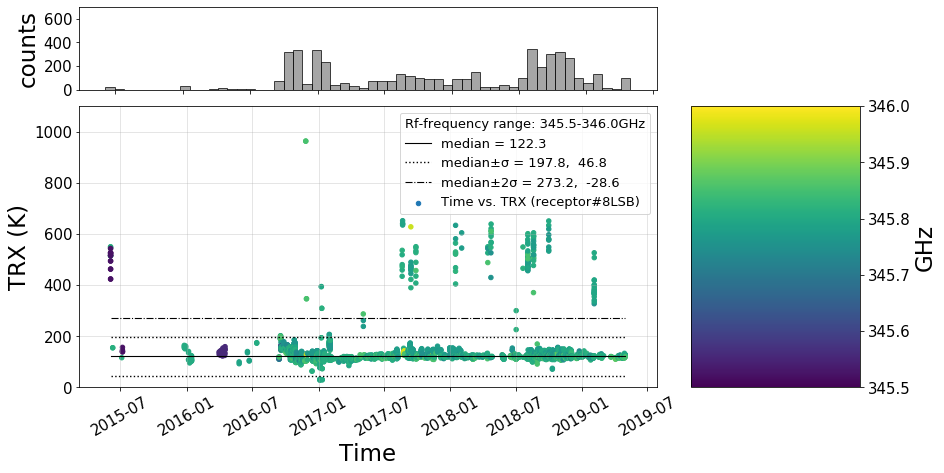

Figure G-50: Time vs. TRX, (receptor#8LSB), 345.5-346.0GHz


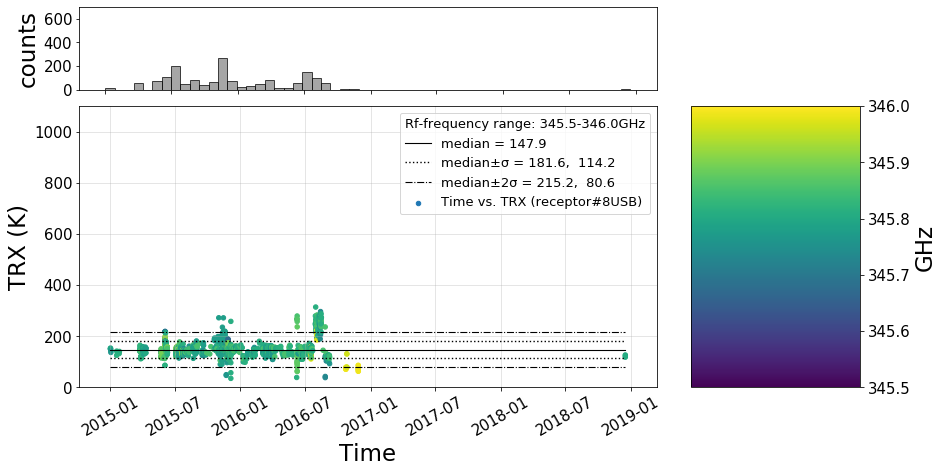

Figure G-51: Time vs. TRX, (receptor#8USB), 345.5-346.0GHz


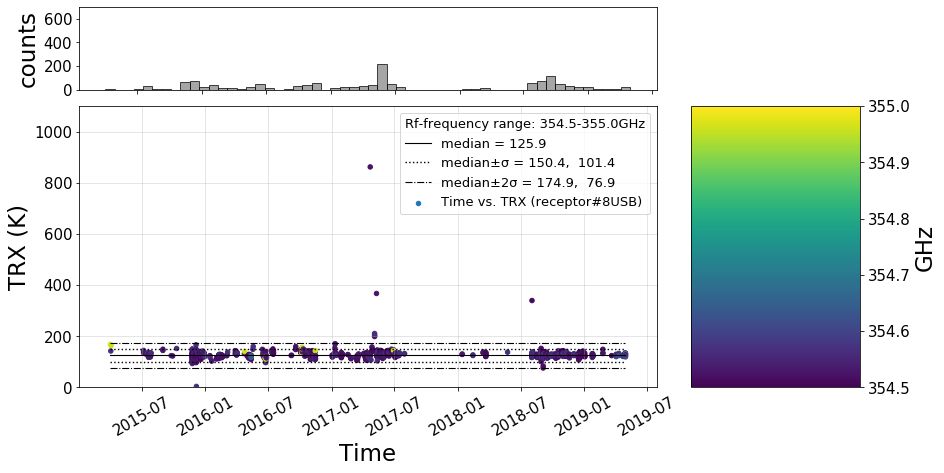

Figure G-52: Time vs. TRX, (receptor#8USB), 354.5-355.0GHz


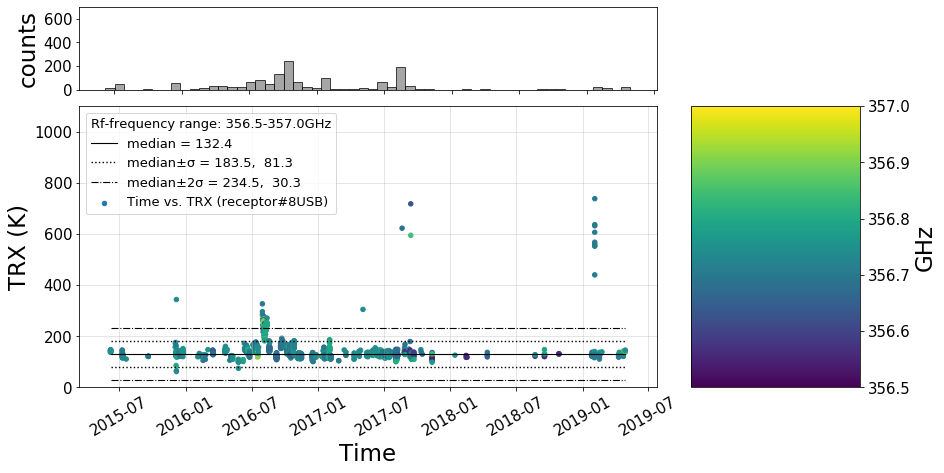

Figure G-53: Time vs. TRX, (receptor#8USB), 356.5-357.0GHz


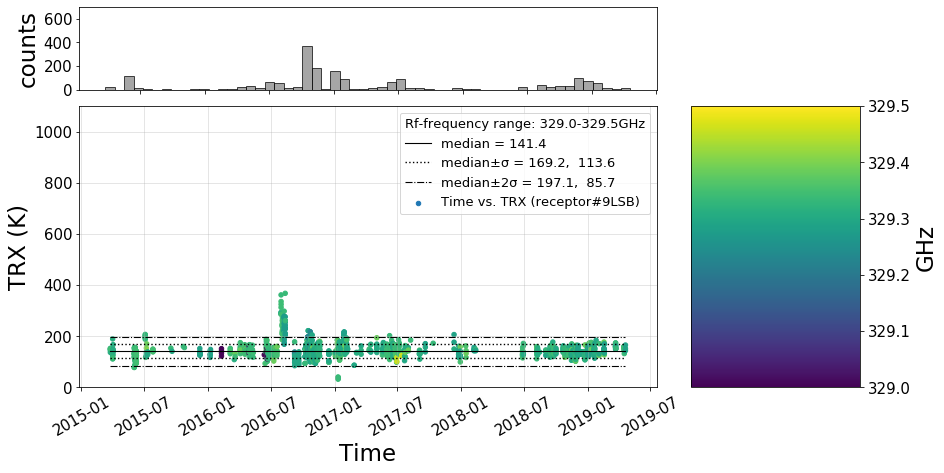

Figure G-54: Time vs. TRX, (receptor#9LSB), 329.0-329.5GHz


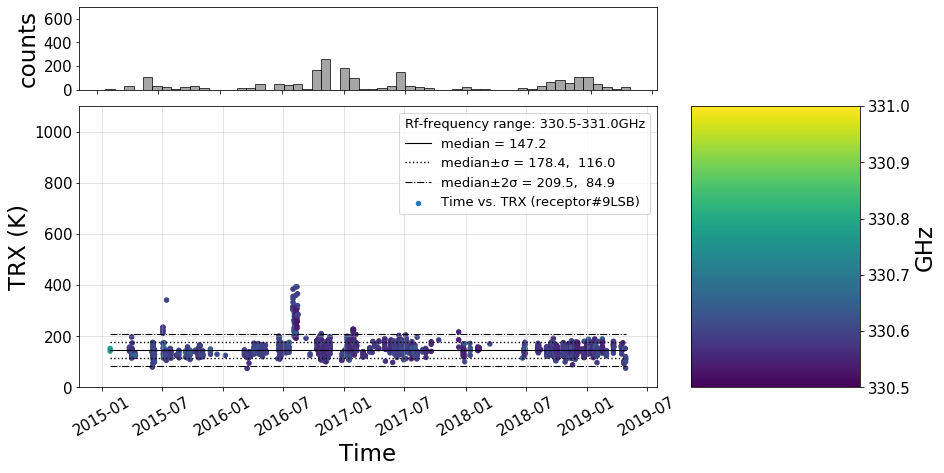

Figure G-55: Time vs. TRX, (receptor#9LSB), 330.5-331.0GHz


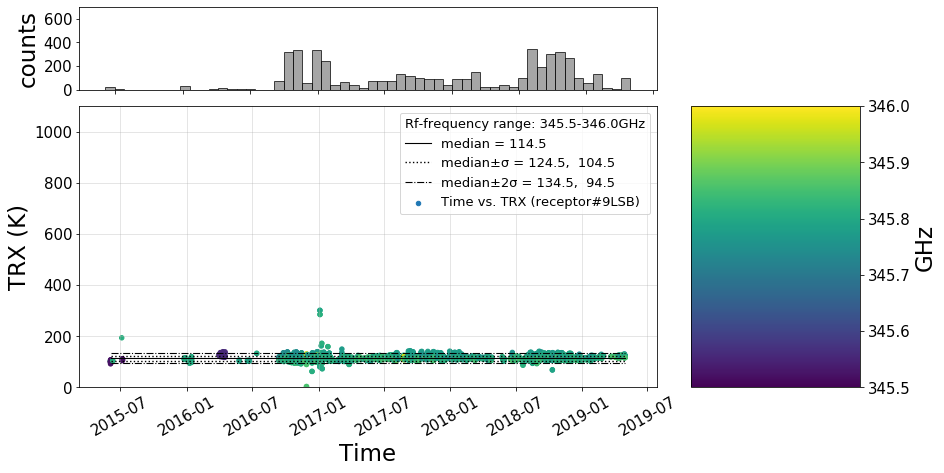

Figure G-56: Time vs. TRX, (receptor#9LSB), 345.5-346.0GHz


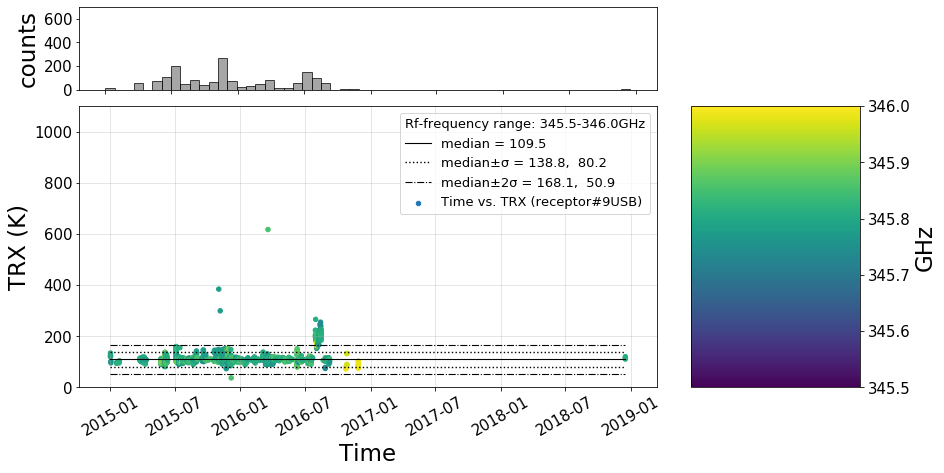

Figure G-57: Time vs. TRX, (receptor#9USB), 345.5-346.0GHz


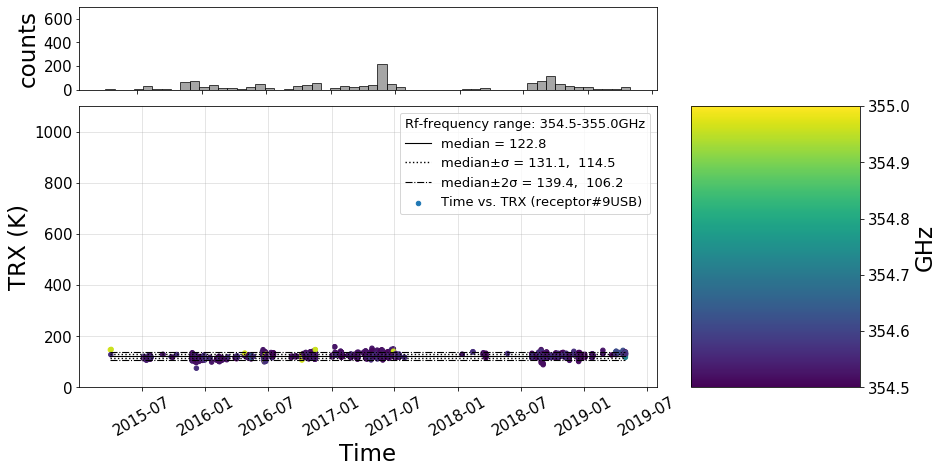

Figure G-58: Time vs. TRX, (receptor#9USB), 354.5-355.0GHz


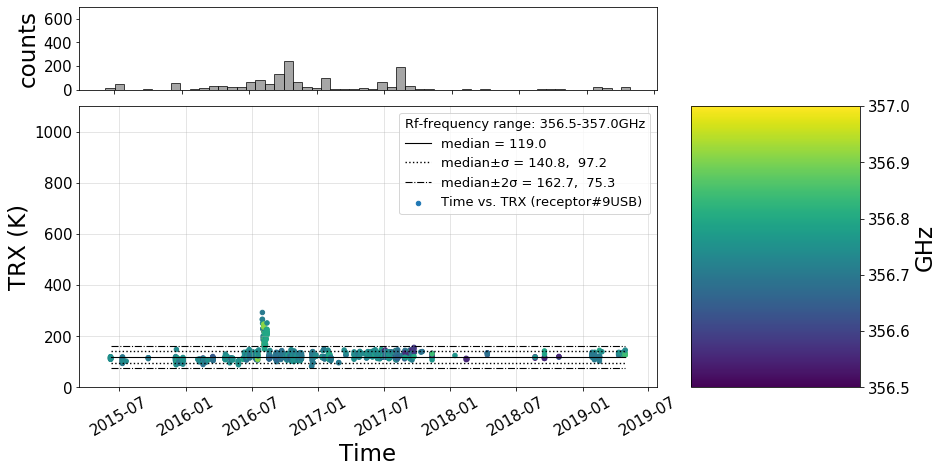

Figure G-59: Time vs. TRX, (receptor#9USB), 356.5-357.0GHz


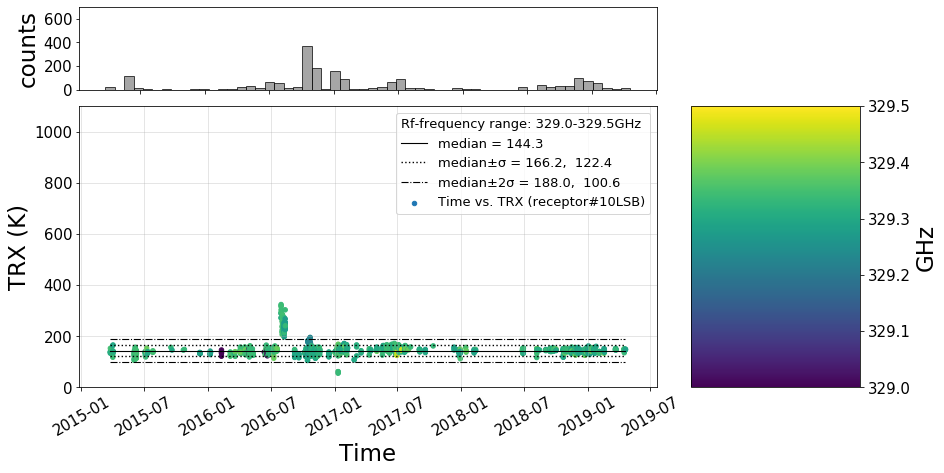

Figure G-60: Time vs. TRX, (receptor#10LSB), 329.0-329.5GHz


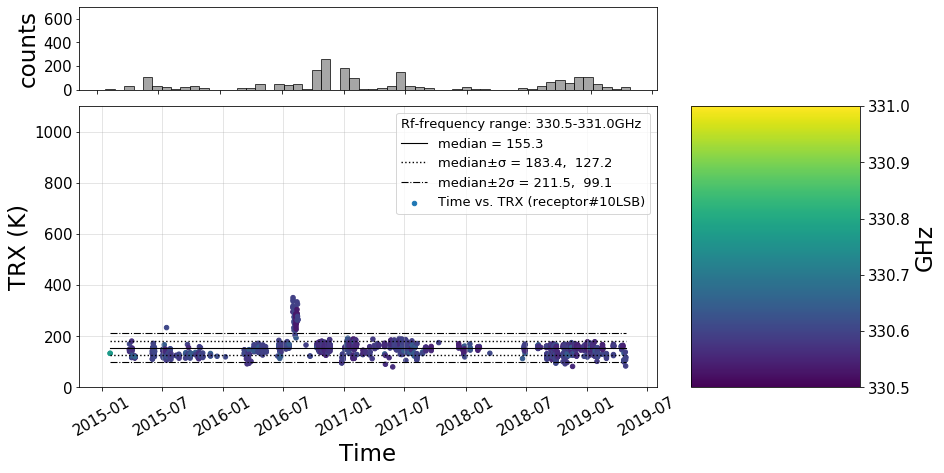

Figure G-61: Time vs. TRX, (receptor#10LSB), 330.5-331.0GHz


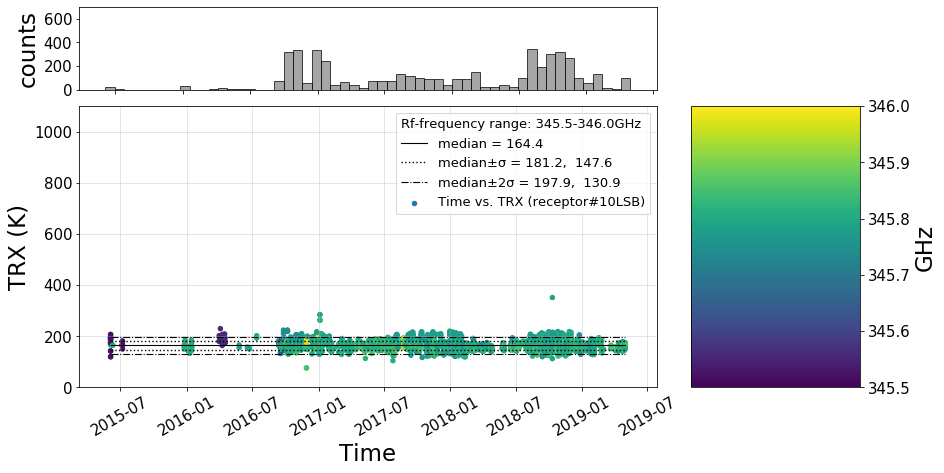

Figure G-62: Time vs. TRX, (receptor#10LSB), 345.5-346.0GHz


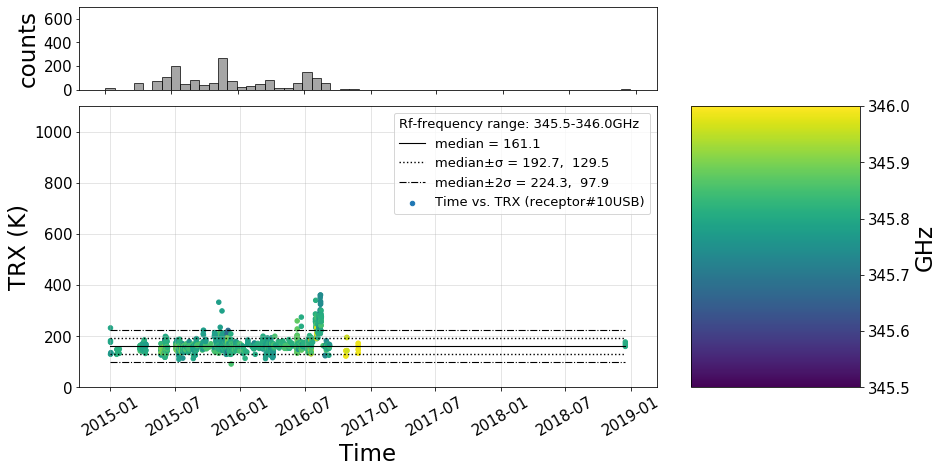

Figure G-63: Time vs. TRX, (receptor#10USB), 345.5-346.0GHz


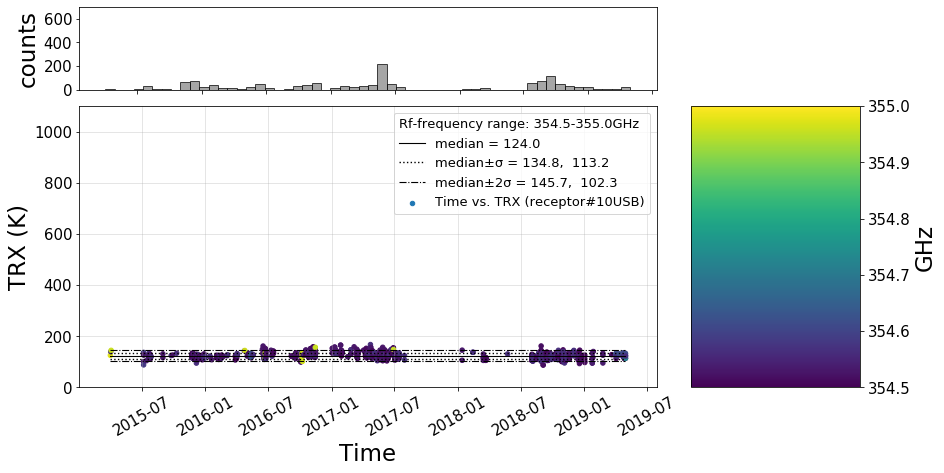

Figure G-64: Time vs. TRX, (receptor#10USB), 354.5-355.0GHz


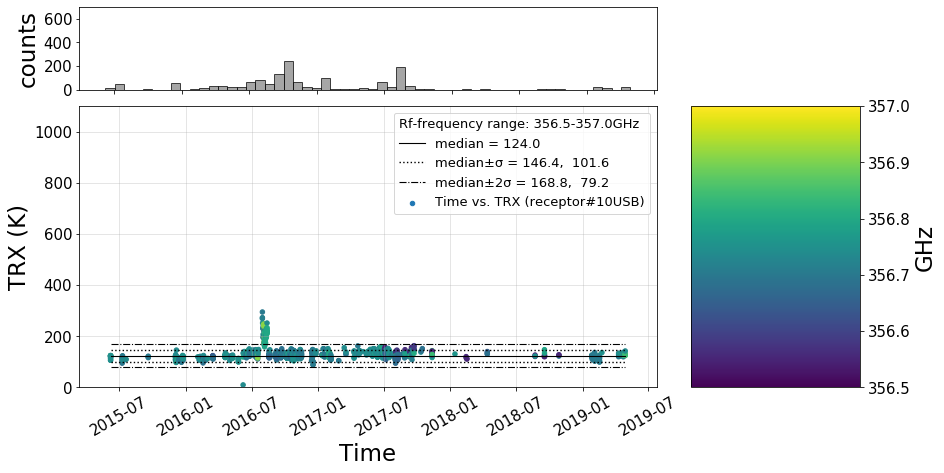

Figure G-65: Time vs. TRX, (receptor#10USB), 356.5-357.0GHz


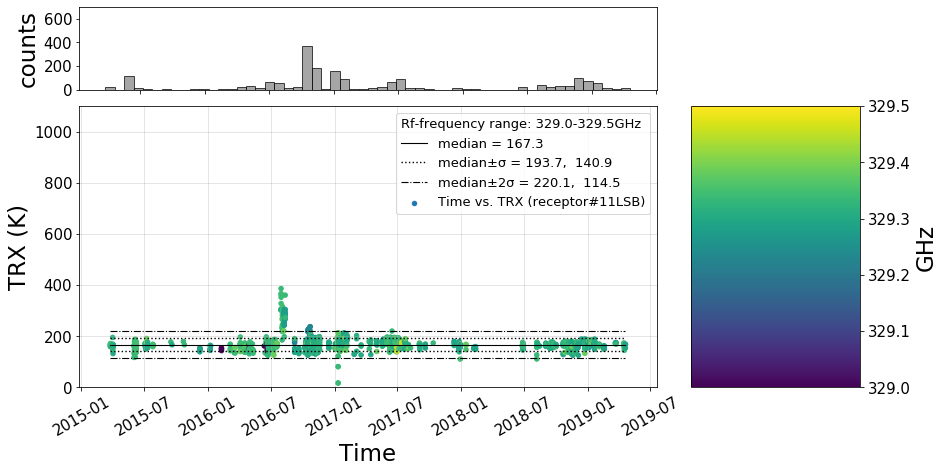

Figure G-66: Time vs. TRX, (receptor#11LSB), 329.0-329.5GHz


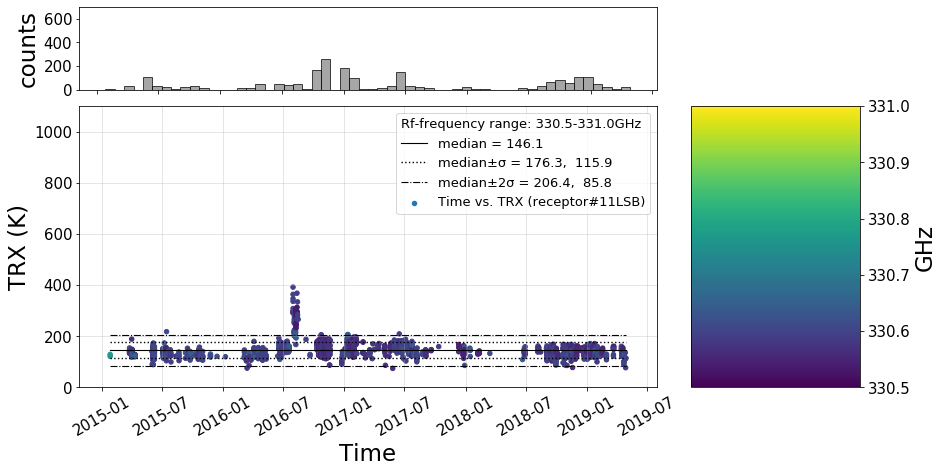

Figure G-67: Time vs. TRX, (receptor#11LSB), 330.5-331.0GHz


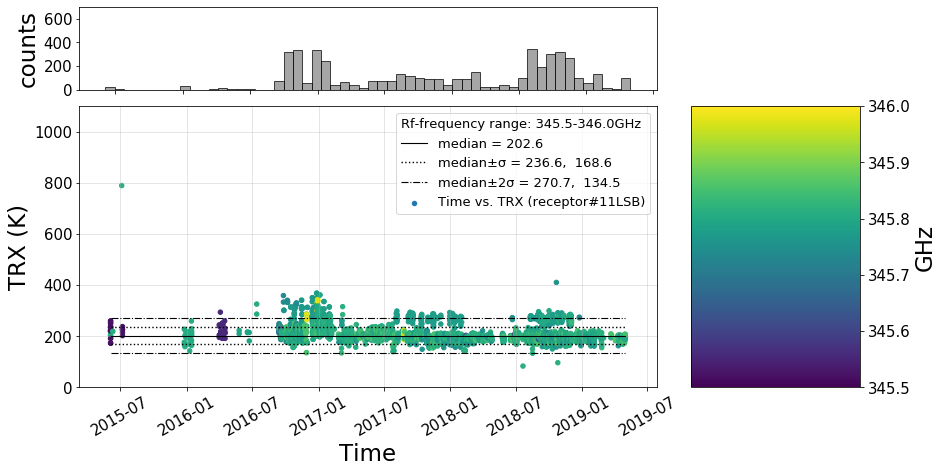

Figure G-68: Time vs. TRX, (receptor#11LSB), 345.5-346.0GHz


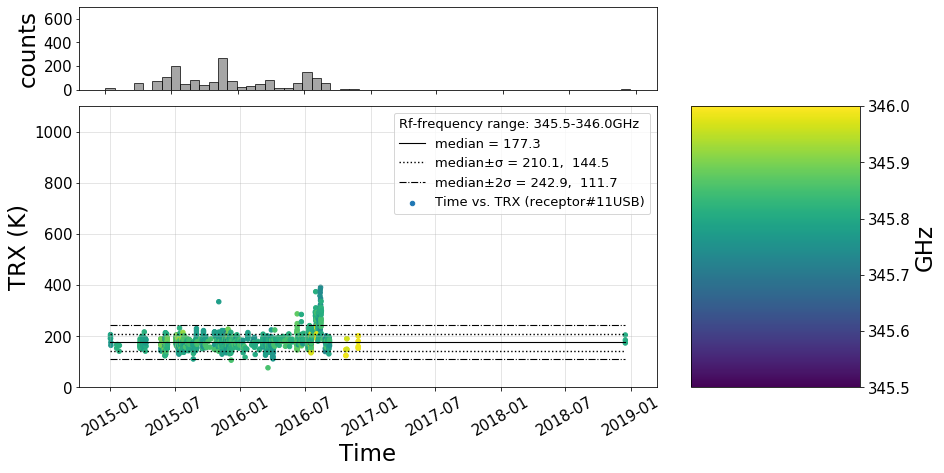

Figure G-69: Time vs. TRX, (receptor#11USB), 345.5-346.0GHz


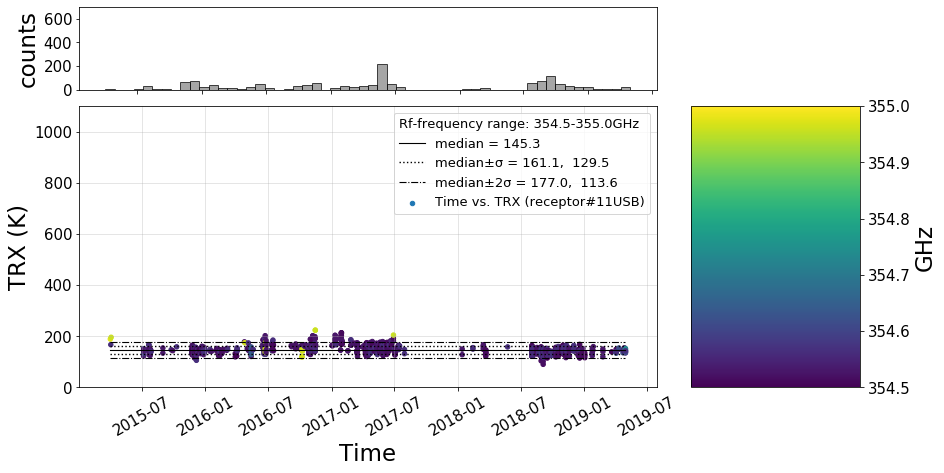

Figure G-70: Time vs. TRX, (receptor#11USB), 354.5-355.0GHz


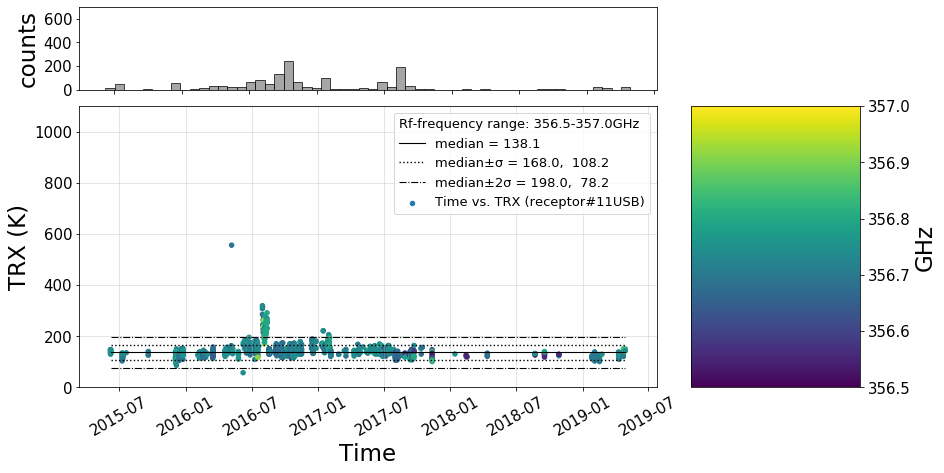

Figure G-71: Time vs. TRX, (receptor#11USB), 356.5-357.0GHz


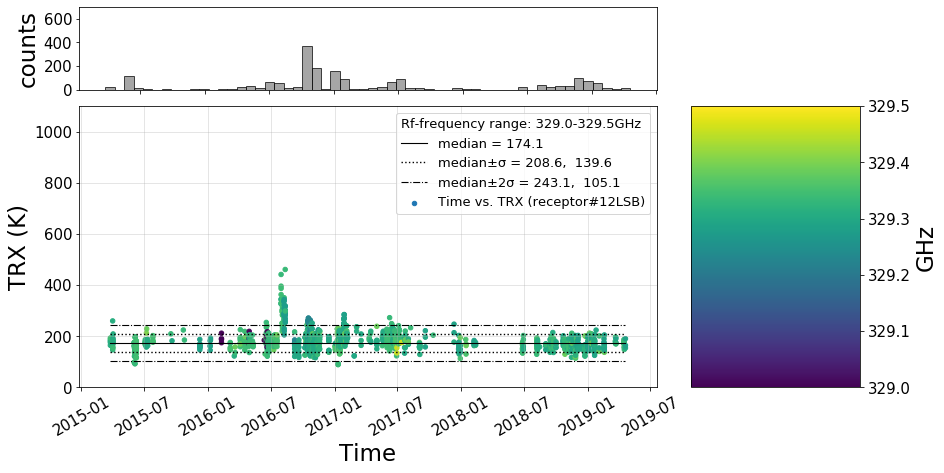

Figure G-72: Time vs. TRX, (receptor#12LSB), 329.0-329.5GHz


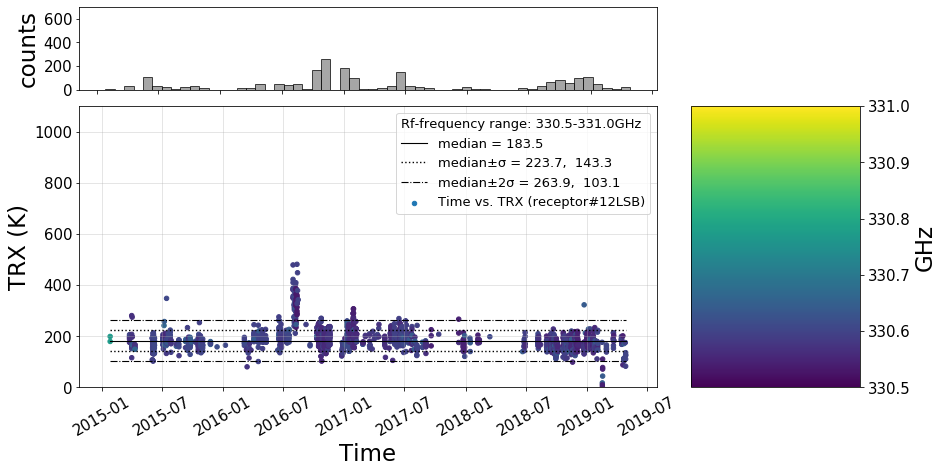

Figure G-73: Time vs. TRX, (receptor#12LSB), 330.5-331.0GHz


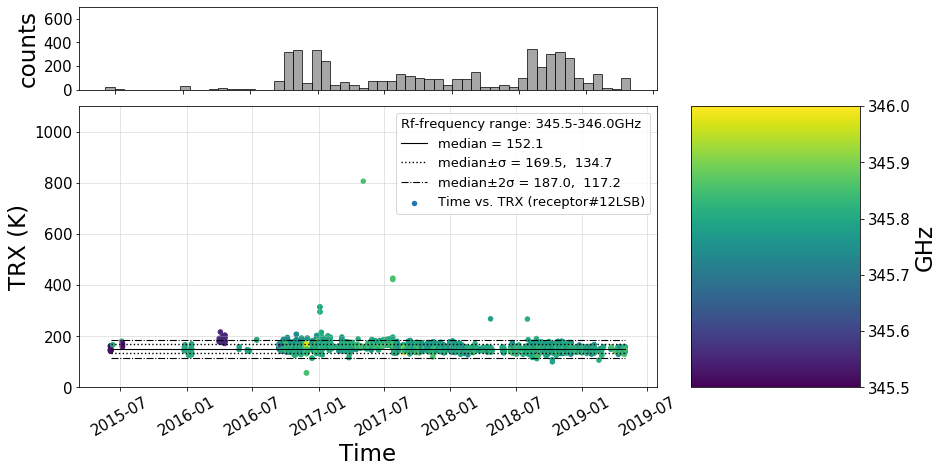

Figure G-74: Time vs. TRX, (receptor#12LSB), 345.5-346.0GHz


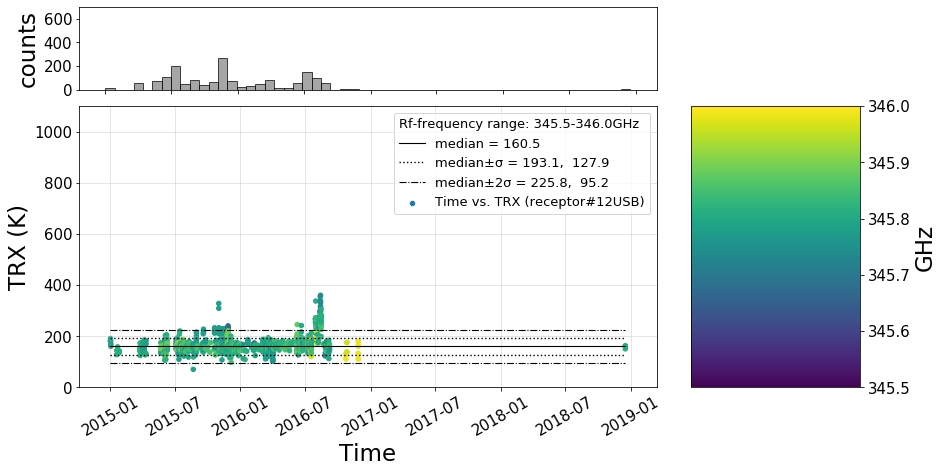

Figure G-75: Time vs. TRX, (receptor#12USB), 345.5-346.0GHz


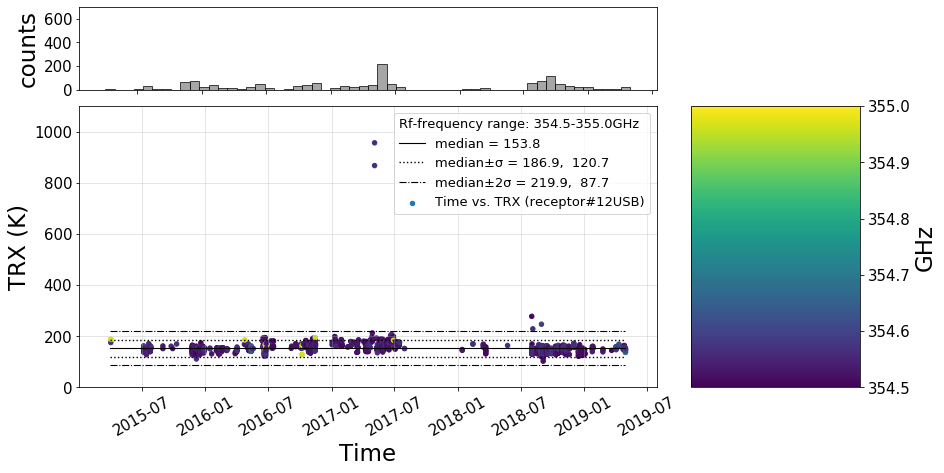

Figure G-76: Time vs. TRX, (receptor#12USB), 354.5-355.0GHz


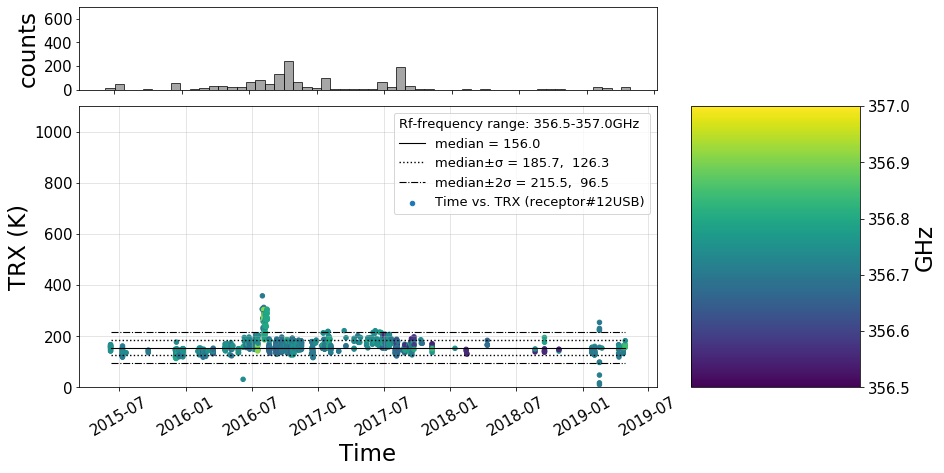

Figure G-77: Time vs. TRX, (receptor#12USB), 356.5-357.0GHz


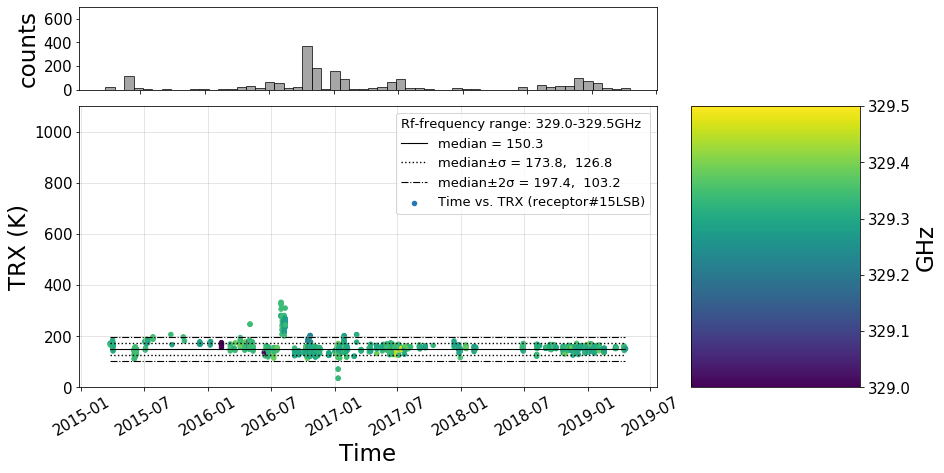

Figure G-78: Time vs. TRX, (receptor#15LSB), 329.0-329.5GHz


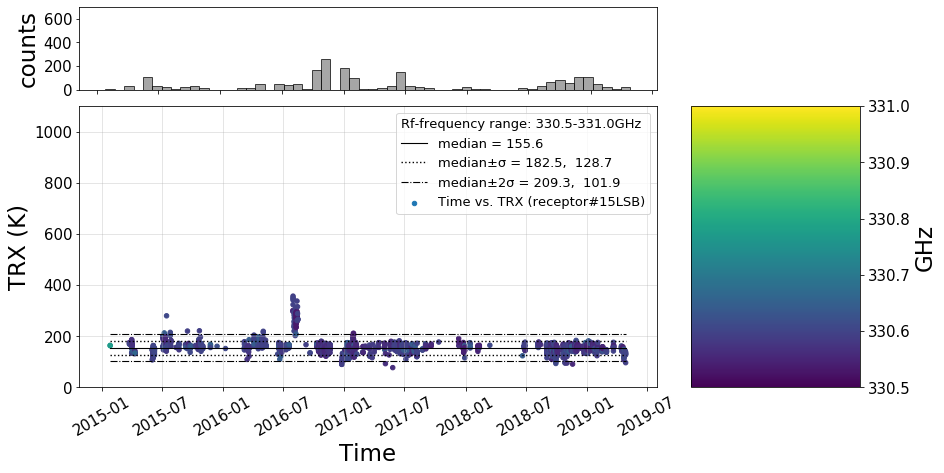

Figure G-79: Time vs. TRX, (receptor#15LSB), 330.5-331.0GHz


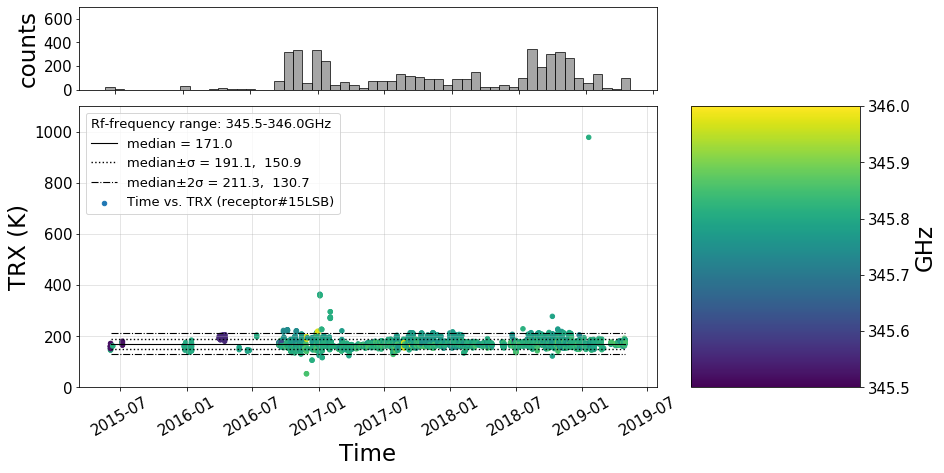

Figure G-80: Time vs. TRX, (receptor#15LSB), 345.5-346.0GHz


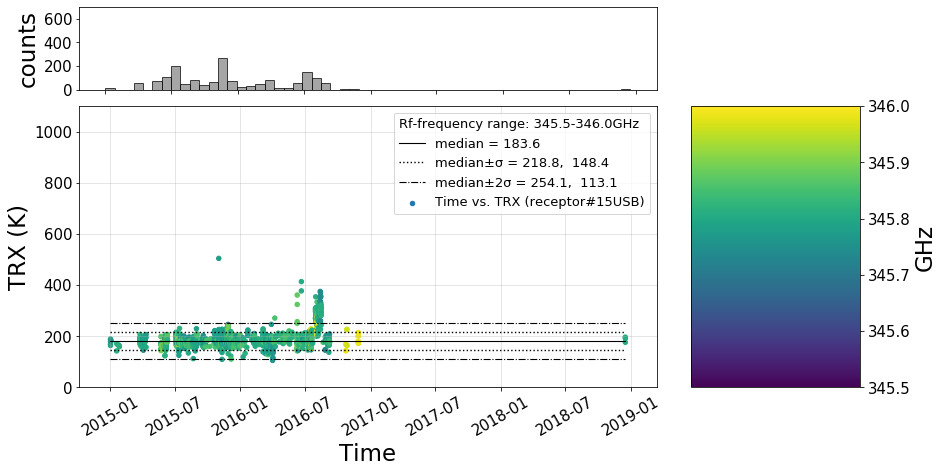

Figure G-81: Time vs. TRX, (receptor#15USB), 345.5-346.0GHz


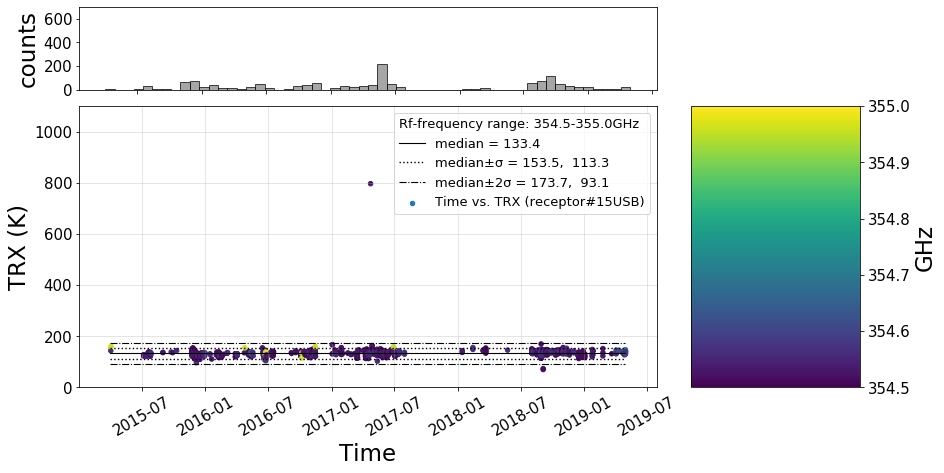

Figure G-82: Time vs. TRX, (receptor#15USB), 354.5-355.0GHz


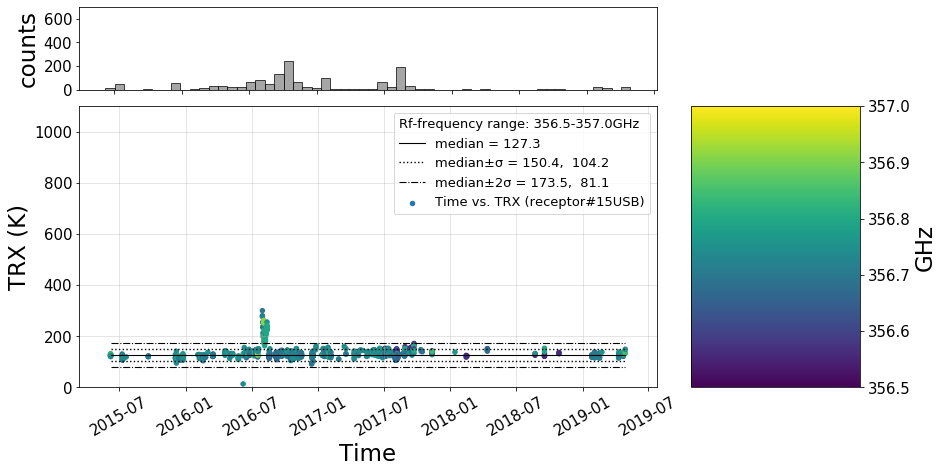

Figure G-83: Time vs. TRX, (receptor#15USB), 356.5-357.0GHz


In [207]:
all_s = ['LSB','USB']
num=0
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
    for s in all_s:
        txtfile = pd.read_csv(file, header = 0, sep=' ')
        txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile['receptor']==i)]
        if freq_type=='lofreq':
            start=326
            stop=373
            interval=95
        elif freq_type=='rffreq':
            start=324
            stop=378
            interval=109
        lins = np.linspace(start, stop, interval)
        for x in lins:
            x_max= x+0.5
            trx = txtfile2['trx'][(x<=txtfile2[freq_type])&(txtfile2[freq_type]<x_max)]
            a=trx.count()
            if a > 2:
                stdev= st.stdev(trx)
                median=round(st.median(trx), 1)
                range_max= round(median+stdev,1)
                range_min= round(median-stdev,1)
                two_sigma= round(median+(stdev*2),1)
                two_sigma_minus= round(median-(stdev*2),1)
            if (a > 850):
                ax.plot((x, x_max), (median, median), 'black', Linewidth = 0.8)
                rect=matplotlib.patches.Rectangle((x,range_min), w, h, facecolor='#8c510a', edgecolor='black')
                ax.add_patch(rect)                
                txtfile3= txtfile[(txtfile['receptor']==i)&(txtfile['sideband']==s)&(txtfile[freq_type]>x)&(txtfile[freq_type]<=x_max)]
                gs = GridSpec(4,4)
                fig = plt.figure(figsize=(14,7))
                ax_main = fig.add_subplot(gs[1:4,0:3])
                ax_sub1 = fig.add_subplot(gs[0,0:3])
                ax_sub2 = plt.subplot(gs[1:4,3])               
                utc=Time(txtfile3['time'], scale='tai', format='mjd').utc.datetime
                new = pd.Series(utc)
                sc = ax_main.scatter(utc, txtfile3['trx'], label = 'Time vs. TRX (receptor#' + str(i) + s + ')', c=txtfile3[freq_type], s= 20, cmap=plt.cm.viridis)
                sc.set_clim(vmin=x, vmax=x_max)              
                ax_main.plot((utc.min(),utc.max()),(median, median), linewidth=1.1, label = 'median = '+str(median), color = 'black')
                ax_main.plot((utc.min(),utc.max()),(range_max, range_max), linewidth=1.4, label = 'median±σ = '+str(range_max)+',  '+str(range_min), color = 'black', linestyle=':')
                ax_main.plot((utc.min(),utc.max()),(two_sigma, two_sigma), linewidth=1.1, label = 'median±2σ = '+str(two_sigma)+',  '+str(two_sigma_minus), color = 'black', linestyle='-.')
                ax_main.plot((utc.min(),utc.max()),(two_sigma_minus, two_sigma_minus), linewidth=1.1, color = 'black', linestyle='-.')
                ax_main.plot((utc.min(),utc.max()),(range_min, range_min), linewidth=1.4, color = 'black', linestyle=':')                
                ax_sub1.hist(new, bins = 56, facecolor='grey', edgecolor='black', alpha=.7)
                plt.colorbar(sc, cax = ax_sub2, aspect=5)  
                ax_main.set_xlabel('Time', fontsize = 23)
                ax_main.set_ylabel('TRX (K)', fontsize = 23)
                ax_sub1.set_ylabel('counts', fontsize = 23)
                ax_sub2.set_ylabel('GHz', fontsize = 23)
                legend=ax_main.legend(loc='best', title= freq_name+' range: ' + str(x) + '-' + str(x_max) + 'GHz', fancybox= True, fontsize=13)
                legend._legend_box.align='left'
                plt.setp(legend.get_title(),fontsize=13)
                plt.setp(legend,alpha=0.7)
                plt.setp(ax_sub1.get_xticklabels(), visible=False, fontsize=10)
                plt.setp(ax_sub1.get_yticklabels(), fontsize=15)
                plt.setp(ax_main.get_xticklabels(), fontsize=15, rotation= 30)
                plt.setp(ax_main.get_yticklabels(), fontsize=15)
                plt.setp(ax_sub2.get_yticklabels(), fontsize=15)
                ax_main.set_ylim(0,1100)
                ax_sub1.set_ylim(0,700)
                ax_main.grid(alpha=.4)
                plt.show()                
                print('Figure G-'+str(num)+': Time vs. TRX, (receptor#'+str(i)+s+'), '+str(x)+'-'+str(x_max)+'GHz')
                num=num+1


## 9. Each receptor's relation of time and high TRX in specific frequency range

The plots below describe the relation of time and high TRX in specific frequency range. In the plots below, high TRX is considered as TRX which is over two sigma range in Figure G. 

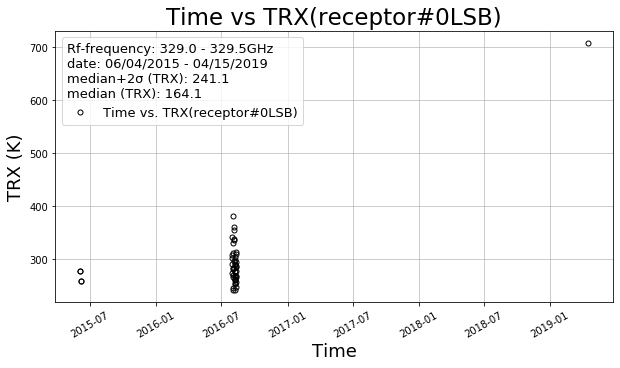

Figure H-0: Time vs. TRX, (receptor#0LSB), 329.0-329.5GHz


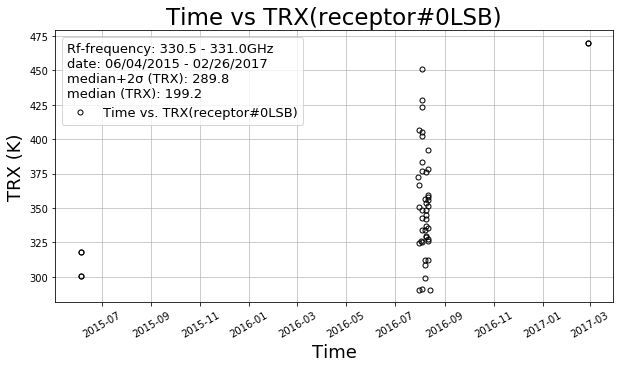

Figure H-1: Time vs. TRX, (receptor#0LSB), 330.5-331.0GHz


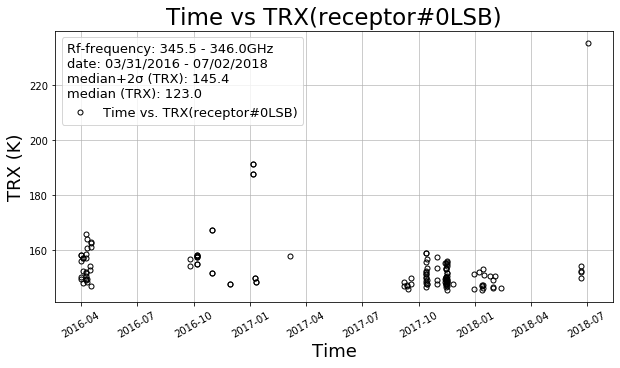

Figure H-2: Time vs. TRX, (receptor#0LSB), 345.5-346.0GHz


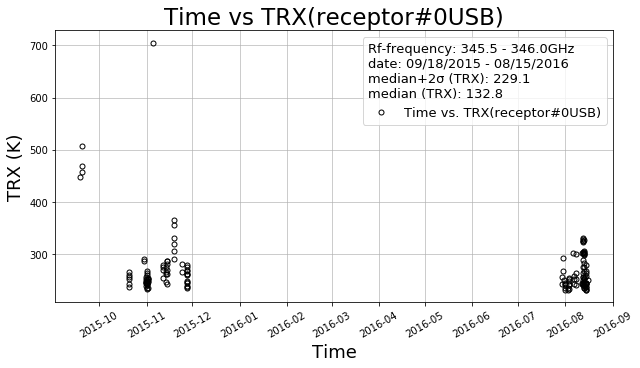

Figure H-3: Time vs. TRX, (receptor#0USB), 345.5-346.0GHz


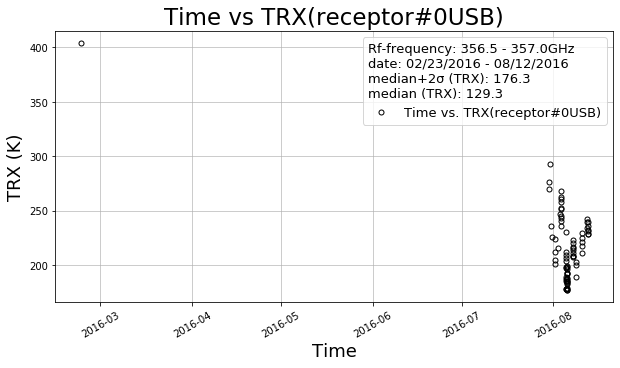

Figure H-4: Time vs. TRX, (receptor#0USB), 356.5-357.0GHz


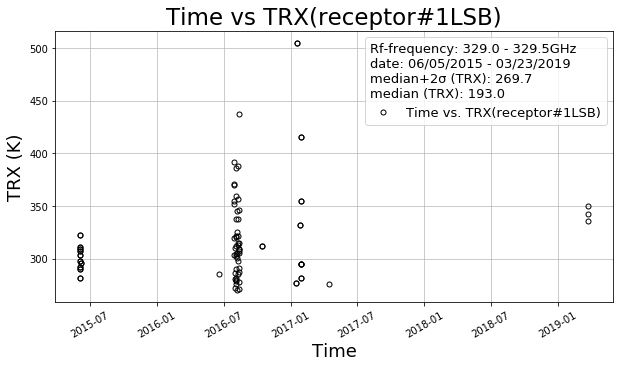

Figure H-5: Time vs. TRX, (receptor#1LSB), 329.0-329.5GHz


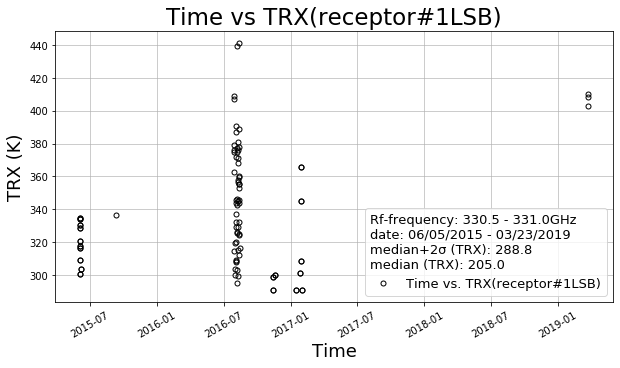

Figure H-6: Time vs. TRX, (receptor#1LSB), 330.5-331.0GHz


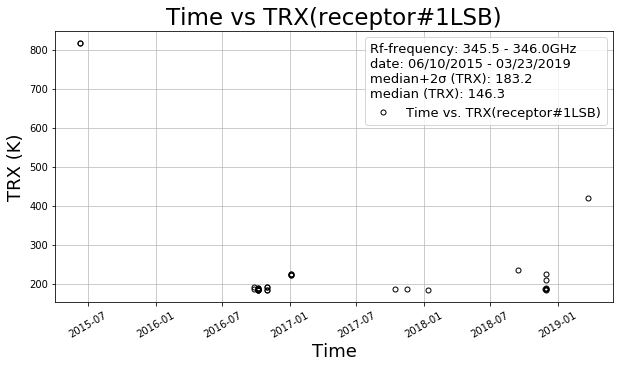

Figure H-7: Time vs. TRX, (receptor#1LSB), 345.5-346.0GHz


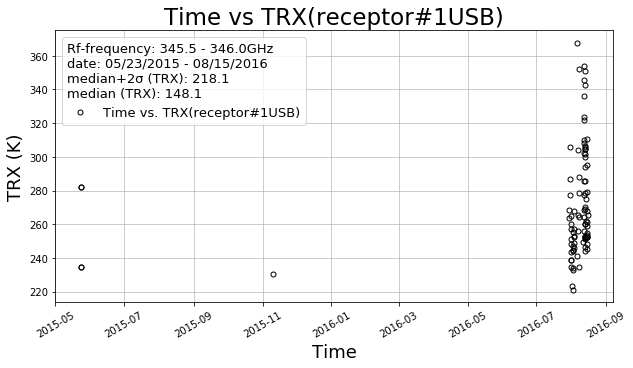

Figure H-8: Time vs. TRX, (receptor#1USB), 345.5-346.0GHz


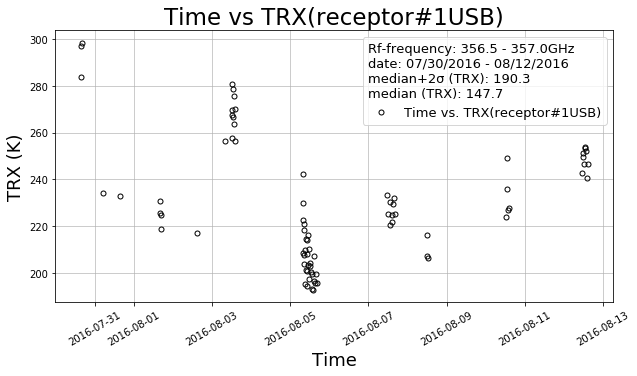

Figure H-9: Time vs. TRX, (receptor#1USB), 356.5-357.0GHz


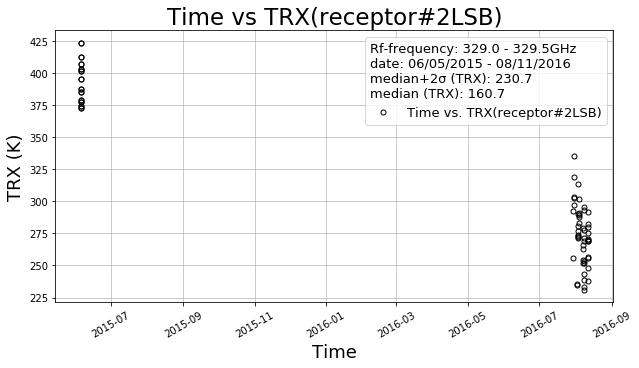

Figure H-10: Time vs. TRX, (receptor#2LSB), 329.0-329.5GHz


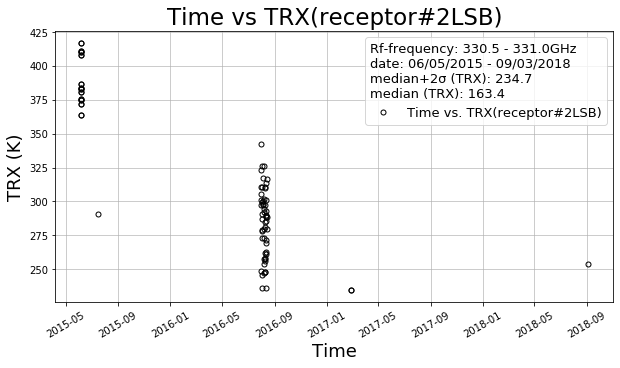

Figure H-11: Time vs. TRX, (receptor#2LSB), 330.5-331.0GHz


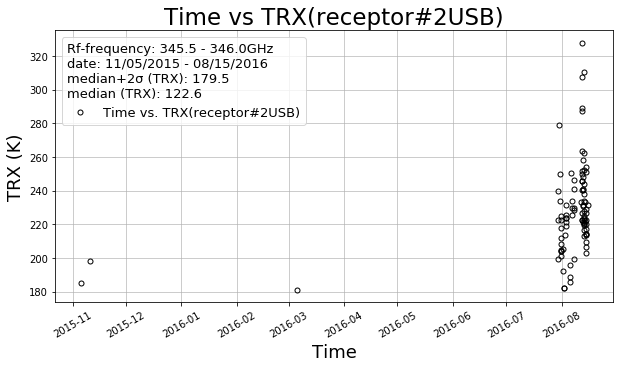

Figure H-12: Time vs. TRX, (receptor#2USB), 345.5-346.0GHz


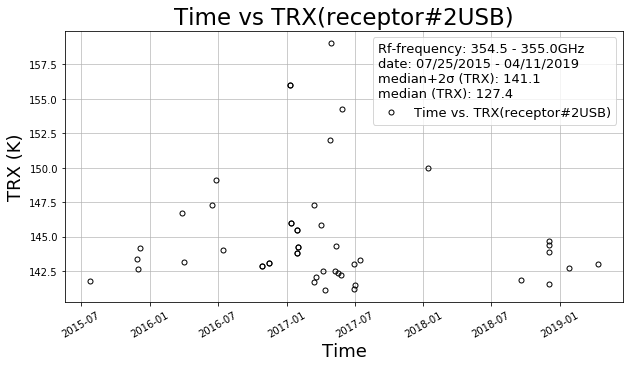

Figure H-13: Time vs. TRX, (receptor#2USB), 354.5-355.0GHz


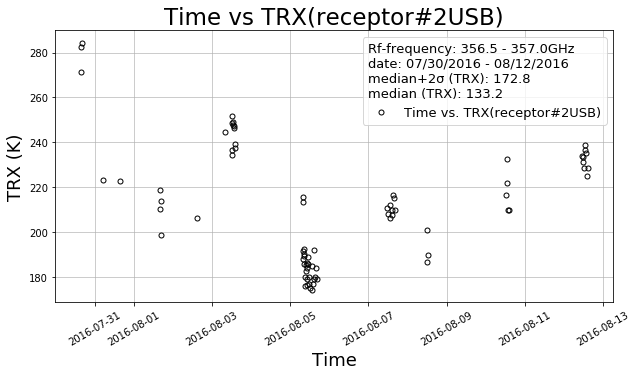

Figure H-14: Time vs. TRX, (receptor#2USB), 356.5-357.0GHz


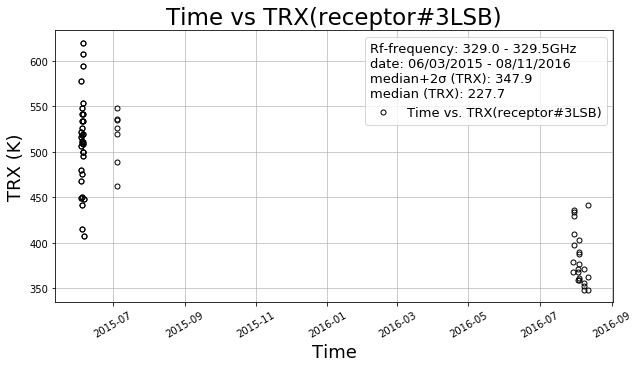

Figure H-15: Time vs. TRX, (receptor#3LSB), 329.0-329.5GHz


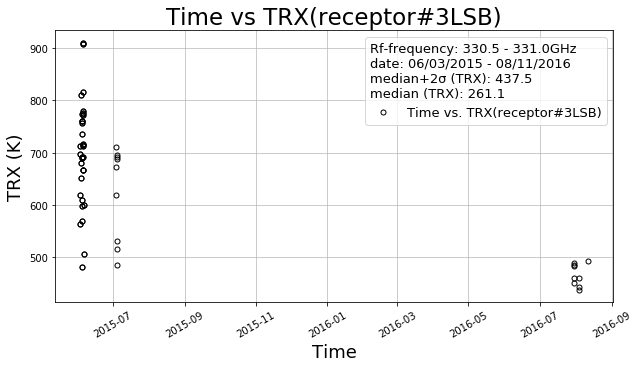

Figure H-16: Time vs. TRX, (receptor#3LSB), 330.5-331.0GHz


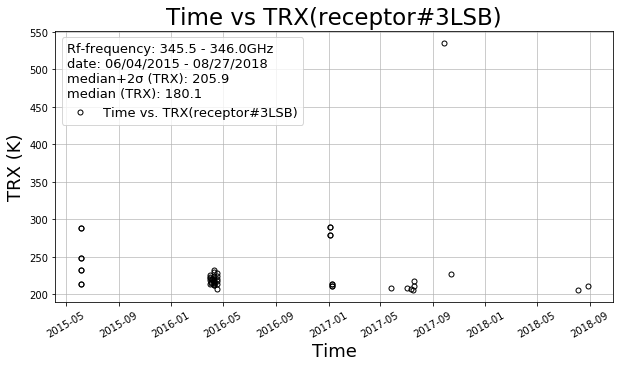

Figure H-17: Time vs. TRX, (receptor#3LSB), 345.5-346.0GHz


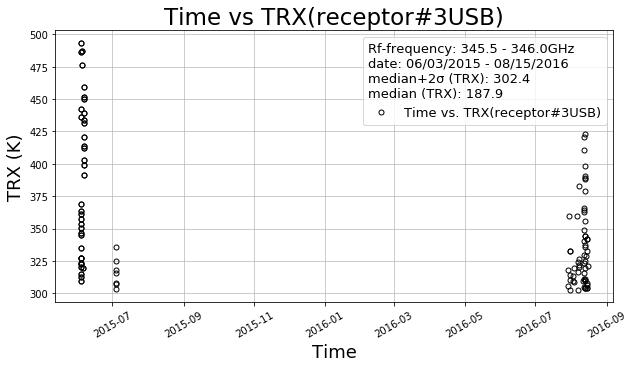

Figure H-18: Time vs. TRX, (receptor#3USB), 345.5-346.0GHz


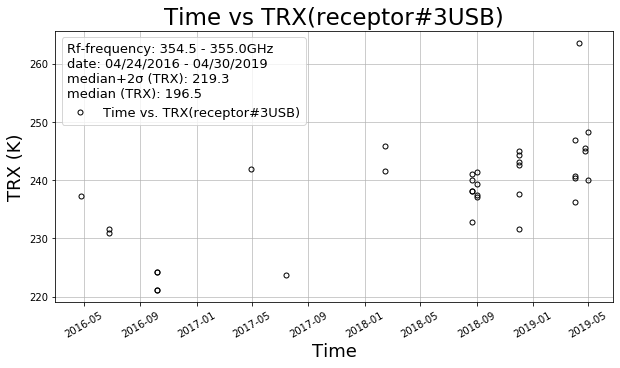

Figure H-19: Time vs. TRX, (receptor#3USB), 354.5-355.0GHz


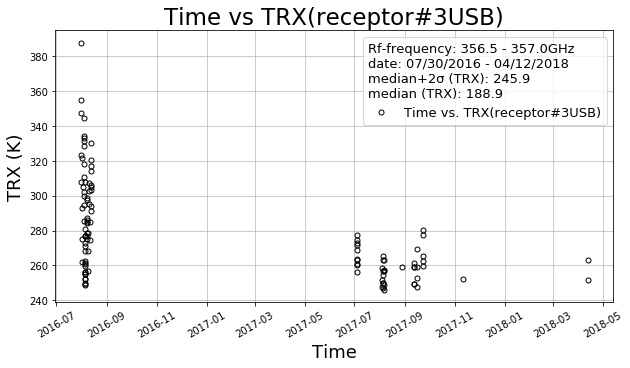

Figure H-20: Time vs. TRX, (receptor#3USB), 356.5-357.0GHz


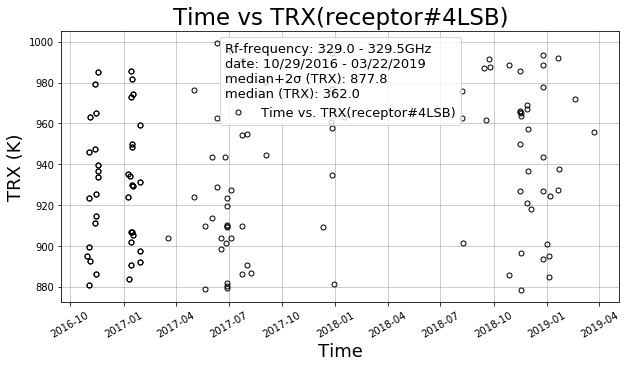

Figure H-21: Time vs. TRX, (receptor#4LSB), 329.0-329.5GHz


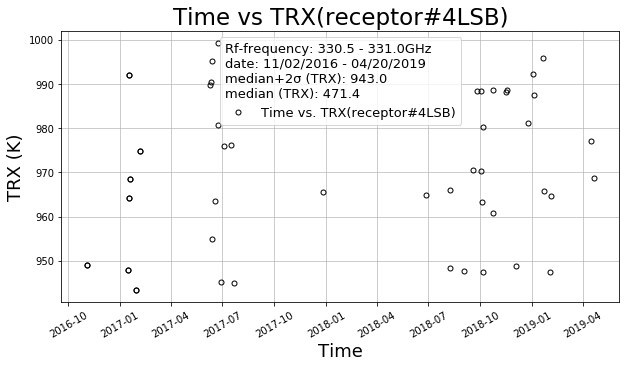

Figure H-22: Time vs. TRX, (receptor#4LSB), 330.5-331.0GHz


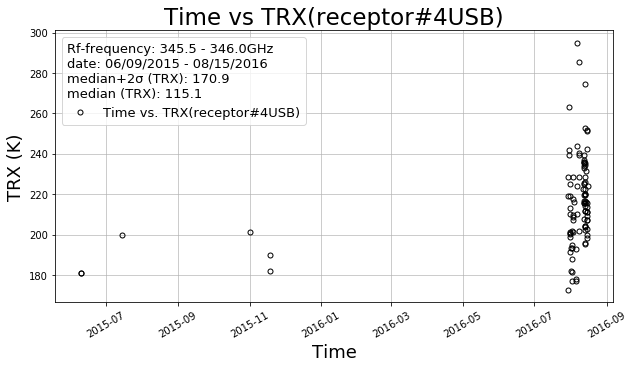

Figure H-23: Time vs. TRX, (receptor#4USB), 345.5-346.0GHz


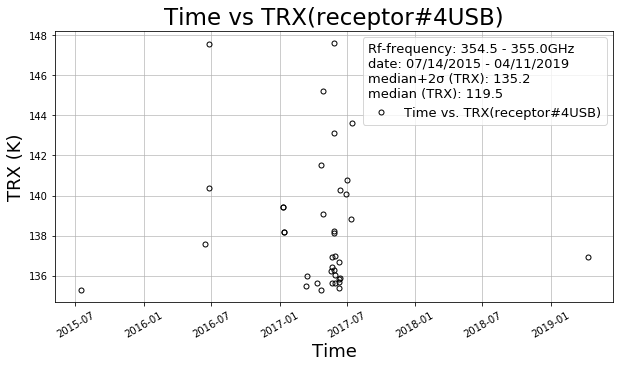

Figure H-24: Time vs. TRX, (receptor#4USB), 354.5-355.0GHz


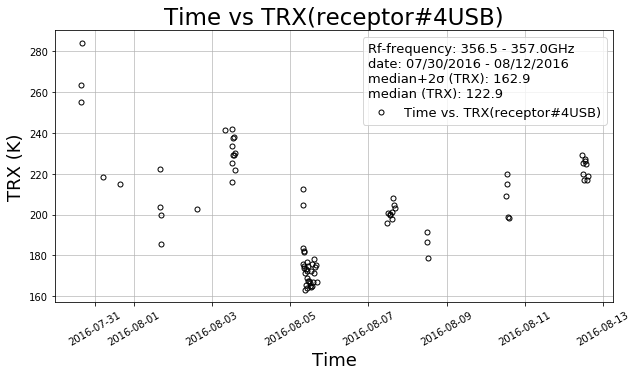

Figure H-25: Time vs. TRX, (receptor#4USB), 356.5-357.0GHz


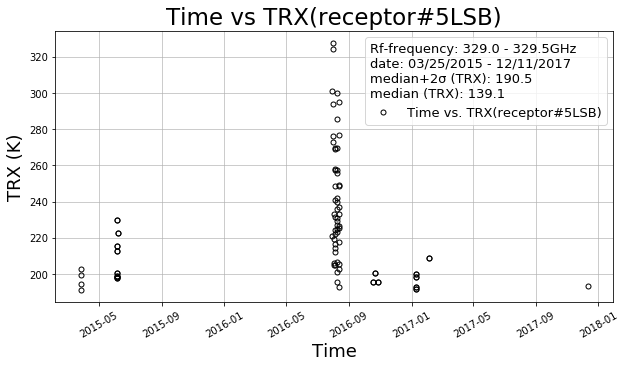

Figure H-26: Time vs. TRX, (receptor#5LSB), 329.0-329.5GHz


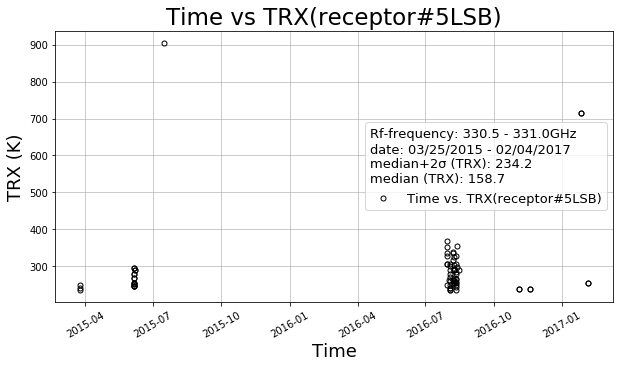

Figure H-27: Time vs. TRX, (receptor#5LSB), 330.5-331.0GHz


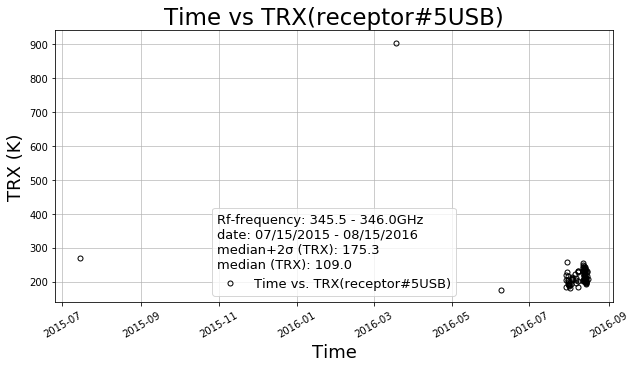

Figure H-28: Time vs. TRX, (receptor#5USB), 345.5-346.0GHz


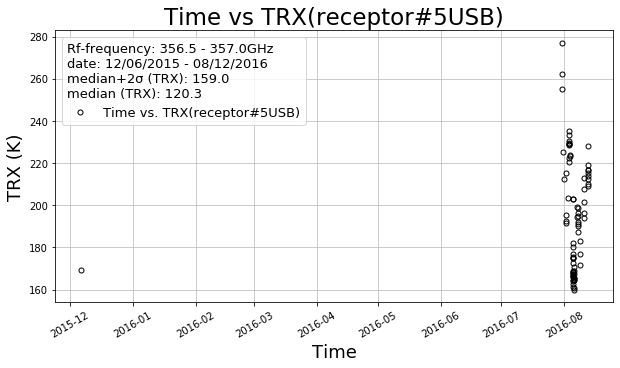

Figure H-29: Time vs. TRX, (receptor#5USB), 356.5-357.0GHz


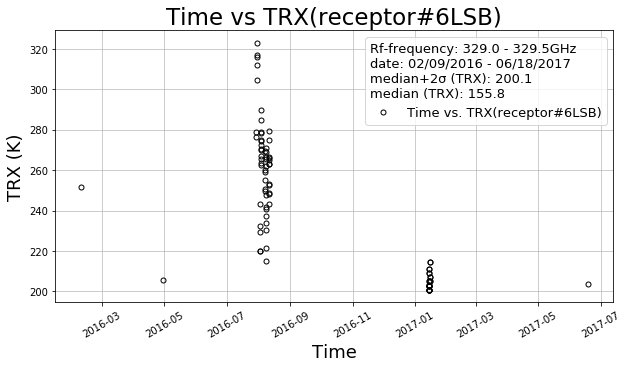

Figure H-30: Time vs. TRX, (receptor#6LSB), 329.0-329.5GHz


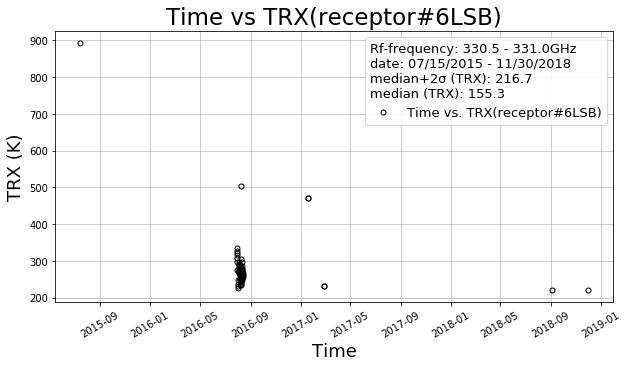

Figure H-31: Time vs. TRX, (receptor#6LSB), 330.5-331.0GHz


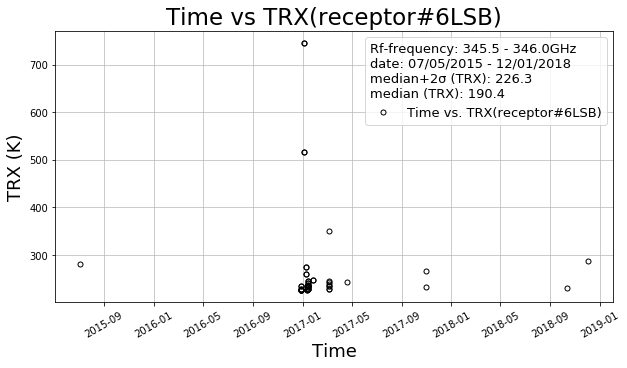

Figure H-32: Time vs. TRX, (receptor#6LSB), 345.5-346.0GHz


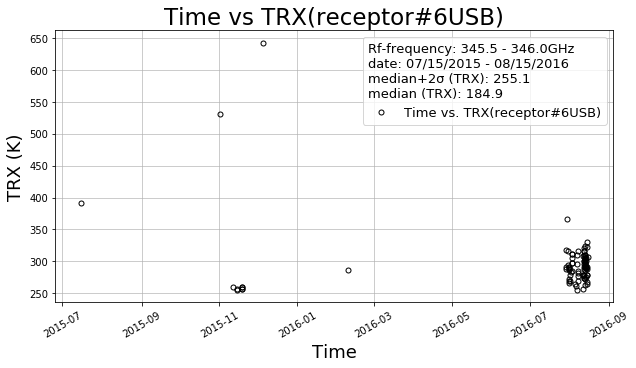

Figure H-33: Time vs. TRX, (receptor#6USB), 345.5-346.0GHz


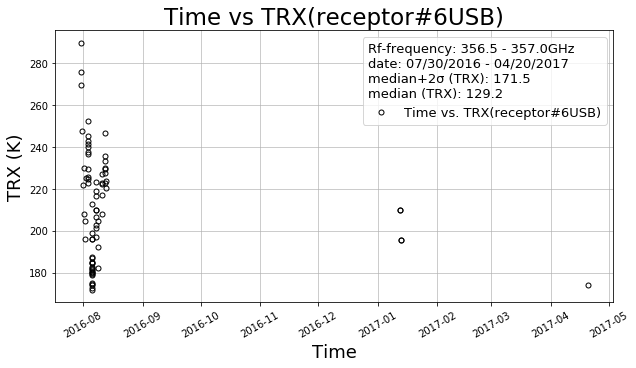

Figure H-34: Time vs. TRX, (receptor#6USB), 356.5-357.0GHz


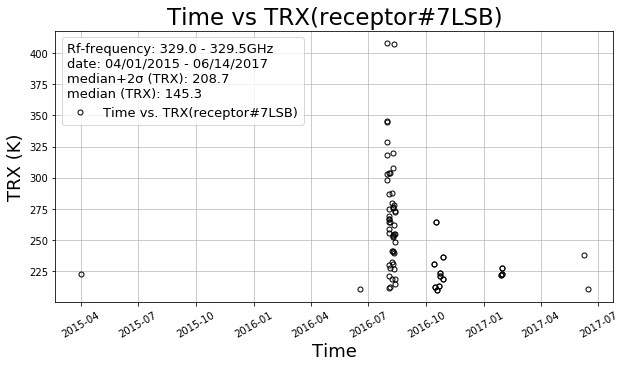

Figure H-35: Time vs. TRX, (receptor#7LSB), 329.0-329.5GHz


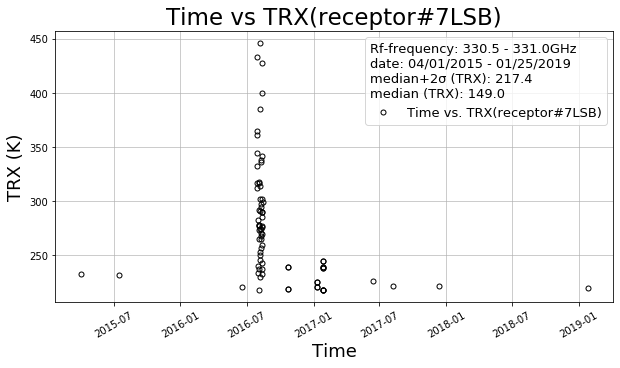

Figure H-36: Time vs. TRX, (receptor#7LSB), 330.5-331.0GHz


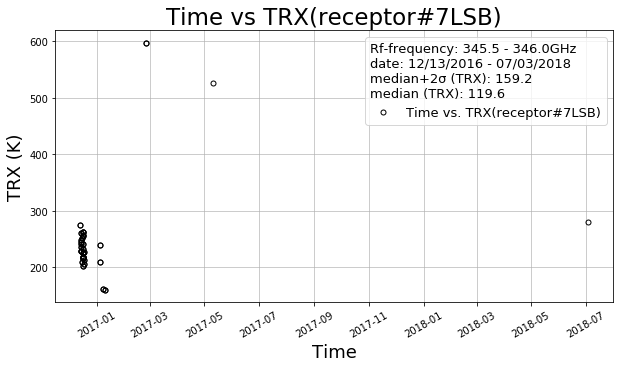

Figure H-37: Time vs. TRX, (receptor#7LSB), 345.5-346.0GHz


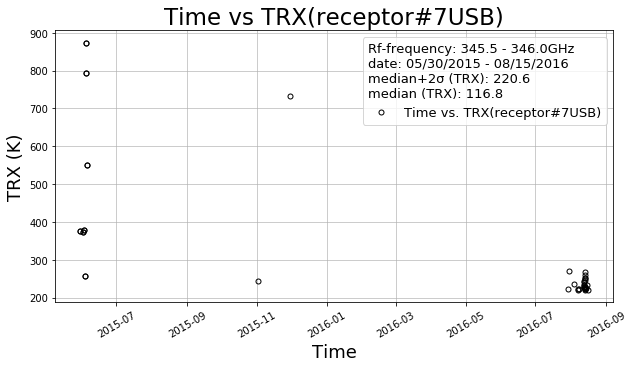

Figure H-38: Time vs. TRX, (receptor#7USB), 345.5-346.0GHz


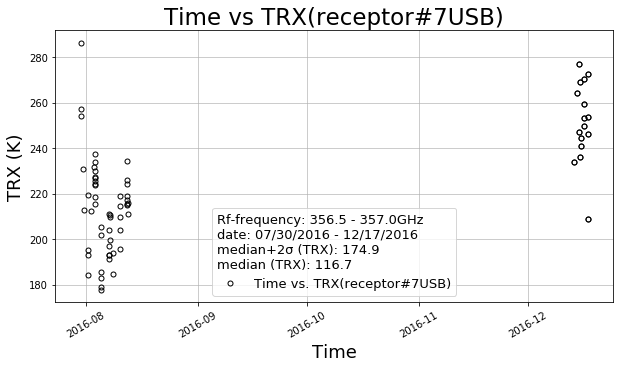

Figure H-39: Time vs. TRX, (receptor#7USB), 356.5-357.0GHz


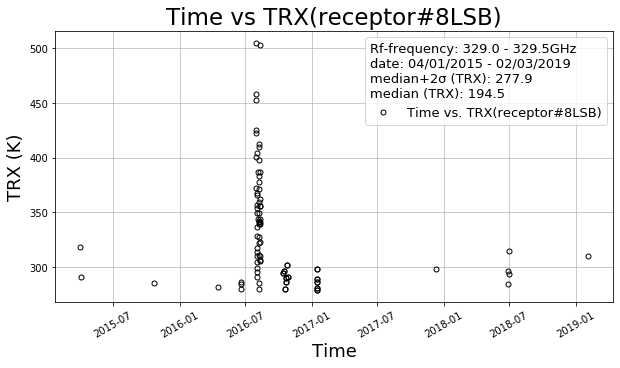

Figure H-40: Time vs. TRX, (receptor#8LSB), 329.0-329.5GHz


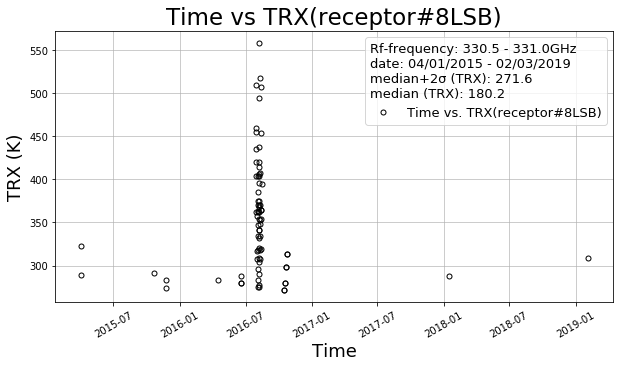

Figure H-41: Time vs. TRX, (receptor#8LSB), 330.5-331.0GHz


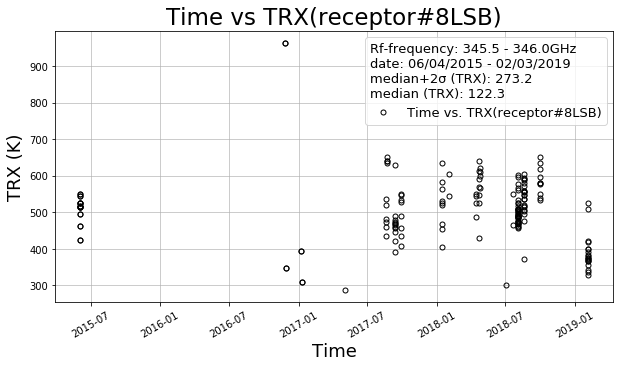

Figure H-42: Time vs. TRX, (receptor#8LSB), 345.5-346.0GHz


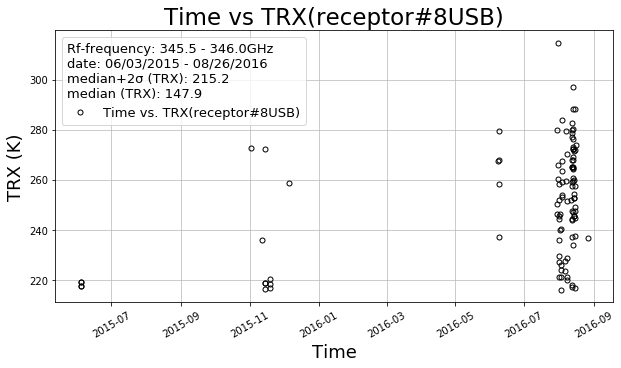

Figure H-43: Time vs. TRX, (receptor#8USB), 345.5-346.0GHz


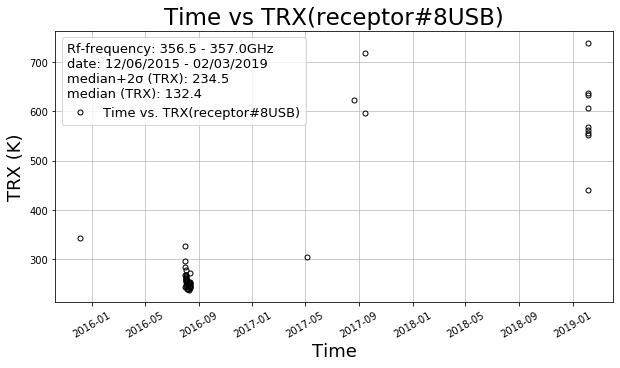

Figure H-44: Time vs. TRX, (receptor#8USB), 356.5-357.0GHz


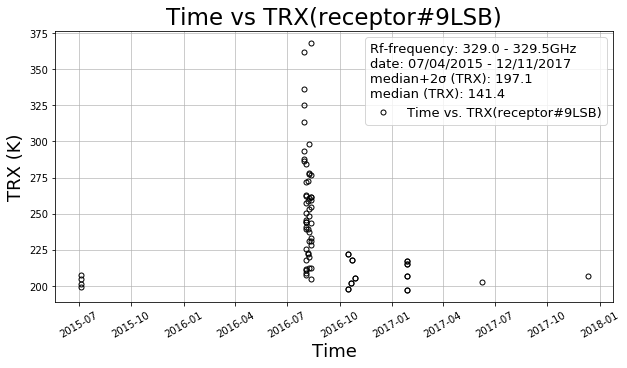

Figure H-45: Time vs. TRX, (receptor#9LSB), 329.0-329.5GHz


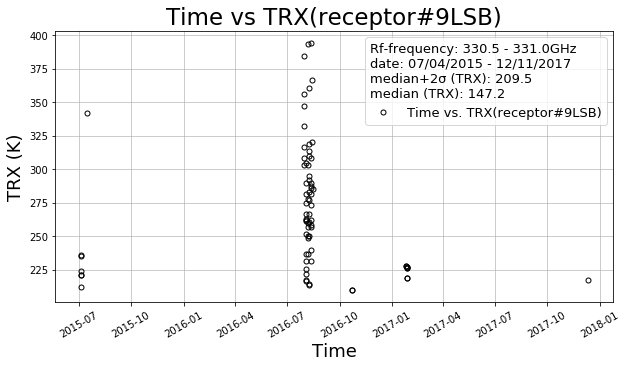

Figure H-46: Time vs. TRX, (receptor#9LSB), 330.5-331.0GHz


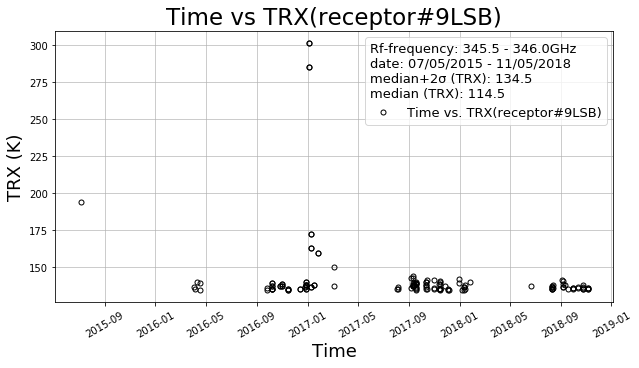

Figure H-47: Time vs. TRX, (receptor#9LSB), 345.5-346.0GHz


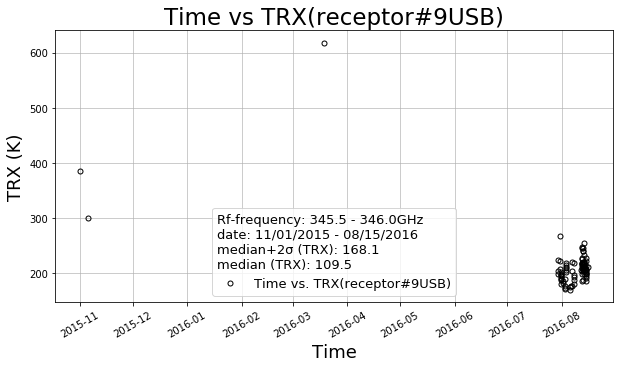

Figure H-48: Time vs. TRX, (receptor#9USB), 345.5-346.0GHz


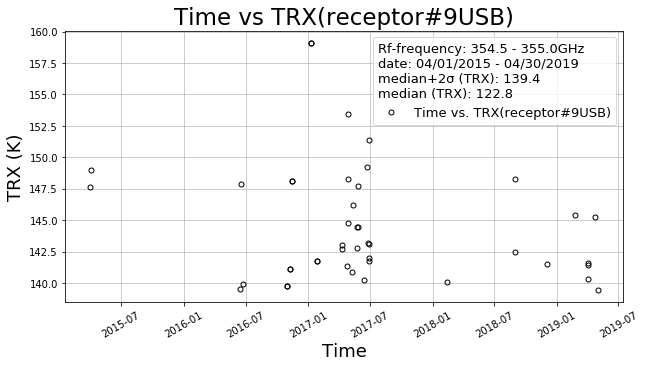

Figure H-49: Time vs. TRX, (receptor#9USB), 354.5-355.0GHz


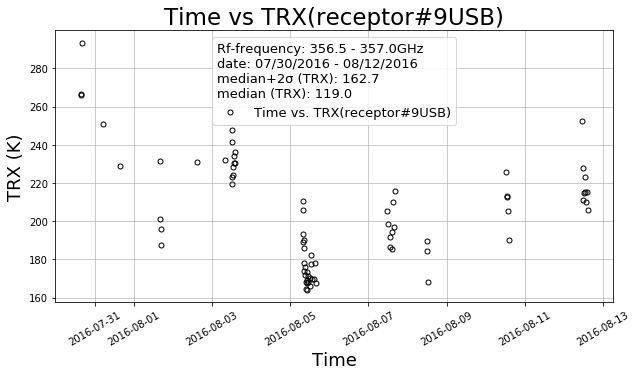

Figure H-50: Time vs. TRX, (receptor#9USB), 356.5-357.0GHz


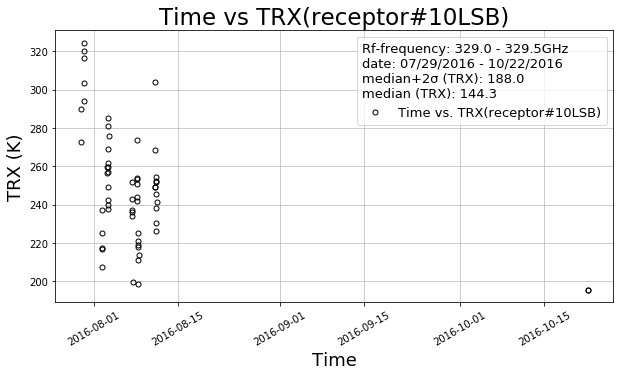

Figure H-51: Time vs. TRX, (receptor#10LSB), 329.0-329.5GHz


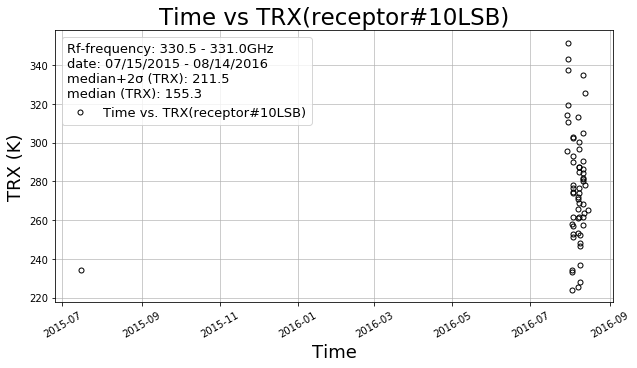

Figure H-52: Time vs. TRX, (receptor#10LSB), 330.5-331.0GHz


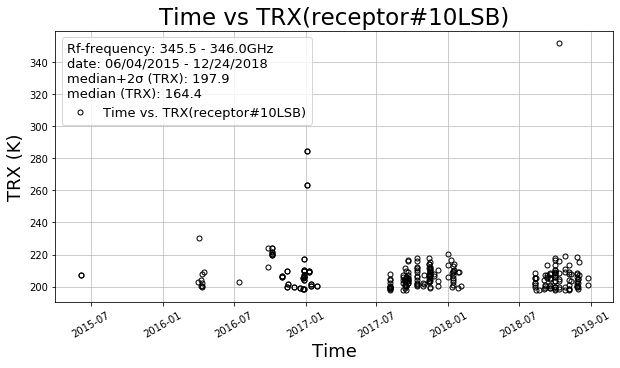

Figure H-53: Time vs. TRX, (receptor#10LSB), 345.5-346.0GHz


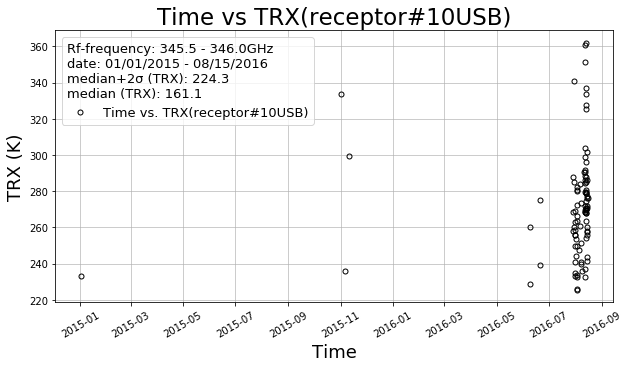

Figure H-54: Time vs. TRX, (receptor#10USB), 345.5-346.0GHz


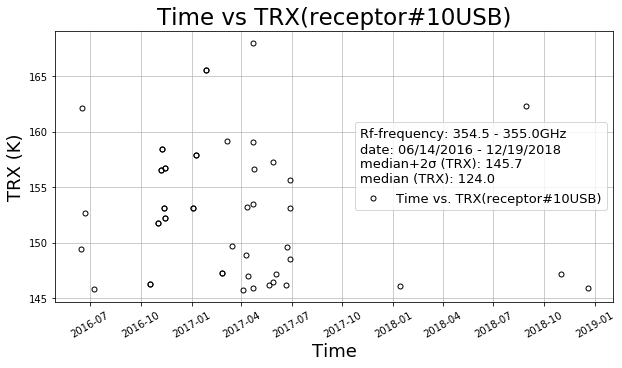

Figure H-55: Time vs. TRX, (receptor#10USB), 354.5-355.0GHz


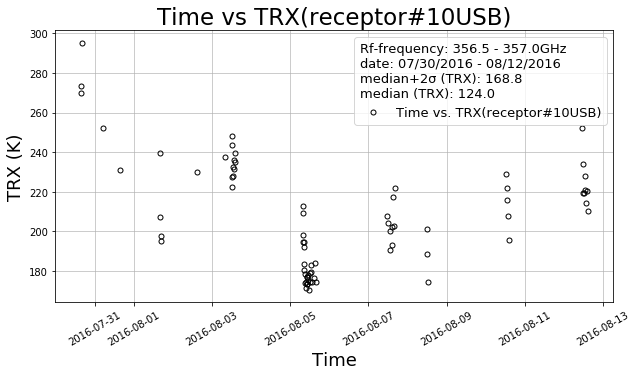

Figure H-56: Time vs. TRX, (receptor#10USB), 356.5-357.0GHz


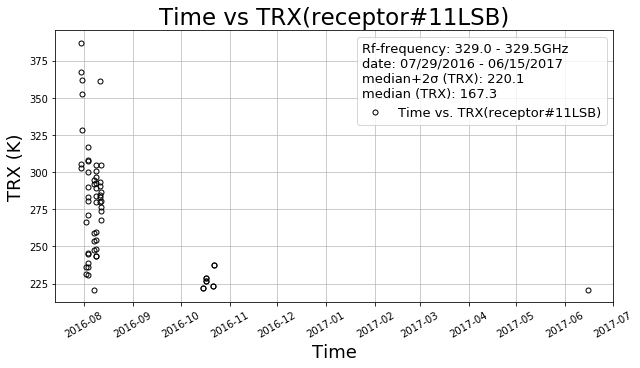

Figure H-57: Time vs. TRX, (receptor#11LSB), 329.0-329.5GHz


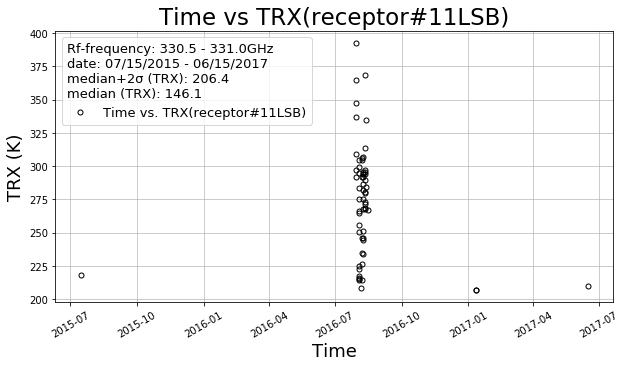

Figure H-58: Time vs. TRX, (receptor#11LSB), 330.5-331.0GHz


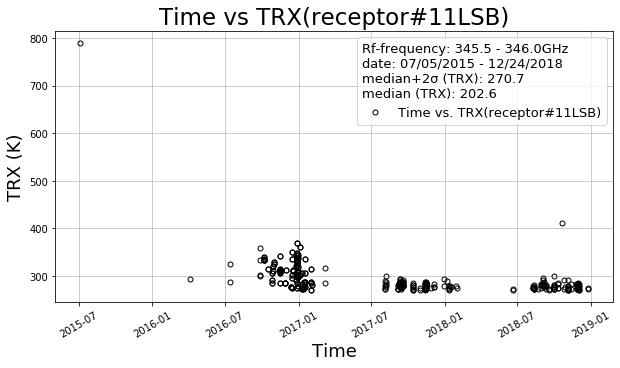

Figure H-59: Time vs. TRX, (receptor#11LSB), 345.5-346.0GHz


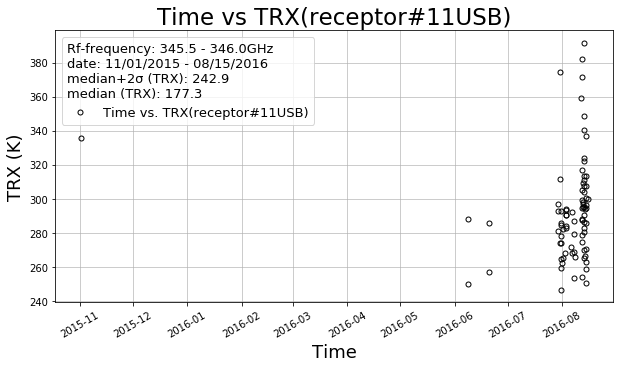

Figure H-60: Time vs. TRX, (receptor#11USB), 345.5-346.0GHz


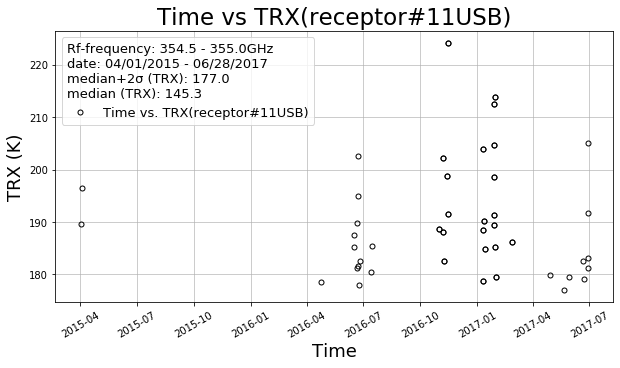

Figure H-61: Time vs. TRX, (receptor#11USB), 354.5-355.0GHz


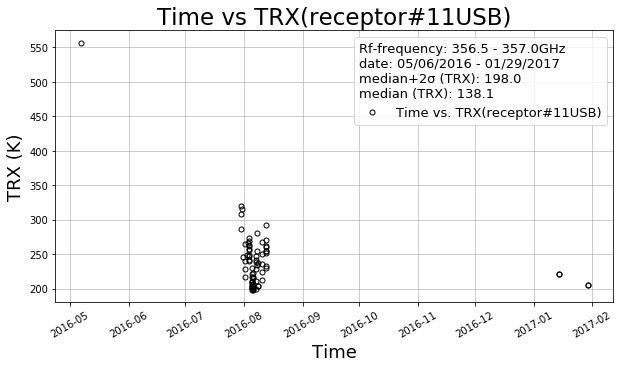

Figure H-62: Time vs. TRX, (receptor#11USB), 356.5-357.0GHz


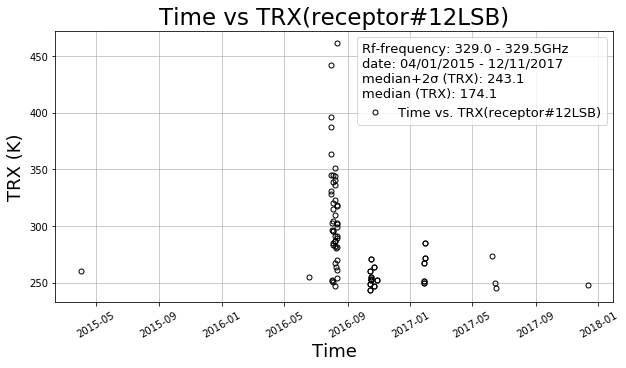

Figure H-63: Time vs. TRX, (receptor#12LSB), 329.0-329.5GHz


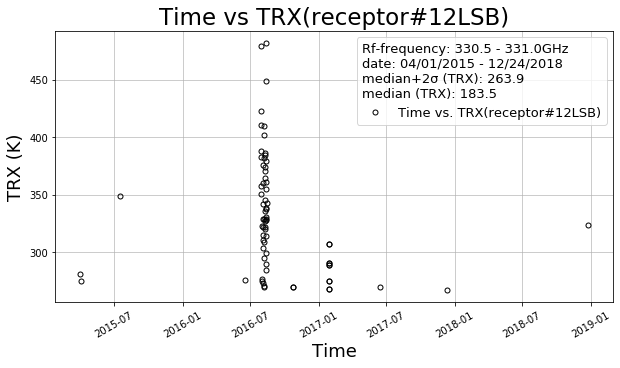

Figure H-64: Time vs. TRX, (receptor#12LSB), 330.5-331.0GHz


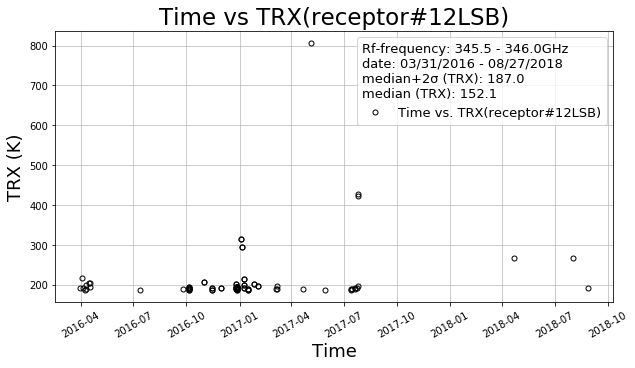

Figure H-65: Time vs. TRX, (receptor#12LSB), 345.5-346.0GHz


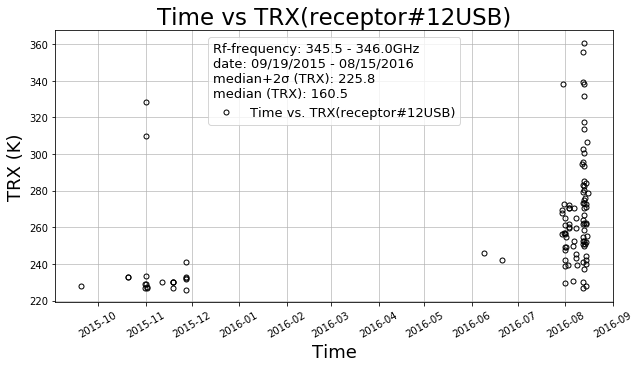

Figure H-66: Time vs. TRX, (receptor#12USB), 345.5-346.0GHz


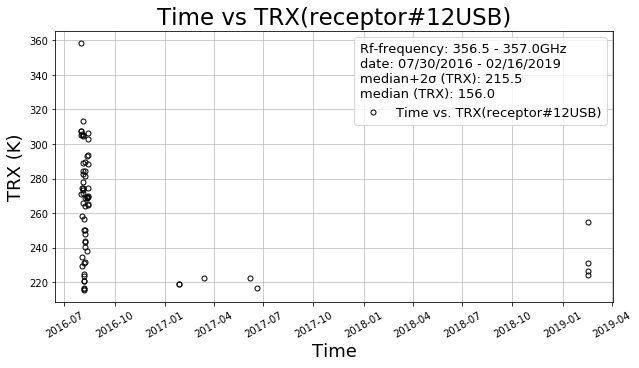

Figure H-67: Time vs. TRX, (receptor#12USB), 356.5-357.0GHz


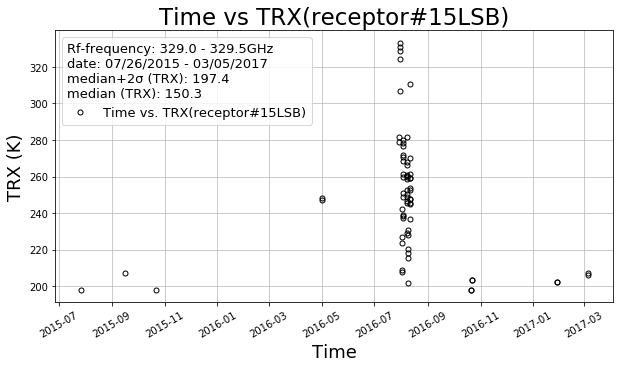

Figure H-68: Time vs. TRX, (receptor#15LSB), 329.0-329.5GHz


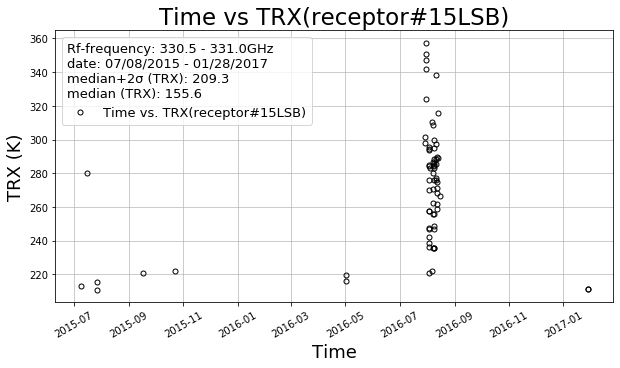

Figure H-69: Time vs. TRX, (receptor#15LSB), 330.5-331.0GHz


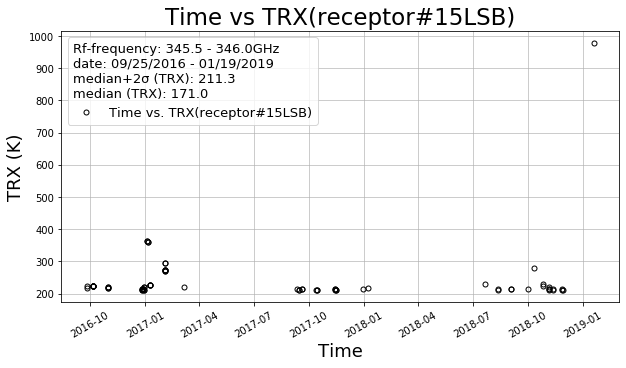

Figure H-70: Time vs. TRX, (receptor#15LSB), 345.5-346.0GHz


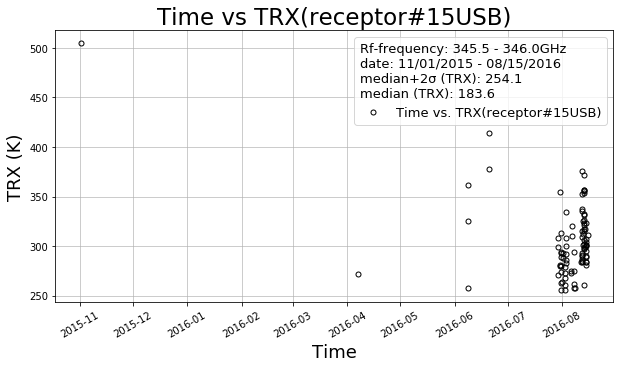

Figure H-71: Time vs. TRX, (receptor#15USB), 345.5-346.0GHz


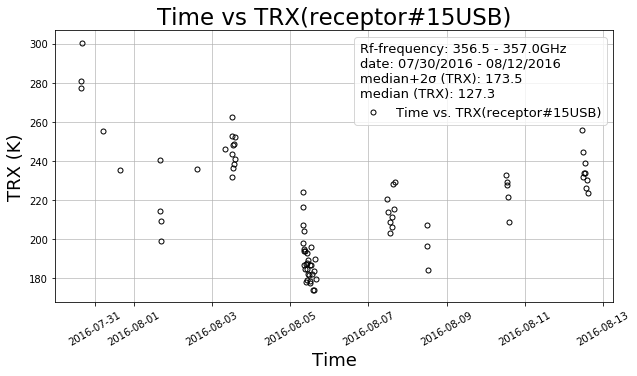

Figure H-72: Time vs. TRX, (receptor#15USB), 356.5-357.0GHz


In [208]:
all_s = ['LSB','USB']
num=0
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
    for s in all_s:
        txtfile = pd.read_csv(file, header = 0, sep=' ')
        txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile['receptor']==i)]
        if freq_type=='lofreq':
            start=326
            stop=373
            interval=95
        elif freq_type=='rffreq':
            start=324
            stop=378
            interval=109
        lins = np.linspace(start, stop, interval)        
        for x in lins:
            x_max= x+0.5
            trx = txtfile2['trx'][(x<=txtfile2[freq_type])&(txtfile2[freq_type]<x_max)]
            a=trx.count()
            if a > 2:
                stdev= st.stdev(trx)
                median=round(st.median(trx), 1)
                range_max= round(median+stdev,1)
                range_min= round(median-stdev,1)
                two_sigma= round(median+(stdev*2),1)                
            if (a > 850):                
                txtfile3= txtfile[(txtfile['receptor']==i)&(txtfile['sideband']==s)
                                  &(txtfile[freq_type]>x)&(txtfile[freq_type]<=x_max)]
                t_min=two_sigma
                txtfile4= txtfile3[(txtfile3['trx']>t_min)]
                
                
                if txtfile4['utc'].count()>30:
                    txtfile4['utc'] = pd.to_datetime(txtfile4['utc'], format='%Y-%m-%d %H:%M:%S.%f')
                    d_min=txtfile4['utc'].min()
                    d_max=txtfile4['utc'].max()
                    
                    fig, ax1 = plt.subplots(figsize=(10,5))
                    ax1.plot_date(txtfile4['utc'], txtfile4['trx'], label='Time vs. TRX'+'(receptor#'+str(i)+s+')'
                                  ,marker='o', markersize=5, markerfacecolor='none', markeredgecolor='black')
                    plt.setp(ax1.get_xticklabels(),rotation=30)
                    ax1.grid(alpha=0.8)
                    ax1.set_xlabel('Time', fontsize = 18)
                    ax1.set_ylabel('TRX (K)', fontsize = 18)
                    ax1.set_title('Time vs TRX' + '(receptor#'+str(i)+s+')', fontsize=23)
                    legend1=ax1.legend(loc='best', title= freq_name+': ' + str(x) + ' - ' + str(x_max)
                                       + 'GHz' +'\n'+ 'date: '+str(d_min.strftime('%m/%d/%Y'))
                                       +' - '+str(d_max.strftime('%m/%d/%Y'))+'\n'+'median+2σ (TRX): '
                                       +str(t_min)+'\n'+'median (TRX): '+str(median), fancybox= True
                                       , fontsize=13)
                    legend1._legend_box.align='left'
                    plt.setp(legend1.get_title(),fontsize=13)
                    plt.setp(legend1,alpha=0.3)
                    plt.show()                    
                    print('Figure H-'+str(num)+': Time vs. TRX, (receptor#'+str(i)+s+'), '+str(x)+'-'+str(x_max)+'GHz')
                    num=num+1

## 10. Each receptor's relation of specific frequency range and high TRX in specific time range

The plots below describe the relation of specific frequency and high TRX in specific time range. In the plots below, high TRX is considered as TRX which is over two sigma range in Figure G. 

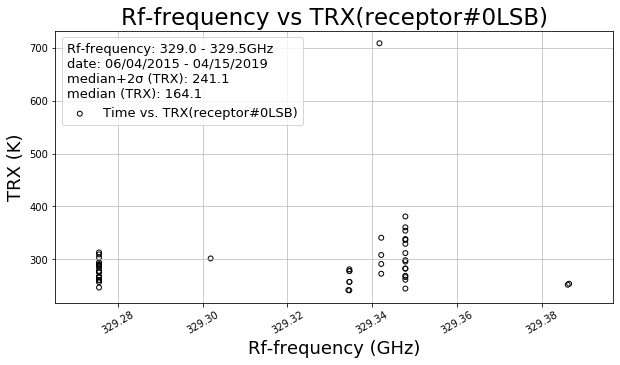

Figure I-0: Time vs. TRX, (receptor#0LSB), 329.0-329.5GHz


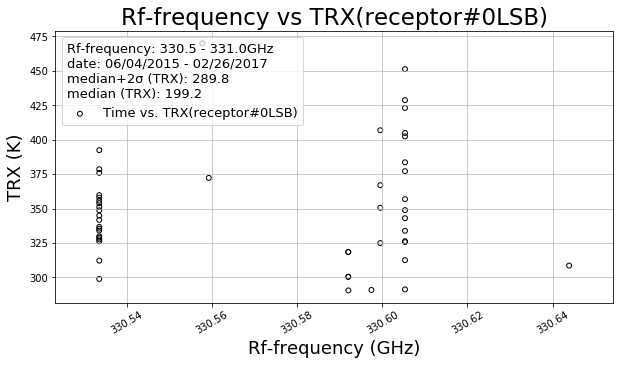

Figure I-1: Time vs. TRX, (receptor#0LSB), 330.5-331.0GHz


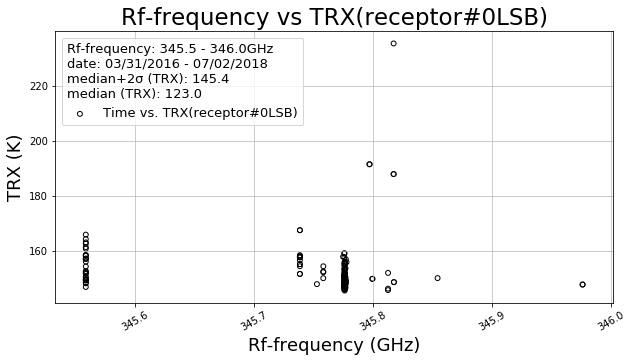

Figure I-2: Time vs. TRX, (receptor#0LSB), 345.5-346.0GHz


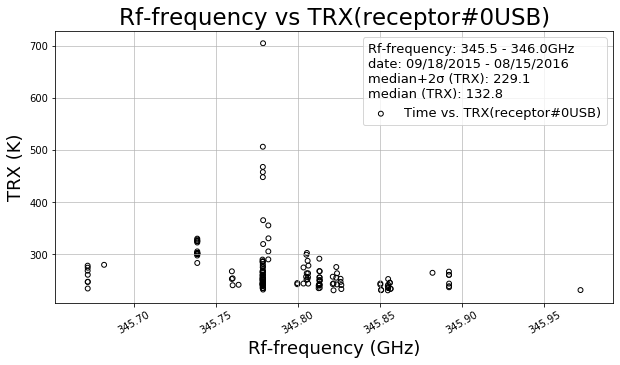

Figure I-3: Time vs. TRX, (receptor#0USB), 345.5-346.0GHz


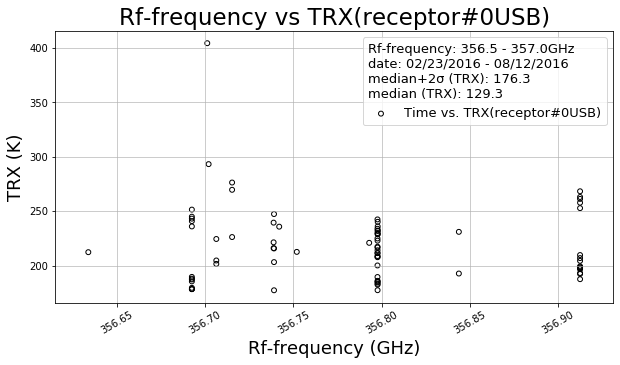

Figure I-4: Time vs. TRX, (receptor#0USB), 356.5-357.0GHz


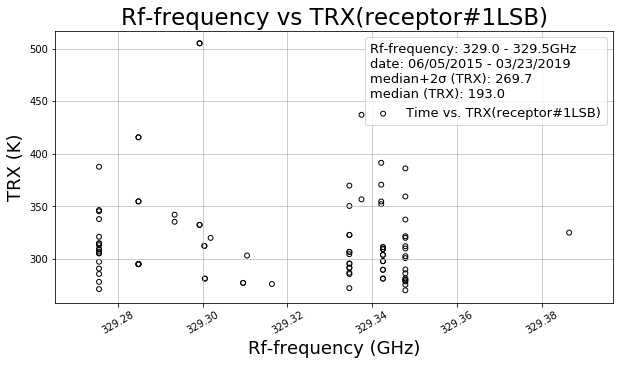

Figure I-5: Time vs. TRX, (receptor#1LSB), 329.0-329.5GHz


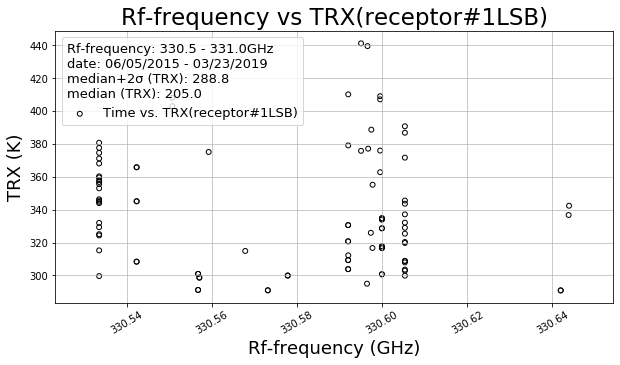

Figure I-6: Time vs. TRX, (receptor#1LSB), 330.5-331.0GHz


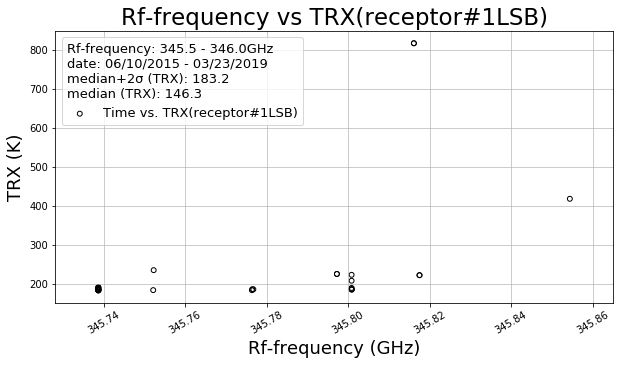

Figure I-7: Time vs. TRX, (receptor#1LSB), 345.5-346.0GHz


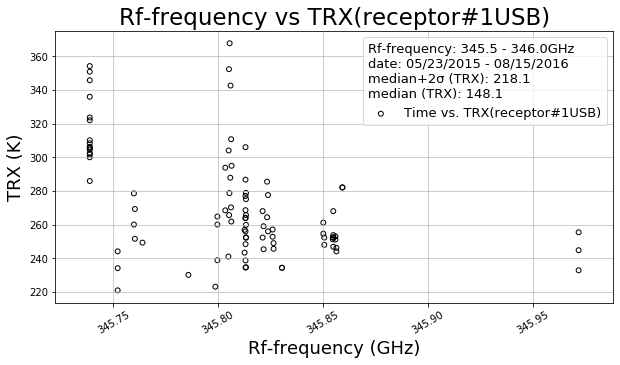

Figure I-8: Time vs. TRX, (receptor#1USB), 345.5-346.0GHz


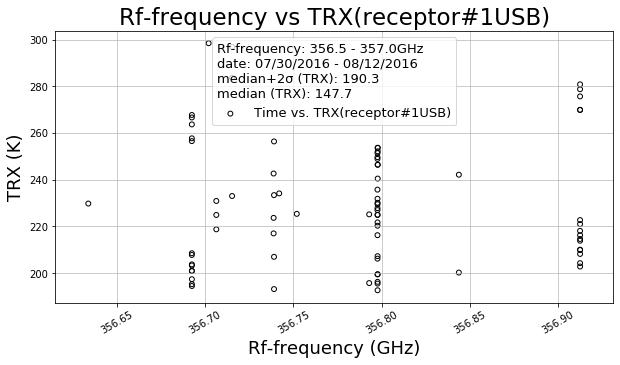

Figure I-9: Time vs. TRX, (receptor#1USB), 356.5-357.0GHz


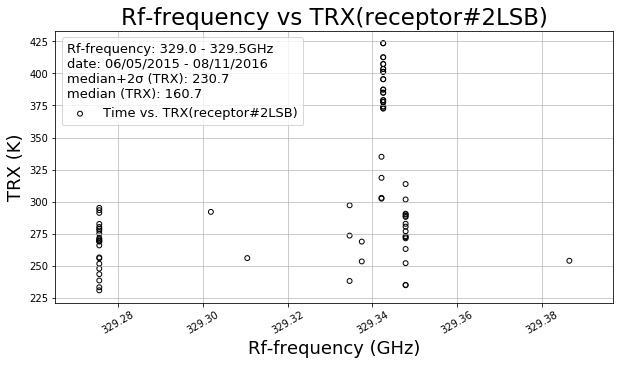

Figure I-10: Time vs. TRX, (receptor#2LSB), 329.0-329.5GHz


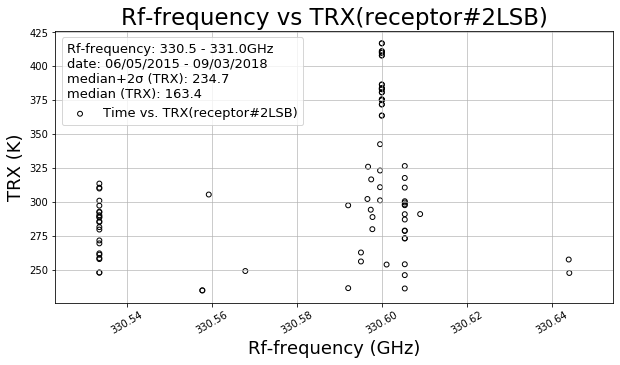

Figure I-11: Time vs. TRX, (receptor#2LSB), 330.5-331.0GHz


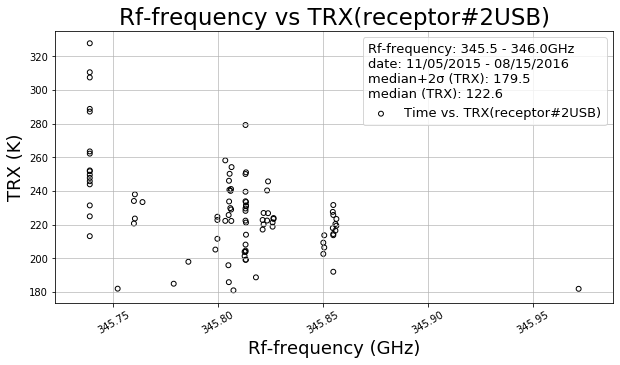

Figure I-12: Time vs. TRX, (receptor#2USB), 345.5-346.0GHz


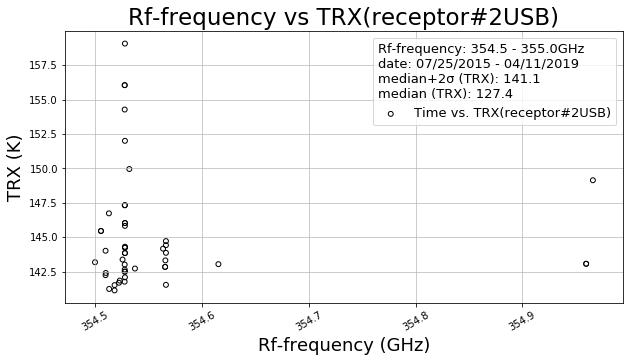

Figure I-13: Time vs. TRX, (receptor#2USB), 354.5-355.0GHz


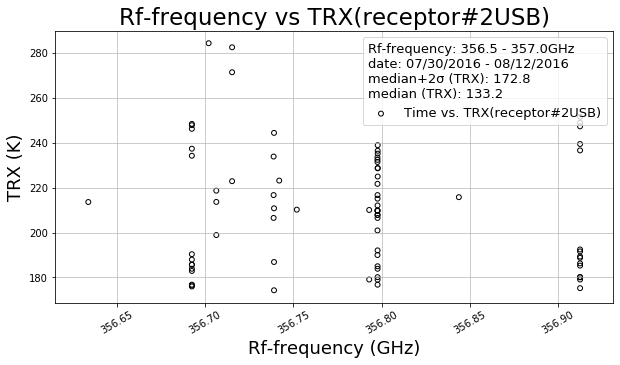

Figure I-14: Time vs. TRX, (receptor#2USB), 356.5-357.0GHz


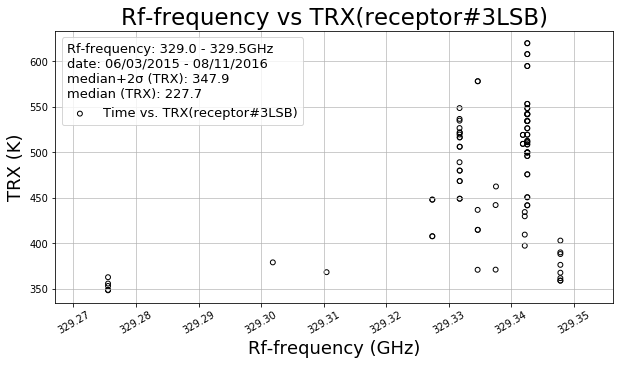

Figure I-15: Time vs. TRX, (receptor#3LSB), 329.0-329.5GHz


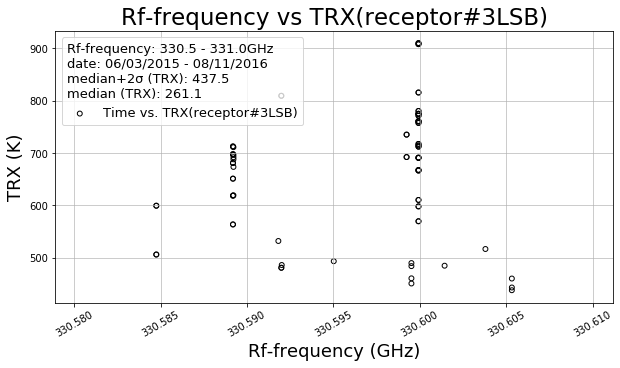

Figure I-16: Time vs. TRX, (receptor#3LSB), 330.5-331.0GHz


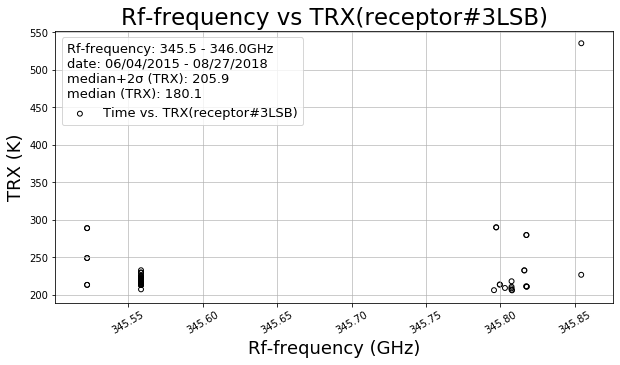

Figure I-17: Time vs. TRX, (receptor#3LSB), 345.5-346.0GHz


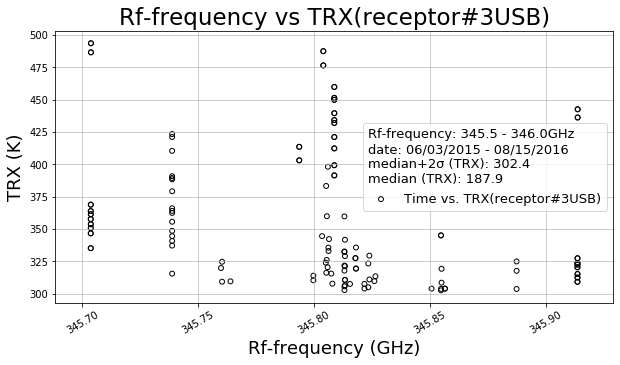

Figure I-18: Time vs. TRX, (receptor#3USB), 345.5-346.0GHz


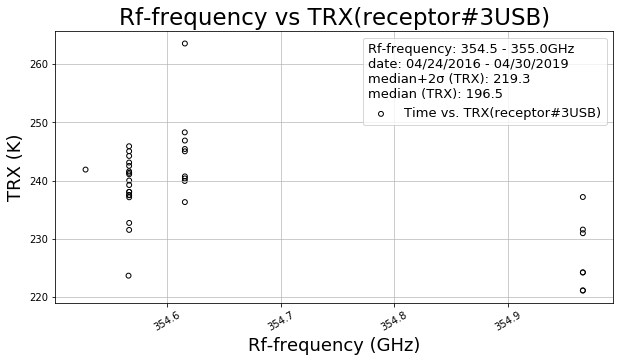

Figure I-19: Time vs. TRX, (receptor#3USB), 354.5-355.0GHz


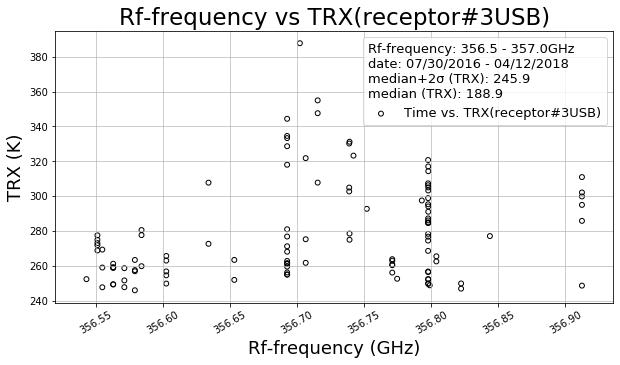

Figure I-20: Time vs. TRX, (receptor#3USB), 356.5-357.0GHz


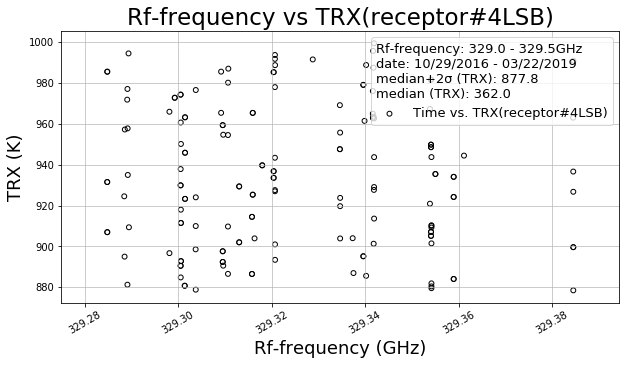

Figure I-21: Time vs. TRX, (receptor#4LSB), 329.0-329.5GHz


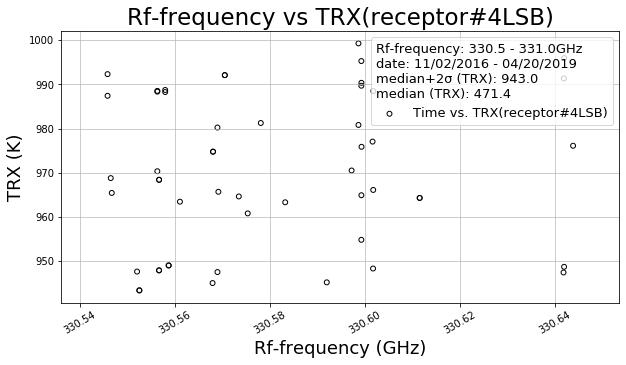

Figure I-22: Time vs. TRX, (receptor#4LSB), 330.5-331.0GHz


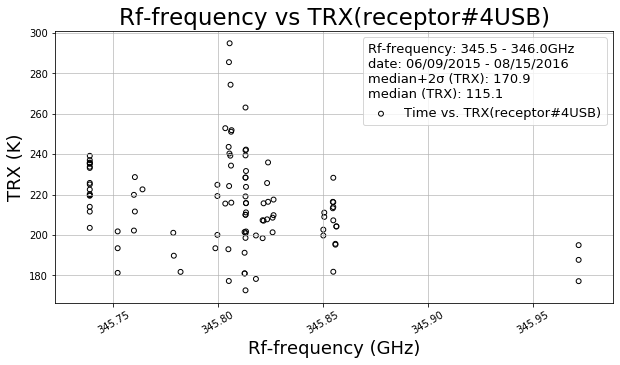

Figure I-23: Time vs. TRX, (receptor#4USB), 345.5-346.0GHz


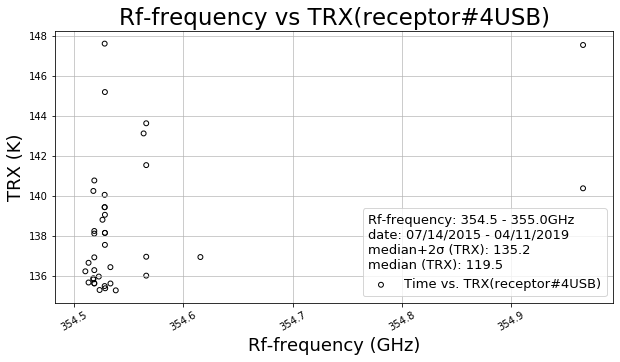

Figure I-24: Time vs. TRX, (receptor#4USB), 354.5-355.0GHz


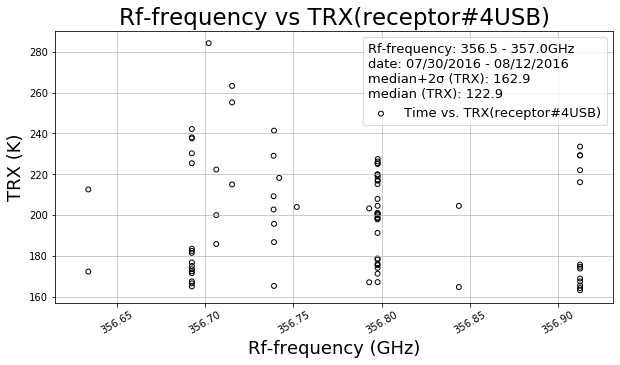

Figure I-25: Time vs. TRX, (receptor#4USB), 356.5-357.0GHz


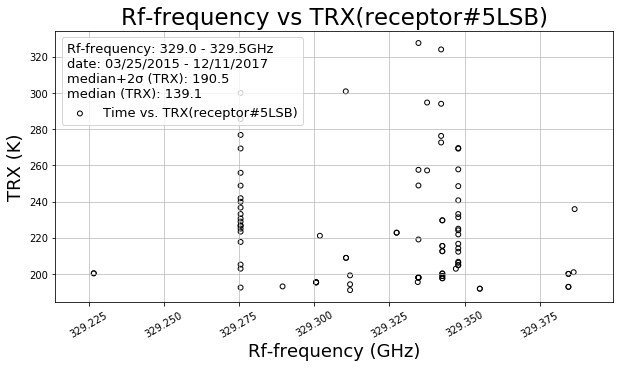

Figure I-26: Time vs. TRX, (receptor#5LSB), 329.0-329.5GHz


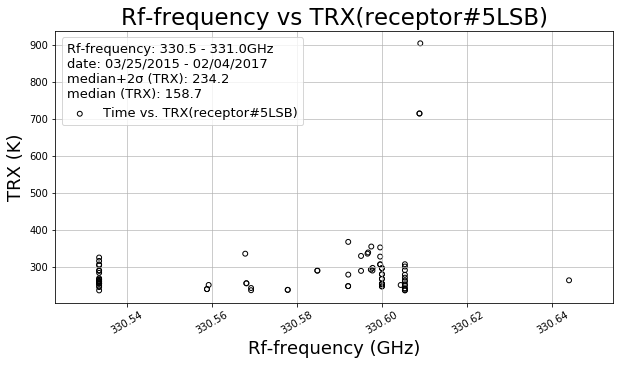

Figure I-27: Time vs. TRX, (receptor#5LSB), 330.5-331.0GHz


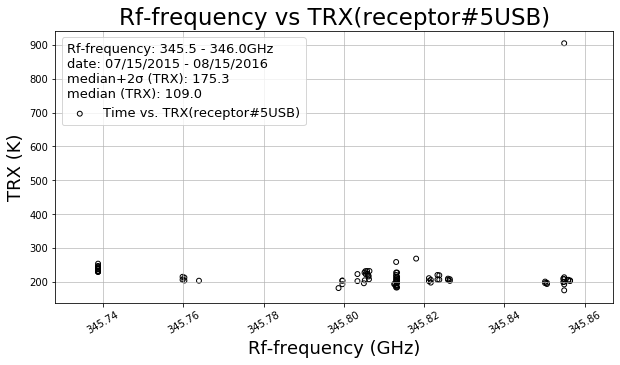

Figure I-28: Time vs. TRX, (receptor#5USB), 345.5-346.0GHz


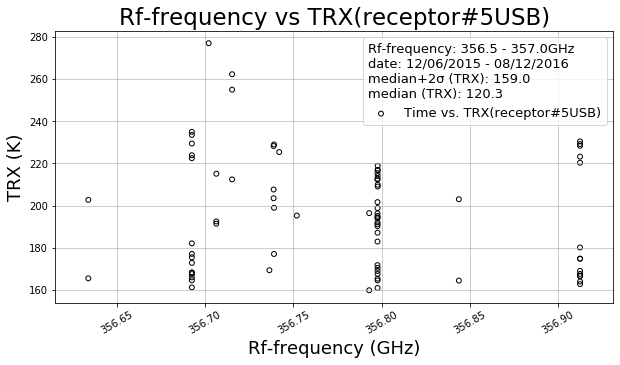

Figure I-29: Time vs. TRX, (receptor#5USB), 356.5-357.0GHz


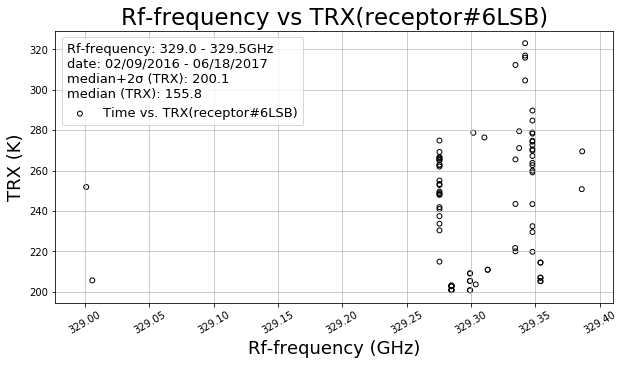

Figure I-30: Time vs. TRX, (receptor#6LSB), 329.0-329.5GHz


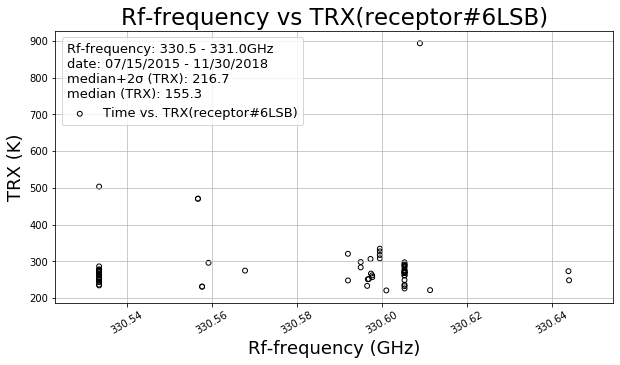

Figure I-31: Time vs. TRX, (receptor#6LSB), 330.5-331.0GHz


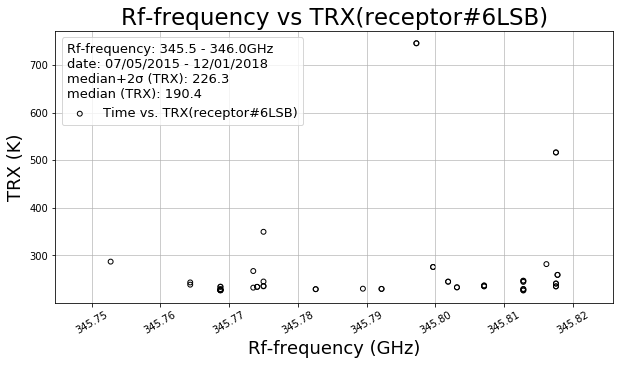

Figure I-32: Time vs. TRX, (receptor#6LSB), 345.5-346.0GHz


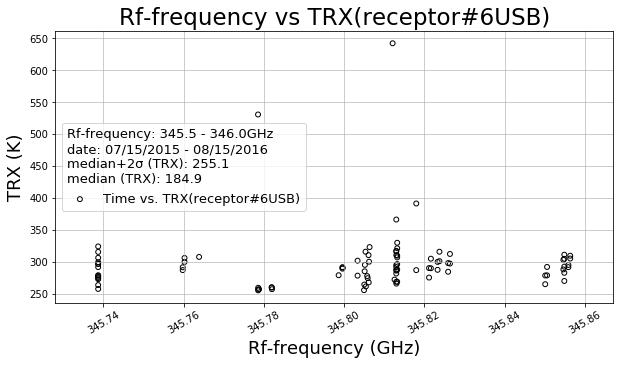

Figure I-33: Time vs. TRX, (receptor#6USB), 345.5-346.0GHz


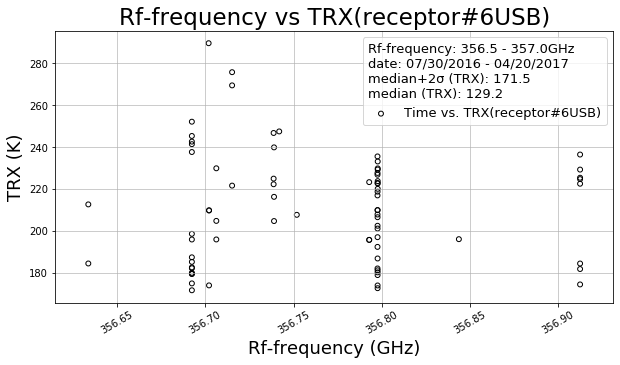

Figure I-34: Time vs. TRX, (receptor#6USB), 356.5-357.0GHz


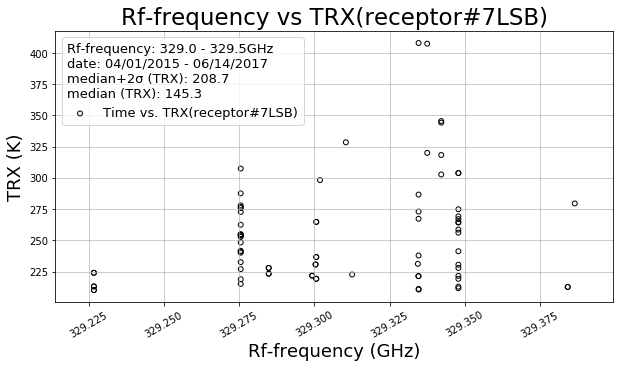

Figure I-35: Time vs. TRX, (receptor#7LSB), 329.0-329.5GHz


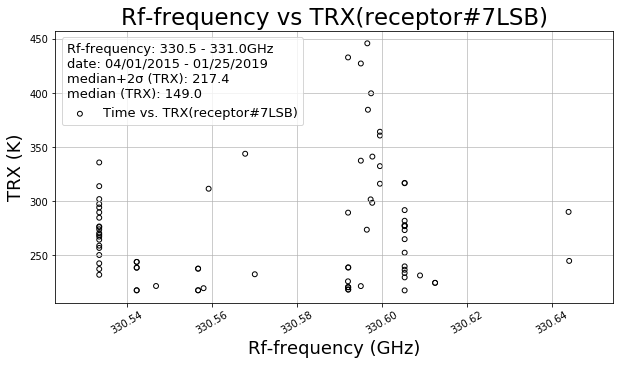

Figure I-36: Time vs. TRX, (receptor#7LSB), 330.5-331.0GHz


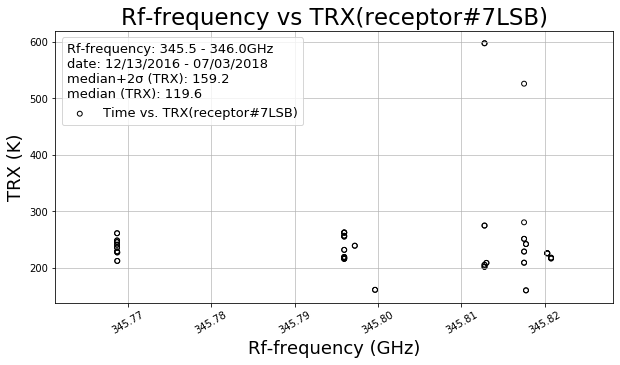

Figure I-37: Time vs. TRX, (receptor#7LSB), 345.5-346.0GHz


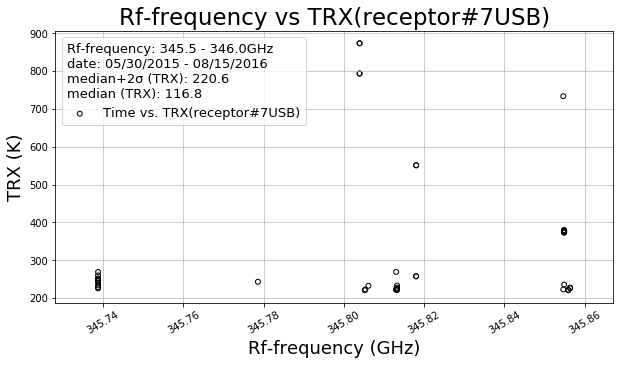

Figure I-38: Time vs. TRX, (receptor#7USB), 345.5-346.0GHz


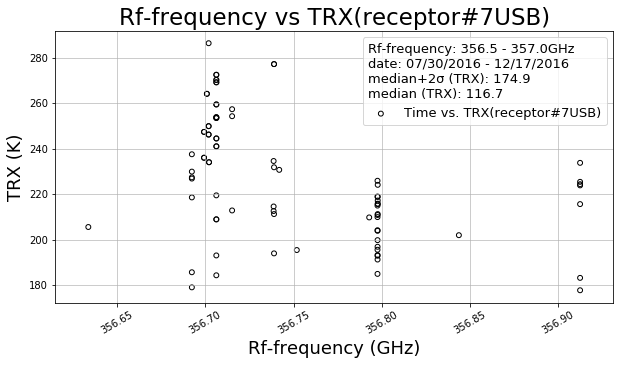

Figure I-39: Time vs. TRX, (receptor#7USB), 356.5-357.0GHz


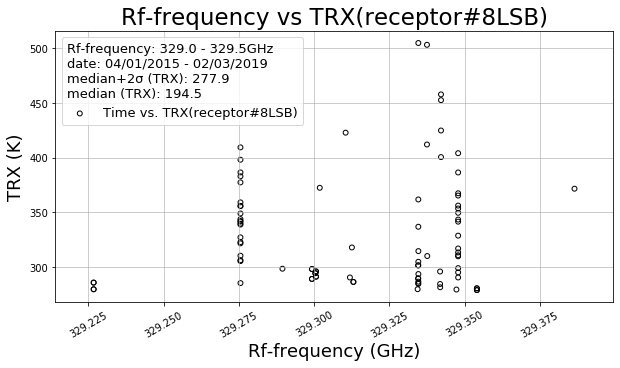

Figure I-40: Time vs. TRX, (receptor#8LSB), 329.0-329.5GHz


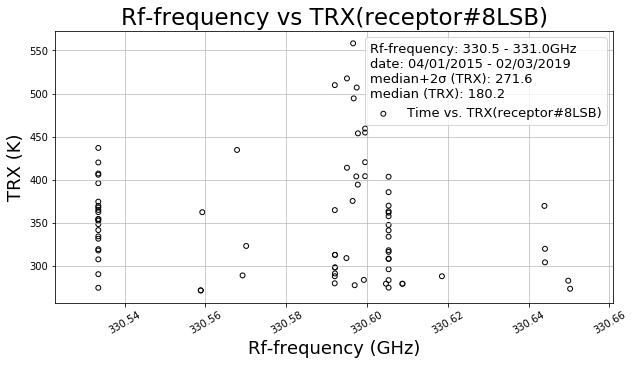

Figure I-41: Time vs. TRX, (receptor#8LSB), 330.5-331.0GHz


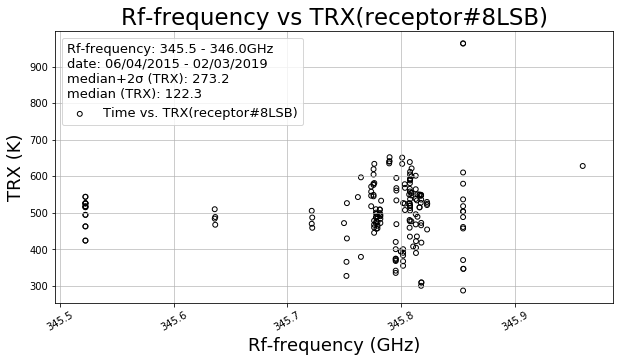

Figure I-42: Time vs. TRX, (receptor#8LSB), 345.5-346.0GHz


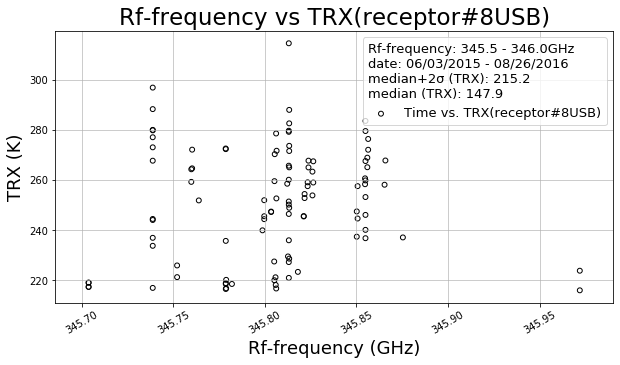

Figure I-43: Time vs. TRX, (receptor#8USB), 345.5-346.0GHz


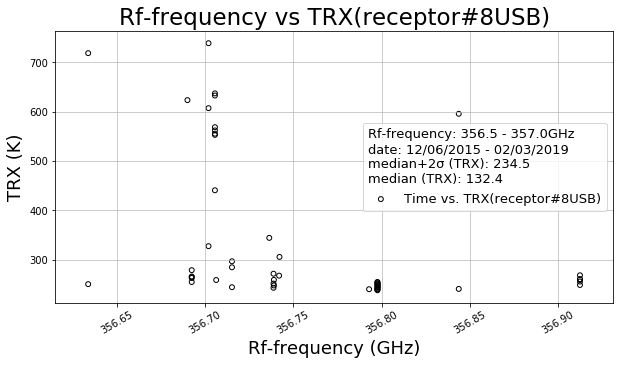

Figure I-44: Time vs. TRX, (receptor#8USB), 356.5-357.0GHz


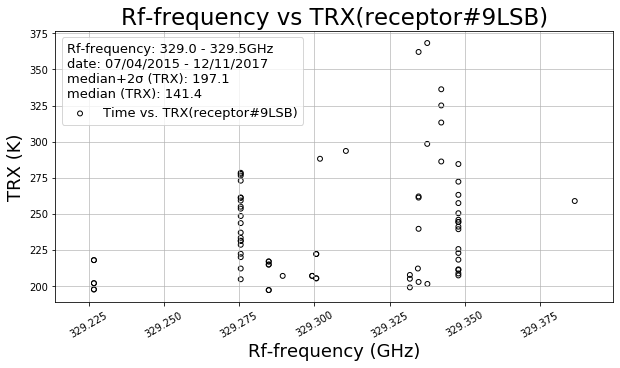

Figure I-45: Time vs. TRX, (receptor#9LSB), 329.0-329.5GHz


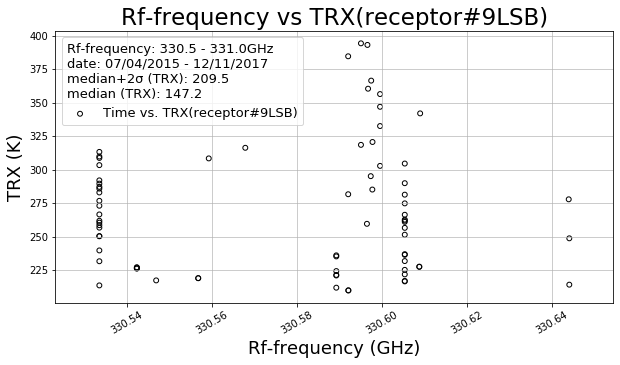

Figure I-46: Time vs. TRX, (receptor#9LSB), 330.5-331.0GHz


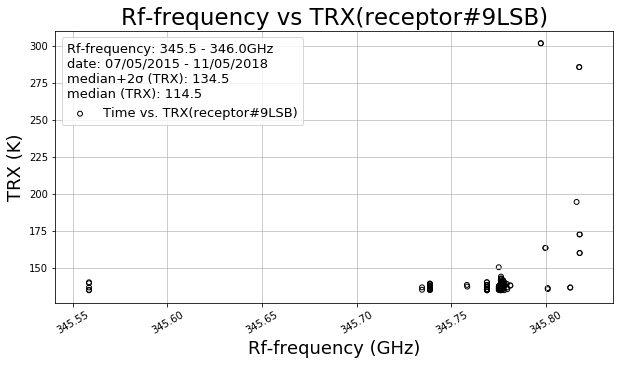

Figure I-47: Time vs. TRX, (receptor#9LSB), 345.5-346.0GHz


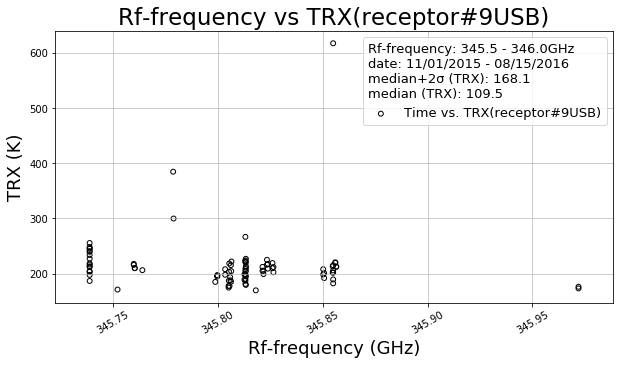

Figure I-48: Time vs. TRX, (receptor#9USB), 345.5-346.0GHz


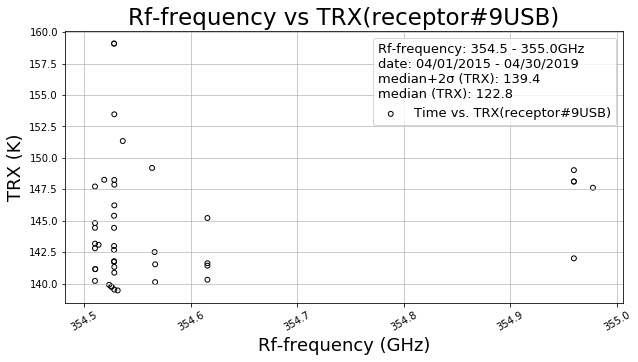

Figure I-49: Time vs. TRX, (receptor#9USB), 354.5-355.0GHz


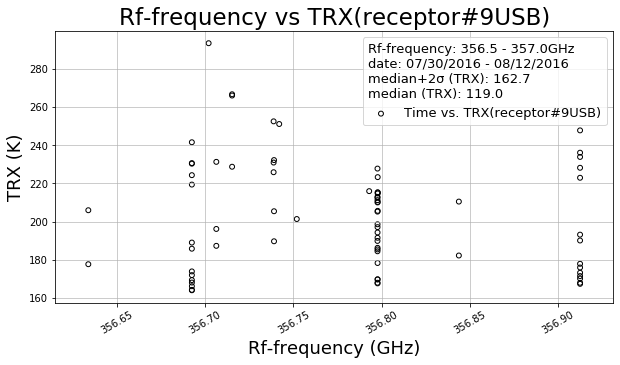

Figure I-50: Time vs. TRX, (receptor#9USB), 356.5-357.0GHz


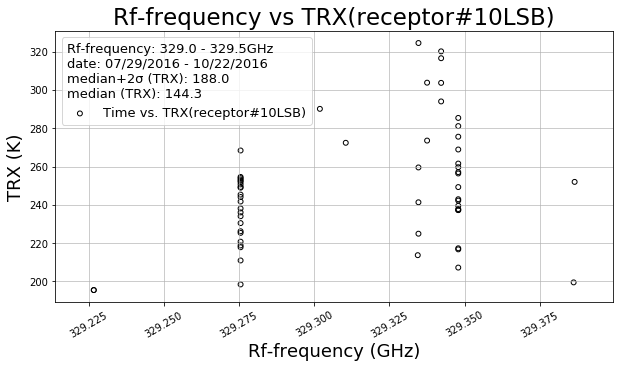

Figure I-51: Time vs. TRX, (receptor#10LSB), 329.0-329.5GHz


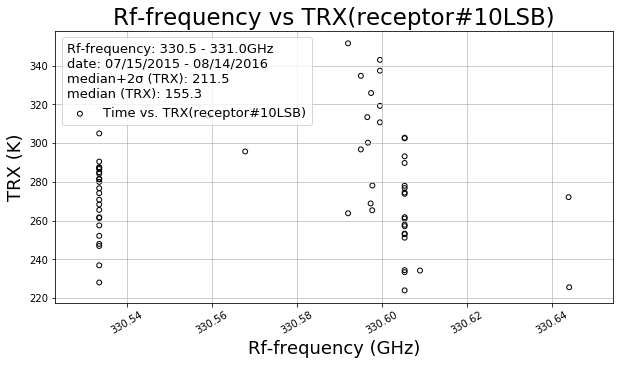

Figure I-52: Time vs. TRX, (receptor#10LSB), 330.5-331.0GHz


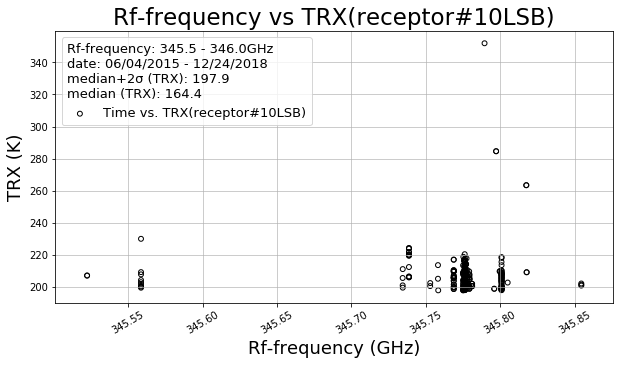

Figure I-53: Time vs. TRX, (receptor#10LSB), 345.5-346.0GHz


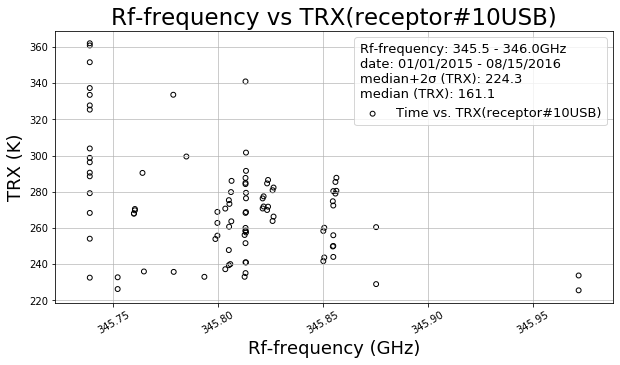

Figure I-54: Time vs. TRX, (receptor#10USB), 345.5-346.0GHz


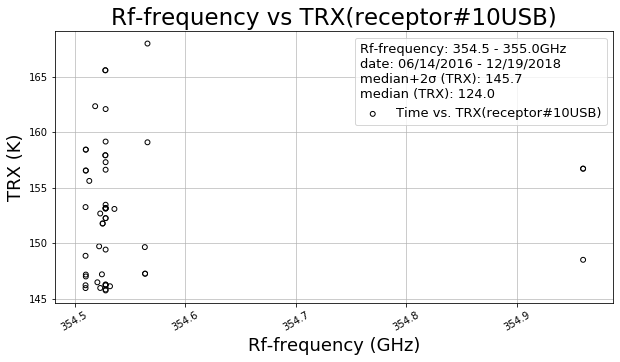

Figure I-55: Time vs. TRX, (receptor#10USB), 354.5-355.0GHz


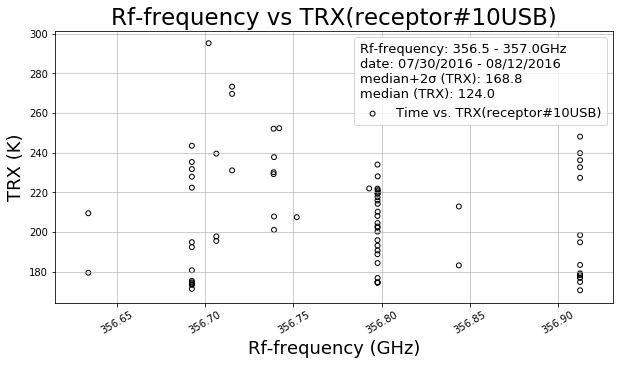

Figure I-56: Time vs. TRX, (receptor#10USB), 356.5-357.0GHz


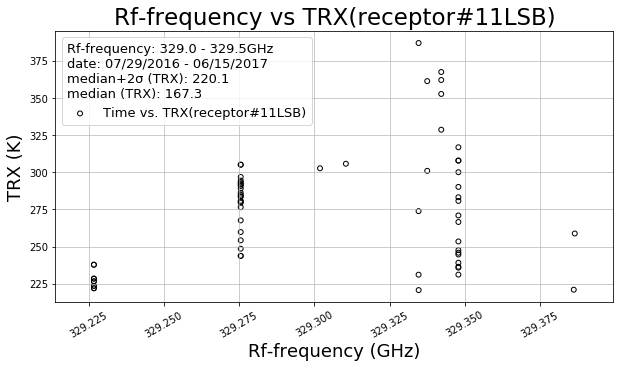

Figure I-57: Time vs. TRX, (receptor#11LSB), 329.0-329.5GHz


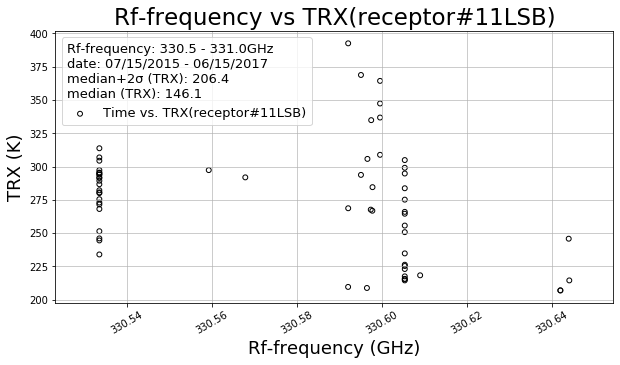

Figure I-58: Time vs. TRX, (receptor#11LSB), 330.5-331.0GHz


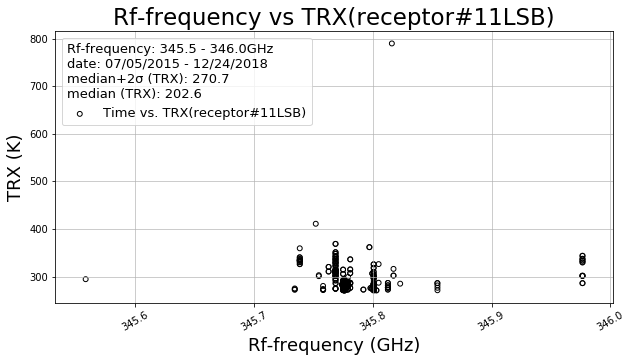

Figure I-59: Time vs. TRX, (receptor#11LSB), 345.5-346.0GHz


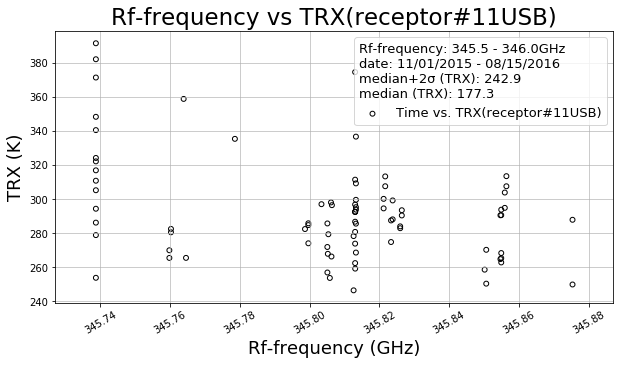

Figure I-60: Time vs. TRX, (receptor#11USB), 345.5-346.0GHz


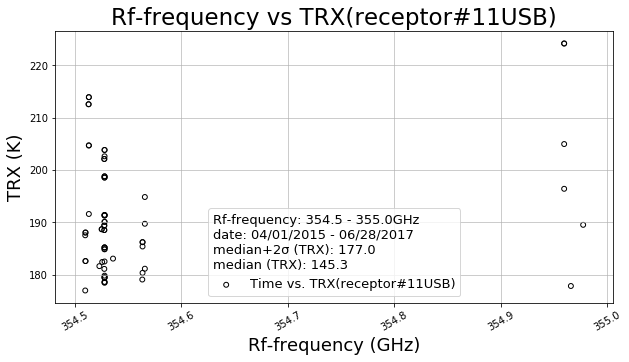

Figure I-61: Time vs. TRX, (receptor#11USB), 354.5-355.0GHz


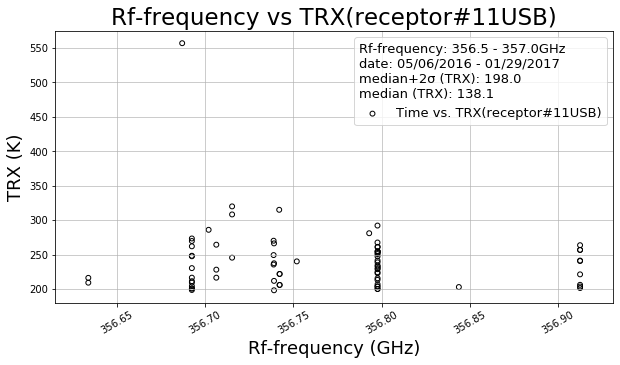

Figure I-62: Time vs. TRX, (receptor#11USB), 356.5-357.0GHz


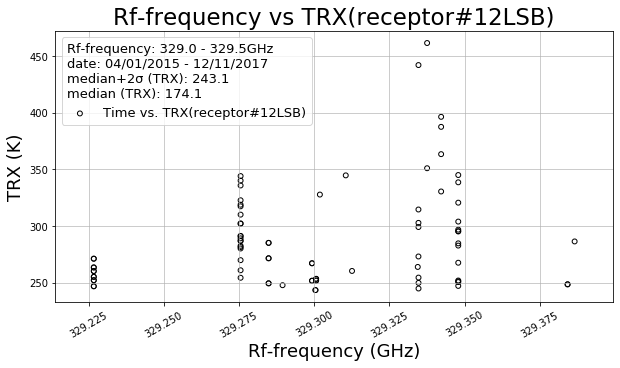

Figure I-63: Time vs. TRX, (receptor#12LSB), 329.0-329.5GHz


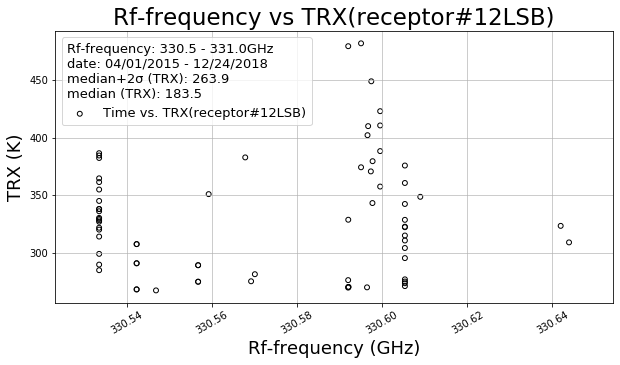

Figure I-64: Time vs. TRX, (receptor#12LSB), 330.5-331.0GHz


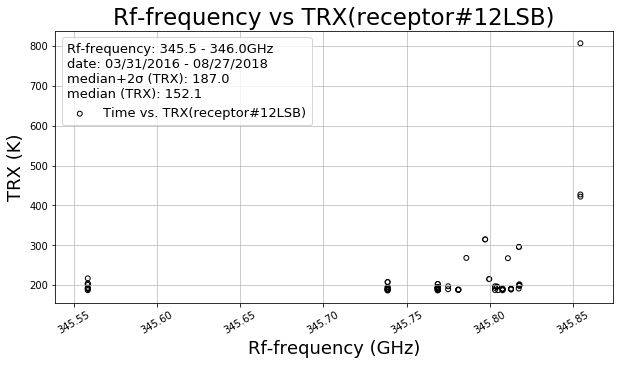

Figure I-65: Time vs. TRX, (receptor#12LSB), 345.5-346.0GHz


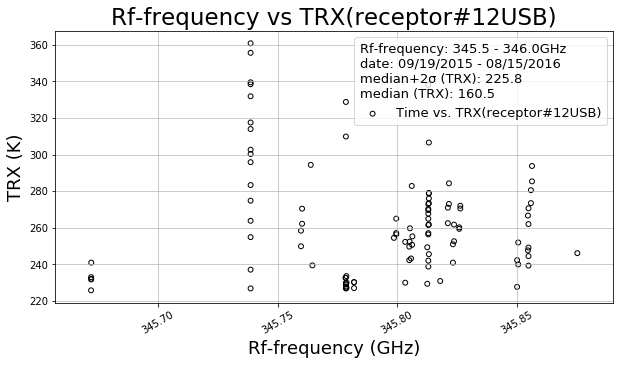

Figure I-66: Time vs. TRX, (receptor#12USB), 345.5-346.0GHz


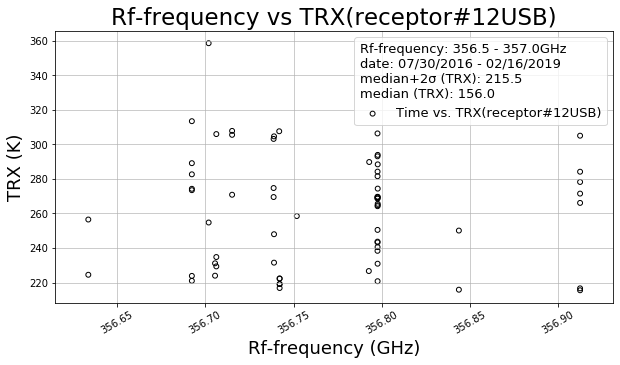

Figure I-67: Time vs. TRX, (receptor#12USB), 356.5-357.0GHz


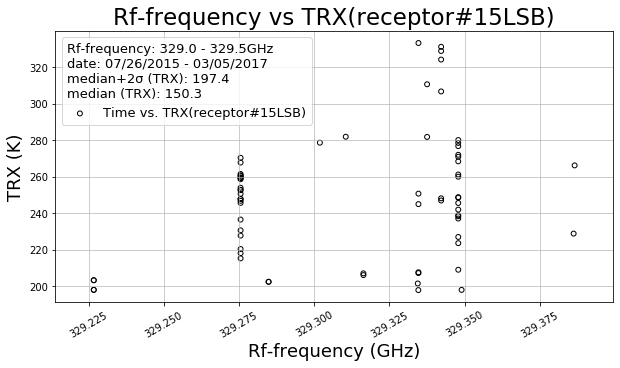

Figure I-68: Time vs. TRX, (receptor#15LSB), 329.0-329.5GHz


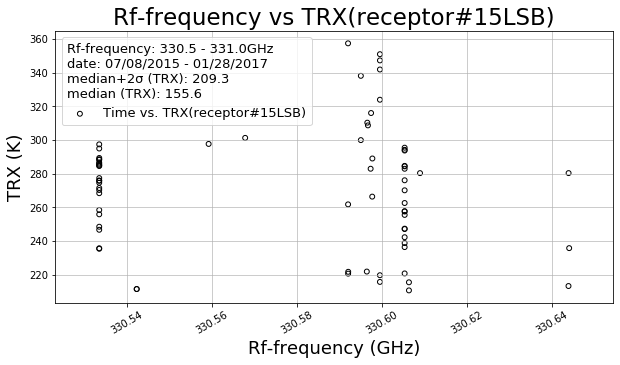

Figure I-69: Time vs. TRX, (receptor#15LSB), 330.5-331.0GHz


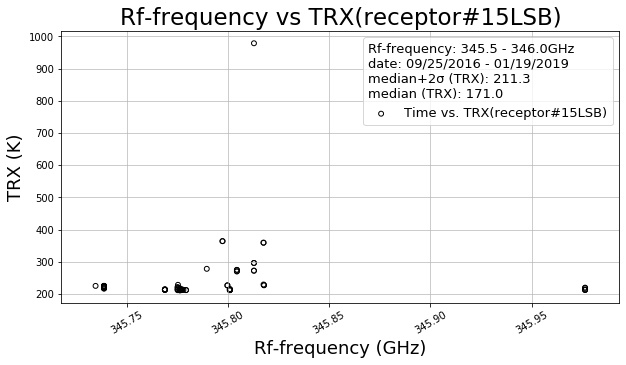

Figure I-70: Time vs. TRX, (receptor#15LSB), 345.5-346.0GHz


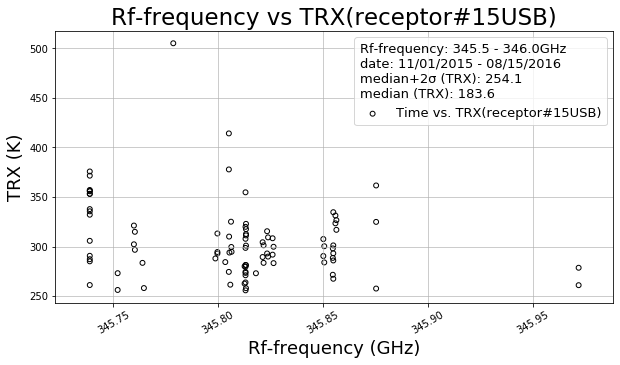

Figure I-71: Time vs. TRX, (receptor#15USB), 345.5-346.0GHz


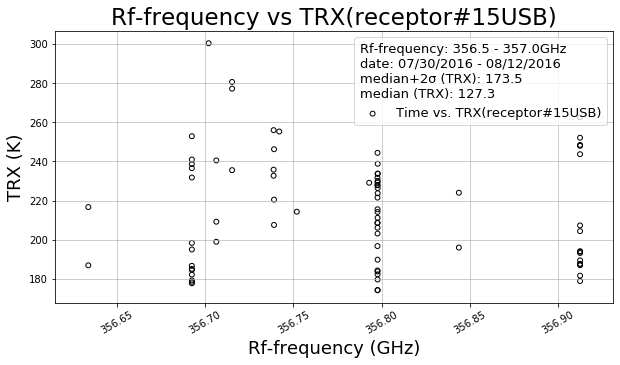

Figure I-72: Time vs. TRX, (receptor#15USB), 356.5-357.0GHz


In [209]:
all_s = ['LSB','USB']
num=0
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,15]:
    for s in all_s:
        txtfile = pd.read_csv(file, header = 0, sep=' ')
        txtfile2=txtfile[(txtfile['sideband']==s)&(txtfile['receptor']==i)]
        if freq_type=='lofreq':
            start=326
            stop=373
            interval=95
        elif freq_type=='rffreq':
            start=324
            stop=378
            interval=109
        lins = np.linspace(start, stop, interval)        
        for x in lins:
            x_max= x+0.5
            trx = txtfile2['trx'][(x<=txtfile2[freq_type])&(txtfile2[freq_type]<x_max)]
            a=trx.count()
            if a > 2:
                stdev= st.stdev(trx)
                median=round(st.median(trx), 1)
                range_max= round(median+stdev,1)
                range_min= round(median-stdev,1)
                two_sigma= round(median+(stdev*2),1)                
            if (a > 850):                
                txtfile3= txtfile[(txtfile['receptor']==i)
                                  &(txtfile['sideband']==s)&(txtfile[freq_type]>x)&(txtfile[freq_type]<=x_max)]
                t_min=two_sigma
                txtfile4= txtfile3[(txtfile3['trx']>t_min)]                
                if txtfile4['utc'].count()>30:
                    txtfile4['utc'] = pd.to_datetime(txtfile4['utc'], format='%Y-%m-%d %H:%M:%S.%f')
                    d_min=txtfile4['utc'].min()
                    d_max=txtfile4['utc'].max()                   
                    fig, ax2 = plt.subplots(figsize=(10,5))
                    ax2.scatter(txtfile4[freq_type], txtfile4['trx'], label='Time vs. TRX'+'(receptor#'+str(i)+s+')'
                                ,marker='o', s=24, facecolor='none', edgecolor='black')
                    plt.setp(ax2.get_xticklabels(),rotation=30)
                    ax2.grid(alpha=0.8)
                    ax2.set_xlabel(freq_name+' (GHz)', fontsize = 18)
                    ax2.set_ylabel('TRX (K)', fontsize = 18)
                    ax2.set_title(freq_name+' vs TRX' + '(receptor#'+str(i)+s+')', fontsize=23)
                    legend2=ax2.legend(loc='best', title= freq_name+': ' + str(x) + ' - ' + str(x_max) 
                                       + 'GHz' +'\n'+ 'date: '+str(d_min.strftime('%m/%d/%Y'))+' - '
                                       +str(d_max.strftime('%m/%d/%Y'))+'\n'+'median+2σ (TRX): '+str(t_min)
                                       +'\n'+'median (TRX): '+str(median), fancybox= True, fontsize=13)
                    legend2._legend_box.align='left'
                    plt.setp(legend2.get_title(),fontsize=13)
                    plt.setp(legend2,alpha=0.3)
                    ax2.get_xaxis().get_major_formatter().set_useOffset(False)                    
                    plt.show()
                    print('Figure I-'+str(num)+': Time vs. TRX, (receptor#'+str(i)+s+'), '+str(x)+'-'+str(x_max)+'GHz')
                    num=num+1

# Discussion

## Characteristics of Harp receptors (in case of Rf-frequency)

### 1. LSB and USB have different frequency ranges including a large number of observations. 
According to Figure A-0, LSB has a large number of observations in 329.0-329.5GHz, 330.5-331.0GHz, and 345.5-346.0GHz. USB has a large number of observations in 345.5-346.0GHz, 354.5-355.0GHz, 356.5-357.0GHz. In the frequency ranges above, each receptor with each sideband has more than 850 observations from January  2015 to May 2019. Based on Figure A-1 to A-14, all receptors with LSB have a large number of observations in 329.0-329.5GHz, 330.5-331.0GHz, and 345.5-346.0GHz. All receptors with USB have a large number of observations in 345.5-346.0GHz, 354.5-355.0GHz, 356.5-357.0GHz.

### 2. In 345.5-346.0GHz, all receptors with LSB are more reliable than the ones with USB.
According to Figure A-0, both LSB and USB have observations in 345.5-346.0. According to Figure B-2 and B-3, the two sigma ranges with LSB are shorter than the ones with USB. Also, the percent of LSB's high TRX is lower than the percent of USB except receptor #11.  Overall, receptors with LSB are more reliable than the ones with USB because USB tends to observe a larger number of higher TRX.

### 3. Operator may not notice high TRX value
List of dates when over 30 % of high TRX was observed entirely and log comments on each of the date are mentioned below. Although all dates observed entirely high TRX, 'warm-up' was not conducted. 

#### 31.0% of high TRX on 2015-07-15 (NOT warmed up)
Italic: related Log Comments: 
Jim Hoge	05:24:11 UT	Receptor 09 / H08 has low power and is not working properly. Upon completion of our current MSB, I will try some corrective actions to see if we can recover the receptor. If not, we will once again lose the ability to do jiggle maps.
Jim Hoge	05:37:21 UT	Attempts to recover Receptor 9 / H08 failed. R09/H08 is flat line. Very frustrating. We will not do any more jiggle maps with HARPB until this is resolved.
Jim Hoge	06:33:15 UT	hARP is acting too strange. I am going to shift to a different receiver.

#### 55.0% of high TRX on 2016-07-29 (NOT warmed up)
#### 71.0% of high TRX on 2016-07-30 (NOT warmed up)
#### 51.0% of high TRX on 2016-08-03 (NOT warmed up)
#### 46.0% of high TRX on 2016-08-06 (NOT warmed up)
#### 40.0% of high TRX on 2016-08-07 (NOT warmed up)
#### 42.0% of high TRX on 2016-08-08 (NOT warmed up)
#### 58.0% of high TRX on 2016-08-11 (NOT warmed up)
#### 41.0% of high TRX on 2016-08-12 (NOT warmed up)
#### 44.0% of high TRX on 2016-08-13 (NOT warmed up)
#### 38.0% of high TRX on 2016-08-14 (NOT warmed up)
#### 46.0% of high TRX on 2016-08-15 (NOT warmed up)
#### 80.0% of high TRX on 2018-01-10 (NOT warmed up)
#### 50.0% of high TRX on 2018-01-17 (NOT warmed up)
#### 53.0% of high TRX on 2018-01-18 (NOT warmed up)

### 4. Outline of responses related to each plot (Rf-frequency)

# LSB
- 329.0-329.5 (LSB)
    - According to Figure B-0
        -Receptor #4 has an extremely wide sigma range and 11% of high TRX
        -All receptors have 3-5% of high TRX
    - According to Figure C-0
        - Receptor #4 started observing high TRX from July 2016 to July 2019. 
        - Most receptors observed high TRX around July 2016
    - According to Figure D-0
        - All receptors observed normal TRX and high TRX especially in 329.2-329.4
    - According to Figure E-0
        - All receptors observed high TRX especially from 07/29/2016 to 07/30/2016
    - According to Figure G-24
        - Receptor #4 started observing high TRX from July 2016
        - Receptor #4 started observing extremely high TRX from October 2016 to July 2019
    - According to Figure I-21
        - Receptor #4 observed high TRX especially in 329.28-329.40GHZ

- 330.5-331.0 (LSB)
    - According to Figure B-1
        - Receptor #4 has an extremely wide sigma range but 2.7% of high TRX
        - All receptors have 3-4% of high TRX
    - According to Figure C-1
        - Receptor #4 started observing high TRX from July 2016 to July 2019. 
        - Most receptors observed high TRX around July 2016
    - According to Figure D-1
        - All receptors observed normal TRX and high TRX especially in 330.55-330.65
    - According to Figure E-1
        - All receptors observed high TRX especially from 07/29/2016 to 07/30/2016
    - According to Figure G-24
        - Receptor #4 started observing high TRX from July 2016
        - Receptor #4 started observing extremely high TRX from October 2016 to July 2019
    - According to Figure I-21
        - Receptor #4 observed high TRX especially in 330.54-330.66GHZ

- 345.5-346.0 (LSB)
    - According to Figure B-2
        - Receptor #8 has a wide sigma range and 3.7% of high TRX
        - Most receptors have short sigma range except receptor #8
        - Most receptors have a small percentage of high TRX except receptor #0, 10, and 11
    - According to Figure C-2
        - Receptor #0, 8, 9, 10, 11, 12, 15 often observed high TRX over a period from July 2016 to January to 2019
    - According to Figure D-2
        - All receptors observed normal TRX and high TRX especially in 345.7-345.9
    - According to Figure E-2
        - All receptors observed high TRX in 01/04/2017
    - According to Figure G
        - Receptor #0’s high TRX can be ignorable because high TRX is closer to its small sigma range
        - Receptor #8 observed high TRX from July 2017 to July 2019
        - Receptor #9’s high TRX can be ignorable because high TRX is closer to its small sigma range
        - Receptor #10’s high TRX can be ignorable because high TRX is closer to its small sigma range
        - Receptor #11 observed high TRX from July 2016 to January 2019
        - Receptor #12’s high TRX can be ignorable because high TRX is closer to its small sigma range
        - Receptor #15’s high TRX can be ignorable because high TRX is closer to its small sigma range
    - According to Figure I
        - Receptor #8 observed normal TRX and high TRX especially in 345.7-345.9GHz
        - Receptor #11 observed normal TRX and high TRX especially in 345.7-345.9GHz

# USB 
- 345.5-346.0 (USB)
    - According to Figure B-3
        - Most receptors have 5-8% of high TRX except receptor #7
    - According to Figure C-3
        - All receptors observed high TRX around July 2016
    - According to Figure D-3
        - All receptors observed normal TRX and high TRX especially in 345.7-345.9GHz
    - According to Figure E-3
        - All receptors observed numerous high TRX in 08/12/2016-08/14/2016
- 354.5-355.0 (USB)
    - According to Figure B-4:
        - All receptors have small sigma ranges and a small percentage of high TRX
        - Since all USB receptors in this frequency range worked pretty good, it is not important to look more
- 356.5-357.0 (USB)
    - According to Figure B-5
        - All receptors have 4-5% of high TRX
        - Receptor #8 has a wide sigma range and 3.5% of high TRX 
        - Receptor #3 has 7.5% of high TRX
    - According to Figure C-5
        - All receptors observed high TRX around July 2016
    - According to Figure D-5
        - All receptors observed high TRX especially in 356.65-354.80GHz
        - Receptor #3 observed hight TRX in 356.5-357.0GHz
    - According to Figure E-5
        - All receptors observed high TRX on 7/30/2016, 08/03/2016, and 08/12/2016
    - According to Figure G-23
        - Receptor #3 observed high TRX after July 2016 and after July 2017
    - According to Figure H-20
        - Receptor #3 observed high TRX between July 2016 and September 2016
        - Receptor #3 observed high TRX between July 2017 and November 2016
